In [1]:
import sys
sys.version

'3.7.1 | packaged by conda-forge | (default, Feb 18 2019, 01:42:00) \n[GCC 7.3.0]'

In [4]:
import numpy as np
import regex as re
import pandas as pd
import json
import graph_tool as gt
from graph_tool.all import *
import pdb
import matplotlib.pyplot as plt

## Load data

In [6]:
# read file and get data 
filepath = './Input/essentialoil_data.json'
d = []
with open(filepath, 'r') as f:
    for line in f: 
        d.append(json.loads(line)) 

filename  ='./Input/essentialoil_data_l_z.json'

with open(filename, 'r') as f:
    for line in f: 
        d.append(json.loads(line)) 

In [7]:

print(len(d)) # no of enteries 


1809


## delete duplicate enteries from data

In [8]:
def removedup (d, field):
    newd = []
    CASlist = []
    delenteries = 0
    CASnotfound = 0
    for i in range(0, len(d)):
        try: # if field doesnot exist, skip that entry
            CAS  = d[i]['Details'][field]
            
            if CAS in CASlist:  
                delenteries+=1
            else:
                newd.append(d[i])
                CASlist.append(CAS)           
        except KeyError:
            newd.append(d[i])
            CASnotfound +=1
            pass
    print('unique field found', len(CASlist))
    print('field not found ' , CASnotfound)
    print('no of enteries deleted', delenteries )
    return newd, delenteries
 # assuming Name to be unique for every oil, use it as a key to identify duplicate enteries
#print(d[0]['Details']['CAS Number'])  
d, noEnteriesdel1 = removedup (d, 'Name')
print(len(d))

# if Name doesn't exists, identify duplicate on the basis of 'Common Name'
d, noEnteriesdel2 = removedup (d, 'Common Name')
print(len(d))

unique field found 945
field not found  623
no of enteries deleted 241
1568
unique field found 1558
field not found  0
no of enteries deleted 10
1558


In [23]:
## Get the oil sets for both main list and potential blenders

listlen  = range(0, len(d))
Names = []

Potblends = []

for i in listlen:
    try:
        Names.append(d[i]['Details']['Name'])
    except KeyError:
        #notFound.append(i)
        Names.append(d[i]['Details']['Common Name'])
        pass

# names in pot. blenders
for i in listlen:
    try:
        t = d[i]['Potential Blenders']['For Odor'].keys()
        for key in t:
           # print(key)
            try:
                Potblends.extend(d[i]['Potential Blenders']['For Odor'][key]['Name'])
            except:
                continue
    
    except :
        #notFoundblends.extend(i)
        pass



In [35]:
print('number of potential blenders:- %d' %(len(Potblends)))
print('number of unique potential blenders:- %d' %(len(set(Potblends))))
print('number of essential oils which are not there in potential blenders list:- %d'  %(len(set(Potblends)-set(Names))))
print('number of essential oils:- %d' %(len(set(Names))))
print('number of potential blenders which are not there in essential oils list:- %d' %(len(set(Names)-set(Potblends))))


number of potential blenders:- 89534
number of unique potential blenders:- 4703
number of essential oils which are not there in potential blenders list:- 3908
number of essential oils:- 1558
number of potential blenders which are not there in essential oils list:- 763


In [10]:
d[0]['Potential Blenders']['For Odor'].keys()

dict_keys(['No odor group found for these', '', 'aldehydic', 'amber', 'balsamic', 'camphoreous', 'caramellic', 'citrus', 'earthy', 'fir needle', 'floral', 'green', 'herbal', 'medicinal', 'minty', 'mossy', 'pine', 'spicy', 'sulfurous', 'terpenic', 'tonka', 'woody'])

In [17]:
print(d[0]['Organoleptic Properties'].keys())

if 'For Odor' in d[0]['Potential Blenders']:
    print(d[0]['Potential Blenders']['For Odor']['floral']['Name'])
else :
    print('stupid')

    
t = d[0]['Potential Blenders']['For Odor'].keys()
for key in t:
    print(key)
    print(d[0]['Potential Blenders']['For Odor'][key]['Name'])
    
#list(t)[1]

dict_keys(['Odor Type', 'Odor Strength', 'Odor Description'])
['alpha-bisabolol', 'geranyl acetate', 'lavandula hydrida abrial herb oil', 'linalool']
No odor group found for these
['abies alba leaf cera', 'abies balsamea needle extract', 'abies balsamea extract', 'himalayan fir needle oil', 'picea abies leaf oil', 'picea mariana mill. leaf oil', 'pine needle concrete', 'tricyclene']

['juniperus oxycedrus l. leaf oil']
aldehydic
['decanal (aldehyde C-10)', 'dodecanal (aldehyde C-12 lauric)']
amber
['(Z)-abienol', 'cistus ladaniferus l. resinoid']
balsamic
['abies alba leaf extract', 'abies alba leaf oil', 'abies balsamea needle oil', 'abies balsamea balsam extract', 'dextro,laevo-borneol', 'dextro,laevo-isoborneol', 'isobornyl acetate', 'bornyl acetate', 'laevo-bornyl acetate', 'isobornyl isobutyrate', 'isobornyl methyl ether', 'conifer acetate', 'dextro-fenchone', 'fenchyl acetate', 'abies alba mill absolute', 'abies balsamea l. mill absolute', 'abies alba mill concrete', 'fir balsam 

## remove oils for which the information about potential blenders is not available, 
### only 786 oils are found with blenders, new variable to use : newd

In [12]:

oilcount= 0
newd = {}
for i in range(0, len(d)):
    if 'For Odor' in d[i]['Potential Blenders']:
        newd[oilcount] = d[i]
        oilcount+=1
        #print('found')
    else:
        pass
        #print('potential blender not found')
        
print(len(newd))                   

786


# find out how many different type of odors are present in oil as well as blenders
##### for oils 48 types of odors were found from 'odor type' key.   ['herbal', 'vanilla', 'mentholic', 'coffee', 'Not found', 'balsamic', 'alliaceous', 'pine', 'phenolic', 'caramellic', 'sweet', 'terpenic', 'medicinal', 'peppery', 'fatty', 'tropical', 'earthy', 'citrus', 'minty', 'coconut', 'resinous', 'floral', 'anise', 'thujonic', 'green', 'mossy', 'coumarinic', 'tea', 'tobacco', 'animal', 'fungal', 'camphoreous', 'waxy', 'licorice', 'anisic', 'woody', 'amber', 'petitgrain', 'fruity', 'spicy', 'fir needle', 'almond', 'burnt', 'honey', 'rooty', 'sulfurous', 'smoky', 'fusel']

##### for blends , 119 odor type were present, 'not available'  was introduced by us in oil percepts.


In [13]:
oilodordict = {}
odorcount = 0
for i in range(0, len(newd)):
    
    try:
        odortype = newd[i]['Organoleptic Properties']['Odor Type']
    except KeyError:
        #notFound.append(i)
        odortype = 'Not available'
        pass  

    if odortype not in oilodordict:
        oilodordict[odortype] = odorcount
        odorcount+=1
    else:
        pass
print(odorcount)
print(oilodordict.keys())   

# for blends

blendodordict = {}
odorcount = 0
for i in range(0, len(newd)):
    
    try:
        odorlist = newd[i]['Potential Blenders']['For Odor'].keys()
    except KeyError:
        #notFound.append(i)
        odorlist = 'Not available'
        pass  
    for odortype in odorlist:
        
        if odortype not in blendodordict:
            blendodordict[odortype] = odorcount
            odorcount+=1
        else:
            pass
print(odorcount)
print(blendodordict.keys())   



48
dict_keys(['balsamic', 'fir needle', 'woody', 'herbal', 'green', 'floral', 'minty', 'alliaceous', 'spicy', 'fruity', 'almond', 'burnt', 'resinous', 'anisic', 'amber', 'Not available', 'terpenic', 'anise', 'thujonic', 'peppery', 'citrus', 'smoky', 'earthy', 'tea', 'camphoreous', 'coffee', 'fusel', 'mentholic', 'animal', 'tropical', 'coumarinic', 'honey', 'caramellic', 'mossy', 'licorice', 'sulfurous', 'medicinal', 'coconut', 'waxy', 'fatty', 'sweet', 'petitgrain', 'pine', 'phenolic', 'tobacco', 'fungal', 'vanilla', 'rooty'])
119
dict_keys(['No odor group found for these', '', 'aldehydic', 'amber', 'balsamic', 'camphoreous', 'caramellic', 'citrus', 'earthy', 'fir needle', 'floral', 'green', 'herbal', 'medicinal', 'minty', 'mossy', 'pine', 'spicy', 'sulfurous', 'terpenic', 'tonka', 'woody', 'animal', 'fruity', 'musk', 'rooty', 'nutty', 'smoky', 'anise', 'cheesy', 'orris', 'peppery', 'phenolic', 'saffron', 'thujonic', 'vanilla', 'waxy', 'ethereal', 'fatty', 'winey', 'anisic', 'burnt', '

In [14]:
set(oilodordict)-set(blendodordict) 
#graph_tool.util.find_vertex(g, vp_label, 'garlic')

{'Not available'}

## create oilodor-blendodor network: perceptual network

In [36]:
# unweighted graphs with multiple parallel edges

g = Graph(directed = False)
vp_label = g.new_vertex_property('string')

g.add_vertex(len(blendodordict))
vp_label.set_2d_array( np.array(list(blendodordict.keys())))

odorlist =[]

g.vp['label'] = vp_label

print(vp_label.get_2d_array([0]))


#graph_tool.util.find_vertex(g, vp_label,'waxy')

for i in range(0, len(newd)):
    try:
        odor = newd[i]['Organoleptic Properties']['Odor Type']
        v1 = graph_tool.util.find_vertex(g, vp_label, odor)
        blendodorlist = newd[i]['Potential Blenders']['For Odor'].keys()
        for blendodor in blendodorlist:
            
            v2 = graph_tool.util.find_vertex(g, vp_label, blendodor)
            g.add_edge(v1[0], v2[0])
    except KeyError:
        pass

    


[['No odor group found for these' '' 'aldehydic' 'amber' 'balsamic'
  'camphoreous' 'caramellic' 'citrus' 'earthy' 'fir needle' 'floral'
  'green' 'herbal' 'medicinal' 'minty' 'mossy' 'pine' 'spicy' 'sulfurous'
  'terpenic' 'tonka' 'woody' 'animal' 'fruity' 'musk' 'rooty' 'nutty'
  'smoky' 'anise' 'cheesy' 'orris' 'peppery' 'phenolic' 'saffron'
  'thujonic' 'vanilla' 'waxy' 'ethereal' 'fatty' 'winey' 'anisic' 'burnt'
  'leathery' 'mentholic' 'musty' 'opoponax' 'honey' 'licorice' 'creamy'
  'alliaceous' 'fermented' 'coumarinic' 'tropical' 'berry' 'chocolate'
  'coconut' 'hay' 'naphthyl' 'almond' 'bready' 'buttery' 'powdery'
  'soapy' 'sweet' 'aromatic' 'fried' 'marine' 'melon' 'oily' 'tobacco'
  'dill' 'fungal' 'garlic' 'dusty' 'clean' 'rummy' 'lactonic' 'estery'
  'citronella' 'malty' 'yeasty' 'fresh' 'tea' 'resinous' 'incense'
  'acidic' 'vegetable' 'popcorn' 'brown' 'chemical' 'bitter' 'alcoholic'
  'coffee' 'muguet' 'petitgrain' 'grape' 'pulpy' 'mushroom' 'mandarin'
  'moldy' 'cocoa

In [37]:
##  create oilodor-blendodor odor percepts network with weighted network

g = Graph(directed = False)
vp_label = g.new_vertex_property('string')
ep_weight = g.new_edge_property('float')

g.add_vertex(len(blendodordict))
vp_label.set_2d_array( np.array(list(blendodordict.keys())) )

odorlist =[]

g.vp['label'] = vp_label
g.ep['weight'] = ep_weight

print(vp_label.get_2d_array([0]))


#graph_tool.util.find_vertex(g, vp_label,'waxy')

for i in range(0, len(newd)):
    try:
        odor = newd[i]['Organoleptic Properties']['Odor Type']
        v1 = graph_tool.util.find_vertex(g, vp_label, odor)
        blendodorlist = newd[i]['Potential Blenders']['For Odor'].keys()
        for blendodor in blendodorlist:
            
            v2 = graph_tool.util.find_vertex(g, vp_label, blendodor)
            edge = g.edge(v1[0], v2[0]) 
            if edge is  None: 
                edge = g.add_edge(v1[0], v2[0])
                g.ep.weight[edge] = 1
            else :
                g.ep.weight[edge]+=1
                
    except KeyError:
        pass

    


[['No odor group found for these' '' 'aldehydic' 'amber' 'balsamic'
  'camphoreous' 'caramellic' 'citrus' 'earthy' 'fir needle' 'floral'
  'green' 'herbal' 'medicinal' 'minty' 'mossy' 'pine' 'spicy' 'sulfurous'
  'terpenic' 'tonka' 'woody' 'animal' 'fruity' 'musk' 'rooty' 'nutty'
  'smoky' 'anise' 'cheesy' 'orris' 'peppery' 'phenolic' 'saffron'
  'thujonic' 'vanilla' 'waxy' 'ethereal' 'fatty' 'winey' 'anisic' 'burnt'
  'leathery' 'mentholic' 'musty' 'opoponax' 'honey' 'licorice' 'creamy'
  'alliaceous' 'fermented' 'coumarinic' 'tropical' 'berry' 'chocolate'
  'coconut' 'hay' 'naphthyl' 'almond' 'bready' 'buttery' 'powdery'
  'soapy' 'sweet' 'aromatic' 'fried' 'marine' 'melon' 'oily' 'tobacco'
  'dill' 'fungal' 'garlic' 'dusty' 'clean' 'rummy' 'lactonic' 'estery'
  'citronella' 'malty' 'yeasty' 'fresh' 'tea' 'resinous' 'incense'
  'acidic' 'vegetable' 'popcorn' 'brown' 'chemical' 'bitter' 'alcoholic'
  'coffee' 'muguet' 'petitgrain' 'grape' 'pulpy' 'mushroom' 'mandarin'
  'moldy' 'cocoa

In [110]:
## create percepts graphs to be used with Gephi

CoOccurMat = pd.DataFrame(0,index=vp_label.get_2d_array([0])[0],columns= vp_label.get_2d_array([0])[0])  

for i in range(0, len(newd)):
    try:
        odor = newd[i]['Organoleptic Properties']['Odor Type']
        #v1 = graph_tool.util.find_vertex(g, vp_label, odor)
        blendodorlist = newd[i]['Potential Blenders']['For Odor'].keys()
        for blendodor in blendodorlist:
            CoOccurMat.at[odor, blendodor]  = CoOccurMat.at[odor, blendodor] +1 
            CoOccurMat.at[blendodor,odor] = CoOccurMat.at[blendodor, odor] +1 
            
                
    except KeyError:
        pass

    
CoOccurMat.to_csv('Odor_odorundirectedNetwork1.csv', sep = ',') 


In [111]:
CoOccurMat

,No odor group found for these,,aldehydic,amber,balsamic,camphoreous,caramellic,citrus,earthy,fir needle,...,ammoniacal,grain,metallic,onion,dry,acrylate,gourmand,truffle,dirty,violet
No odor group found for these,0,0,0,6,17,2,0,94,4,1,...,0,0,0,0,0,0,0,0,0,0
,0,0,0,0,7,1,0,42,1,1,...,0,0,0,0,0,0,0,0,0,0
aldehydic,0,0,0,4,6,1,0,89,1,0,...,0,0,0,0,0,0,0,0,0,0
amber,6,0,4,12,27,2,1,21,6,1,...,0,0,0,0,0,0,0,0,0,0
balsamic,17,7,6,27,74,8,14,77,18,13,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
acrylate,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gourmand,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
truffle,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dirty,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [107]:
# This is a symmetric count matrix with some underlying process. 
# why is the main matrix getting overwritten ?????
# singular value decomposition of Point wise mutual information(PMI)

from scipy.sparse import linalg
DTYPE = np.float64
def convertPPMI(mat):
    """
    Compute the PPMI values for the raw co-occurrence matrix.
    PPMI values will be written to mat and it will get overwritten.
    """    
    (nrows, ncols) = mat.shape
    print('number of rows %d' %(nrows))
    print('number of columns %d' %(ncols))
    X = mat.values
    print('X', X[0][4])
    colTotals = np.zeros(ncols, dtype=DTYPE)
    for j in range(0, ncols):
        colTotals[j] = np.sum(X[:,j])
    print(len(colTotals))
    N = np.sum(colTotals)
    #print(N)
    for i in range(0, nrows):
        row = X[i,:]
        rowTotal = np.sum(row)
        #print(rowTotal)
        for j in range(0, ncols):
            print('X[i,j]',X[i,j] )
            print('N',N )
            print('rowtotal',rowTotal)
            print('colTotals[j]',colTotals[j])
            val = np.log((X[i,j] * N) / (rowTotal * colTotals[j]))
            #print(val)
            X[i,j] = max(0, val)
    return X


# perfrom SVD

def process_SVD(inputmatrix, n, p = 1, showError = 1):
    """
    Perform SVD.
    """
    #mat, rowids = loadMatrix(inputFileName)
    
    X = inputmatrix.tocsc()
    #ut, s, vt = sparsesvd(X, n)
    ut, s, vt = linalg.svds(inputmatrix, n) 
    A = np.dot(np.dot(ut.T, np.diag(s ** p)), vt)
    
    # for saving in different formats uncomment these lines
    #saveMatrix(A, rowids, outputFileName)
    #mmwrite("%s.ut" % inputFileName, ut)
    #np.savetxt("%s.s" % inputFileName, s)
    #mmwrite("%s.vt" % inputFileName, vt) 
    
    if showError:
        Xnorm = np.linalg.norm(X.todense(), ord='fro')
        Error = np.linalg.norm((X - A), ord='fro')
        rate = (100 * Error) / Xnorm
        print ("Approximation Error Percentage = %f%%" % (rate))
        print ("Frobenius norm of the original matrix =", Xnorm)
        print ("Frobenius norm of the error matrix =", Error)            
    return ut,s,vt
    
# try the Shifted-PMI as well


In [108]:

#X = CoOccurMat.values
#print(type(X))
#print('X', X)
c = convertPPMI(CoOccurMat)
CoOccur_PPMI = pd.DataFrame(data = c ,index=vp_label.get_2d_array([0])[0],columns= vp_label.get_2d_array([0])[0])
CoOccur_PPMI

number of rows 119
number of columns 119
X 17
119
X[i,j] 0
N 23950.0
rowtotal 420
colTotals[j] 420.0
X[i,j] 0
N 23950.0
rowtotal 420
colTotals[j] 156.0
X[i,j] 0
N 23950.0
rowtotal 420
colTotals[j] 284.0
X[i,j] 6
N 23950.0
rowtotal 420
colTotals[j] 378.0
X[i,j] 17
N 23950.0
rowtotal 420
colTotals[j] 1115.0
X[i,j] 2
N 23950.0
rowtotal 420
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 420
colTotals[j] 150.0
X[i,j] 94
N 23950.0
rowtotal 420
colTotals[j] 2431.0
X[i,j] 4
N 23950.0
rowtotal 420
colTotals[j] 388.0
X[i,j] 1
N 23950.0
rowtotal 420
colTotals[j] 68.0
X[i,j] 44
N 23950.0
rowtotal 420
colTotals[j] 2201.0
X[i,j] 9
N 23950.0
rowtotal 420
colTotals[j] 916.0
X[i,j] 72
N 23950.0
rowtotal 420
colTotals[j] 2808.0
X[i,j] 0
N 23950.0
rowtotal 420
colTotals[j] 136.0
X[i,j] 11
N 23950.0
rowtotal 420
colTotals[j] 610.0
X[i,j] 1
N 23950.0
rowtotal 420
colTotals[j] 199.0
X[i,j] 1
N 23950.0
rowtotal 420
colTotals[j] 139.0
X[i,j] 59
N 23950.0
rowtotal 420
colTotals[j] 2077.0
X[i,j] 3
N 23950.0
row

/home/ritesh/anaconda3/envs/graph-tools/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in log



N 23950.0
rowtotal 284
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 114.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 106.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 182.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 44.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 24.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 35.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 76.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 33.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 118.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 38.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 25.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 284
colTotals[j] 20.0
X[i,j

rowtotal 237
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 16.0
X[i,j] 1
N 23950.0
rowtotal 237
colTotals[j] 182.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 44.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 24.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 35.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 76.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 33.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 118.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 38.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 25.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 20.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 237
colTotals[j] 2.0
X[i,j] 0
N 23950.0
ro

N 23950.0
rowtotal 388
colTotals[j] 199.0
X[i,j] 2
N 23950.0
rowtotal 388
colTotals[j] 139.0
X[i,j] 36
N 23950.0
rowtotal 388
colTotals[j] 2077.0
X[i,j] 4
N 23950.0
rowtotal 388
colTotals[j] 177.0
X[i,j] 8
N 23950.0
rowtotal 388
colTotals[j] 592.0
X[i,j] 1
N 23950.0
rowtotal 388
colTotals[j] 210.0
X[i,j] 55
N 23950.0
rowtotal 388
colTotals[j] 2159.0
X[i,j] 1
N 23950.0
rowtotal 388
colTotals[j] 237.0
X[i,j] 6
N 23950.0
rowtotal 388
colTotals[j] 699.0
X[i,j] 0
N 23950.0
rowtotal 388
colTotals[j] 151.0
X[i,j] 1
N 23950.0
rowtotal 388
colTotals[j] 39.0
X[i,j] 1
N 23950.0
rowtotal 388
colTotals[j] 73.0
X[i,j] 0
N 23950.0
rowtotal 388
colTotals[j] 104.0
X[i,j] 1
N 23950.0
rowtotal 388
colTotals[j] 255.0
X[i,j] 0
N 23950.0
rowtotal 388
colTotals[j] 54.0
X[i,j] 1
N 23950.0
rowtotal 388
colTotals[j] 97.0
X[i,j] 2
N 23950.0
rowtotal 388
colTotals[j] 69.0
X[i,j] 0
N 23950.0
rowtotal 388
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 388
colTotals[j] 44.0
X[i,j] 7
N 23950.0
rowtotal 388
colTotals[

colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 1.0
X[i,j] 1
N 23950.0
rowtotal 2201
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 2201
colTotals[j] 1.0
X[i,j] 9
N 23950.0
rowtotal 916
colTotals[j] 420.0
X[i,j] 2
N 23950.0
rowtotal 916
colTotals[j] 156.0
X[i,j] 6
N 23950.0
rowtotal 916
colTotals[j] 284.0
X[i,j] 9
N 23950.0
rowtotal 916
colTotals[j] 378.0
X[i,j] 43
N 23950.0
rowtotal 916
colTotals[j] 1115.0
X[i,j] 5
N 23950.0
rowtotal 916
colTotals[j] 237.0
X[i,j] 3
N 23950.0
rowtotal 916
colTotals[j] 150.0
X[i,j] 126
N 23950.0
row

colTotals[j] 64.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 114.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 106.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 182.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 44.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 24.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 35.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 76.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 33.0
X[i,j] 2
N 23950.0
rowtotal 136
colTotals[j] 118.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 15.0
X[i,j] 1
N 23950.0
rowtotal 136
colTotals[j] 38.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 25.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 1

N 23950.0
rowtotal 139
colTotals[j] 388.0
X[i,j] 2
N 23950.0
rowtotal 139
colTotals[j] 68.0
X[i,j] 6
N 23950.0
rowtotal 139
colTotals[j] 2201.0
X[i,j] 4
N 23950.0
rowtotal 139
colTotals[j] 916.0
X[i,j] 46
N 23950.0
rowtotal 139
colTotals[j] 2808.0
X[i,j] 0
N 23950.0
rowtotal 139
colTotals[j] 136.0
X[i,j] 4
N 23950.0
rowtotal 139
colTotals[j] 610.0
X[i,j] 0
N 23950.0
rowtotal 139
colTotals[j] 199.0
X[i,j] 2
N 23950.0
rowtotal 139
colTotals[j] 139.0
X[i,j] 11
N 23950.0
rowtotal 139
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 139
colTotals[j] 177.0
X[i,j] 5
N 23950.0
rowtotal 139
colTotals[j] 592.0
X[i,j] 1
N 23950.0
rowtotal 139
colTotals[j] 210.0
X[i,j] 22
N 23950.0
rowtotal 139
colTotals[j] 2159.0
X[i,j] 0
N 23950.0
rowtotal 139
colTotals[j] 237.0
X[i,j] 1
N 23950.0
rowtotal 139
colTotals[j] 699.0
X[i,j] 0
N 23950.0
rowtotal 139
colTotals[j] 151.0
X[i,j] 0
N 23950.0
rowtotal 139
colTotals[j] 39.0
X[i,j] 1
N 23950.0
rowtotal 139
colTotals[j] 73.0
X[i,j] 2
N 23950.0
rowtotal 139
colT

X[i,j] 4
N 23950.0
rowtotal 177
colTotals[j] 60.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 26.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 12.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 18.0
X[i,j] 1
N 23950.0
rowtotal 177
colTotals[j] 14.0
X[i,j] 2
N 23950.0
rowtotal 177
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 1.0
X[i,j] 1
N 23950.0
rowtotal 177
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 177
colTotals[j] 1.0
X[i,j] 0
N 2

rowtotal 2159
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 2159
colTotals[j] 85.0
X[i,j] 3
N 23950.0
rowtotal 2159
colTotals[j] 36.0
X[i,j] 2
N 23950.0
rowtotal 2159
colTotals[j] 61.0
X[i,j] 13
N 23950.0
rowtotal 2159
colTotals[j] 116.0
X[i,j] 15
N 23950.0
rowtotal 2159
colTotals[j] 119.0
X[i,j] 5
N 23950.0
rowtotal 2159
colTotals[j] 64.0
X[i,j] 12
N 23950.0
rowtotal 2159
colTotals[j] 140.0
X[i,j] 12
N 23950.0
rowtotal 2159
colTotals[j] 114.0
X[i,j] 5
N 23950.0
rowtotal 2159
colTotals[j] 106.0
X[i,j] 1
N 23950.0
rowtotal 2159
colTotals[j] 17.0
X[i,j] 1
N 23950.0
rowtotal 2159
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 2159
colTotals[j] 16.0
X[i,j] 30
N 23950.0
rowtotal 2159
colTotals[j] 182.0
X[i,j] 7
N 23950.0
rowtotal 2159
colTotals[j] 44.0
X[i,j] 3
N 23950.0
rowtotal 2159
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 2159
colTotals[j] 24.0
X[i,j] 0
N 23950.0
rowtotal 2159
colTotals[j] 7.0
X[i,j] 5
N 23950.0
rowtotal 2159
colTotals[j] 35.0
X[i,j] 17
N 23950.0
rowtotal 2159
colTot

N 23950.0
rowtotal 699
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 2.0
X[i,j] 1
N 23950.0
rowtotal 699
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 699
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtot

X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 73
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 73
colT

X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 5.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 60.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 26.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 12.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 54
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtota

rowtotal 136
colTotals[j] 16.0
X[i,j] 2
N 23950.0
rowtotal 136
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 115.0
X[i,j] 1
N 23950.0
rowtotal 136
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 85.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 36.0
X[i,j] 1
N 23950.0
rowtotal 136
colTotals[j] 61.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 116.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 119.0
X[i,j] 1
N 23950.0
rowtotal 136
colTotals[j] 64.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 114.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 106.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 182.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 44.0
X[i,j] 1
N 23950.0
rowtotal 136
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 136
colTotals[j] 24.0
X[i,j] 0
N 2

rowtotal 293
colTotals[j] 2808.0
X[i,j] 0
N 23950.0
rowtotal 293
colTotals[j] 136.0
X[i,j] 8
N 23950.0
rowtotal 293
colTotals[j] 610.0
X[i,j] 3
N 23950.0
rowtotal 293
colTotals[j] 199.0
X[i,j] 0
N 23950.0
rowtotal 293
colTotals[j] 139.0
X[i,j] 33
N 23950.0
rowtotal 293
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 293
colTotals[j] 177.0
X[i,j] 4
N 23950.0
rowtotal 293
colTotals[j] 592.0
X[i,j] 3
N 23950.0
rowtotal 293
colTotals[j] 210.0
X[i,j] 28
N 23950.0
rowtotal 293
colTotals[j] 2159.0
X[i,j] 2
N 23950.0
rowtotal 293
colTotals[j] 237.0
X[i,j] 5
N 23950.0
rowtotal 293
colTotals[j] 699.0
X[i,j] 3
N 23950.0
rowtotal 293
colTotals[j] 151.0
X[i,j] 0
N 23950.0
rowtotal 293
colTotals[j] 39.0
X[i,j] 3
N 23950.0
rowtotal 293
colTotals[j] 73.0
X[i,j] 2
N 23950.0
rowtotal 293
colTotals[j] 104.0
X[i,j] 7
N 23950.0
rowtotal 293
colTotals[j] 255.0
X[i,j] 0
N 23950.0
rowtotal 293
colTotals[j] 54.0
X[i,j] 0
N 23950.0
rowtotal 293
colTotals[j] 97.0
X[i,j] 1
N 23950.0
rowtotal 293
colTotals[j] 69.0

rowtotal 113
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 5.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 60.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 26.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 12.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 2.0
X[i,j] 1
N 23950.0
rowtotal 113
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 113
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 1

rowtotal 318
colTotals[j] 44.0
X[i,j] 1
N 23950.0
rowtotal 318
colTotals[j] 77.0
X[i,j] 1
N 23950.0
rowtotal 318
colTotals[j] 24.0
X[i,j] 1
N 23950.0
rowtotal 318
colTotals[j] 7.0
X[i,j] 1
N 23950.0
rowtotal 318
colTotals[j] 35.0
X[i,j] 1
N 23950.0
rowtotal 318
colTotals[j] 76.0
X[i,j] 1
N 23950.0
rowtotal 318
colTotals[j] 33.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 118.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 15.0
X[i,j] 1
N 23950.0
rowtotal 318
colTotals[j] 38.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 25.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 20.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 48.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 318
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowt

rowtotal 123
colTotals[j] 23.0
X[i,j] 4
N 23950.0
rowtotal 123
colTotals[j] 123.0
X[i,j] 2
N 23950.0
rowtotal 123
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 97.0
X[i,j] 2
N 23950.0
rowtotal 123
colTotals[j] 115.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 85.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 36.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 61.0
X[i,j] 2
N 23950.0
rowtotal 123
colTotals[j] 116.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 119.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 64.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 114.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 106.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 123
colTotals[j] 182.0
X[i,j] 0
N 

rowtotal 97
colTotals[j] 210.0
X[i,j] 4
N 23950.0
rowtotal 97
colTotals[j] 2159.0
X[i,j] 1
N 23950.0
rowtotal 97
colTotals[j] 237.0
X[i,j] 4
N 23950.0
rowtotal 97
colTotals[j] 699.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 151.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 39.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 73.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 104.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 255.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 54.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 69.0
X[i,j] 2
N 23950.0
rowtotal 97
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 44.0
X[i,j] 1
N 23950.0
rowtotal 97
colTotals[j] 362.0
X[i,j] 4
N 23950.0
rowtotal 97
colTotals[j] 293.0
X[i,j] 1
N 23950.0
rowtotal 97
colTotals[j] 261.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 113.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 214.0
X[i,j] 0
N 23950.0
rowtotal 97
colTotals[j] 35.0
X[i,j] 1
N 23950.0
rowtot

colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 40
colTotals[j] 1.0
X[i,j] 4
N 23950.0
rowtotal 85
colTotals[j] 420.0
X[i,j] 2
N 23950.0
rowtotal 85
colTotals[j] 156.0
X[i,j] 0
N 23950.

X[i,j] 1
N 23950.0
rowtotal 61
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 16.0
X[i,j] 1
N 23950.0
rowtotal 61
colTotals[j] 182.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 44.0
X[i,j] 2
N 23950.0
rowtotal 61
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 24.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 35.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 76.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 33.0
X[i,j] 5
N 23950.0
rowtotal 61
colTotals[j] 118.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 38.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 25.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 20.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 13.0
X[i,j] 1
N 23950.0
rowtotal 61
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 61
colTotals[j] 2.0
X[i,j] 0
N 23950.0
row

X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 113.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 214.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 35.0
X[i,j] 1
N 23950.0
rowtotal 64
colTotals[j] 318.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 34.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 23.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 123.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 16.0
X[i,j] 1
N 23950.0
rowtotal 64
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 115.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 40.0
X[i,j] 1
N 23950.0
rowtotal 64
colTotals[j] 85.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 36.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 61.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 116.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 119.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 64.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 64
colTotals[j] 114.0
X[i,j] 0
N 

X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 115.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 85.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 36.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 61.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 116.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 119.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 64.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 114.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 106.0
X[i,j] 1
N 23950.0
rowtotal 106
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 182.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 44.0
X[i,j] 1
N 23950.0
rowtotal 106
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j] 24.0
X[i,j] 0
N 23950.0
rowtotal 106
colTotals[j

X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 420.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 156.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 284.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 378.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 1115.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 150.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 2431.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 388.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 68.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 2201.0
X[i,j] 2
N 23950.0
rowtotal 16
colTotals[j] 916.0
X[i,j] 2
N 23950.0
rowtotal 16
colTotals[j] 2808.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 610.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 199.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 139.0
X[i,j] 5
N 23950.0
rowtotal 16
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 16
colTotals[j] 177.

N 23950.0
rowtotal 44
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 48.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 31.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 5.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 60.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 26.0
X[i,j] 0
N 23950.0
rowtotal 44
colTotals[j] 12.0
X[i,j] 0
N 23950.0
rowtotal 44
colTo

colTotals[j] 85.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 36.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 61.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 116.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 119.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 64.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 114.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 106.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 182.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 44.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 24.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 35.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 76.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 33.0
X[i,j] 0
N 23950.0
rowtotal 7
colTotals[j] 118.0
X[i,j] 0
N 23950

X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 610.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 199.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 139.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 177.0
X[i,j] 1
N 23950.0
rowtotal 33
colTotals[j] 592.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 210.0
X[i,j] 13
N 23950.0
rowtotal 33
colTotals[j] 2159.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 699.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 151.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 39.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 73.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 104.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 255.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 54.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 69.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 33
colTotals[j] 44.0
X[i

rowtotal 15
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 15
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 38
colTotals[j] 420.0
X[i,j] 0
N 23950.0
rowtotal 38
colTotals[j] 156.0
X[i,j] 0
N 23950.0
rowtotal 38
colTotals[j] 284.0
X[i,j] 0
N 23950.0
rowtotal 38
colTotals[j] 378.0
X[i,j] 0
N 23950.0
rowtotal 38
colTotals[j] 1115.0
X[i,j] 0
N 23950.0
rowtotal 38
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 38
colTotals[j] 150.0
X[i,j] 3
N 23950.0
rowtotal 38
colTotals[j] 2431.0
X[i,j] 2
N 23950.0
rowtotal 38
colTotals[j] 388.0
X[i,j] 0
N 23950.0
rowtotal 38
colTotals[j] 68.0
X[i,j] 8
N 23950.0
rowtotal 38
colTotals[j] 2201.0
X[i,j] 3
N 23950.0
rowtotal 38
colT

rowtotal 6
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 20.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 48.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 31.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 5.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 60.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 1.0
X[i,j] 0
N 23950.0


X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 261.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 113.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 214.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 35.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 318.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 34.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 23.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 123.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 115.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 85.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 36.0
X[i,j] 1
N 23950.0
rowtotal 6
colTotals[j] 61.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 116.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 119.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 64.0
X[i,j] 2
N 23950.0
rowtotal 6
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 6
c

rowtotal 1
colTotals[j] 139.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 177.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 592.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 210.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2159.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 699.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 151.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 39.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 73.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 104.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 255.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 54.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 69.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 44.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 362.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 293.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 

colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 5.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 60.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 26.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 12.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 29
colTotals[j] 2.0
X[i,j] 0
N 23

X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 77.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 24.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 35.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 76.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 33.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 118.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 38.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 25.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 20.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 48.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 31.0
X[i,j] 0
N 23950.0
rowtotal 4
colTotals[j] 2

X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 34.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 23.0
X[i,j] 2
N 23950.0
rowtotal 13
colTotals[j] 123.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 16.0
X[i,j] 1
N 23950.0
rowtotal 13
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 115.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 85.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 36.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 61.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 116.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 119.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 64.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 114.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 106.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 13
colTotals[j] 16.0
X[i,j] 0
N 23

colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 699.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 151.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 39.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 73.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 104.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 255.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 54.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 69.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 44.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 362.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 293.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 261.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 113.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 214.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 35.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 318.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 34.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotal

X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 1115.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 150.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2431.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 388.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 68.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2201.0
X[i,j] 1
N 23950.0
rowtotal 1
colTotals[j] 916.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2808.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 610.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 199.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 139.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 177.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 592.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 210.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2159.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 699.0
X[i,j] 0
N 2395

X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 12
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 420.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 156.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 284.0
X[i,j] 0
N 23950.0
rowtotal 14
colTotals[j] 378.0
X[i,j] 0
N 23950.0
rowtotal 14
c

X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 5.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 60.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 26.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 12.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 11
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 

colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 18
colTotals[j] 1.0
X[i,j] 0
N 23950.0

X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 916.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 2808.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 610.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 199.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 139.0
X[i,j] 2
N 23950.0
rowtotal 3
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 177.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 592.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 210.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 2159.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 699.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 151.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 39.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 73.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 104.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 255.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 54.0
X[i,j] 0
N 23950.0
rowtotal 3
colTotals[j] 97.0
X[i,j] 0
N 23950.0
ro

colTotals[j] 156.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 284.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 378.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 1115.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 150.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 2431.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 388.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 68.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 2201.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 916.0
X[i,j] 1
N 23950.0
rowtotal 6
colTotals[j] 2808.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 610.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 199.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 139.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 177.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 592.0
X[i,j] 0
N 23950.0
rowtotal 6
colTotals[j] 210.0
X[i,j] 1
N 23950.0
rowtotal 6
colTotals[j] 215

colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 5.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 60.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 26.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 12.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 18.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 7.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 3.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 2
c

colTotals[j] 118.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 38.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 25.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 20.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 6.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 48.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 1.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 31.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 29.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 4.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 11.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 13.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 2.0
X[i,j] 0
N 23950.0
rowtotal 2
colTotals[j] 14.0
X[i,j] 0
N 23950.0
rowtotal

colTotals[j] 34.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 23.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 123.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 115.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 40.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 85.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 36.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 61.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 116.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 119.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 64.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 140.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 114.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 106.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 17.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 15.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 16.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 182.0
X[i,j] 0
N 239

X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2808.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 136.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 610.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 199.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 139.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2077.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 177.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 592.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 210.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 2159.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 237.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 699.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 151.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 39.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 73.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 104.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 255.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 54.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 97.0
X[i,j] 0
N 23950.0
rowtotal 1
colTotals[j] 69.0
X[i,j] 0
N 23950.0
row

,No odor group found for these,,aldehydic,amber,balsamic,camphoreous,caramellic,citrus,earthy,fir needle,...,ammoniacal,grain,metallic,onion,dry,acrylate,gourmand,truffle,dirty,violet
No odor group found for these,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aldehydic,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
amber,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
balsamic,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,3,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
acrylate,0,0,0,0,3,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
gourmand,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
truffle,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dirty,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


228.0
citrus herbal
119
[34 20 23 50 68 31 31 64 49 21 82 81 95 29 50 28 22 80 40 52 28 84 38 62
 21 12 19 32 40 16 15 18 30  7 45 52 39 17 30  7 51  8  7 27 18  5 35 23
 20 35 12 30 29 17 18 37 19 18 16  8  7 24 11 36  5  3 13 15  7 34  2 15
  6  3  6  4  3  2  2  1  6 10 17 10  3  6  6  7  2  7  5  4 40  1  8  1
  1  4  2  3  2 16 10  5  2  2  1  4  1  2  2  1  2  1  1  1  1  2  1]
119 119


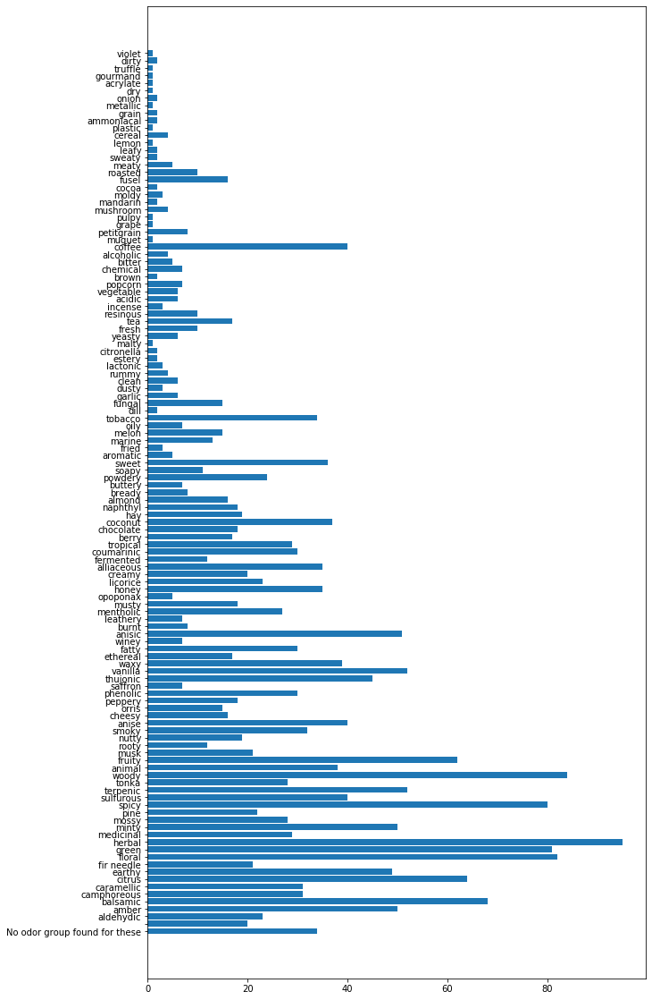

In [40]:
# histogram of edge weights,  not the degree of node....... the maximum edge weight was found to be 228,
# find vertices which has maximum edge weight, in this case, herbal and citrus
print(np.max(g.ep.weight.a))
ver = list(graph_tool.util.find_edge(g, ep_weight, np.max(g.ep.weight.a))[0])


print( g.vp['label'][ver[1]],  g.vp['label'][ver[0]])
#plt.hist(g.ep.weight.a, 20)

print(len(g.get_vertices()))

print(g.get_out_degrees(g.get_vertices())) 

g.vp['clustering'] = local_clustering(g)
outdegree= g.get_out_degrees(g.get_vertices())
print(len(vp_label.get_2d_array([0])[0]), len(outdegree))
plt.figure(figsize=(10,20))
 
plt.barh( range(0, len(outdegree)),  outdegree, align='center')
plt.yticks(range(0, len(outdegree)),vp_label.get_2d_array([0])[0] )
plt.show()

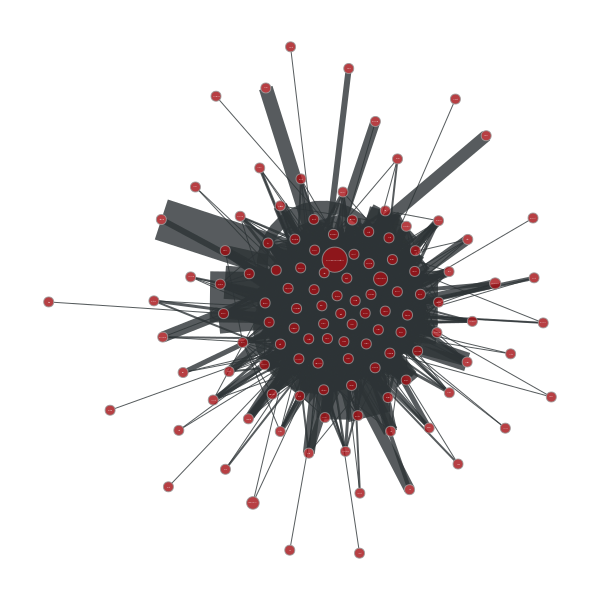

False

In [51]:
g.vp['nodesize'] = prop_to_size(local_clustering(g), mi=10, ma=20)

pos = sfdp_layout(g)

pos = graph_draw(g,pos, vertex_size=10, vertex_text=g.vp['label'], vertex_font_size=1, 
                 edge_pen_width= g.ep['weight'])


# vertex_text=g.vp['label'],, vertex_fill_color=g.vp['oil_blender'] g.vp['nodesize'] , pos,

graph_tool.topology.is_bipartite(g)


In [46]:
g

<Graph object, undirected, with 119 vertices and 1197 edges at 0x7fbf2449eb70>

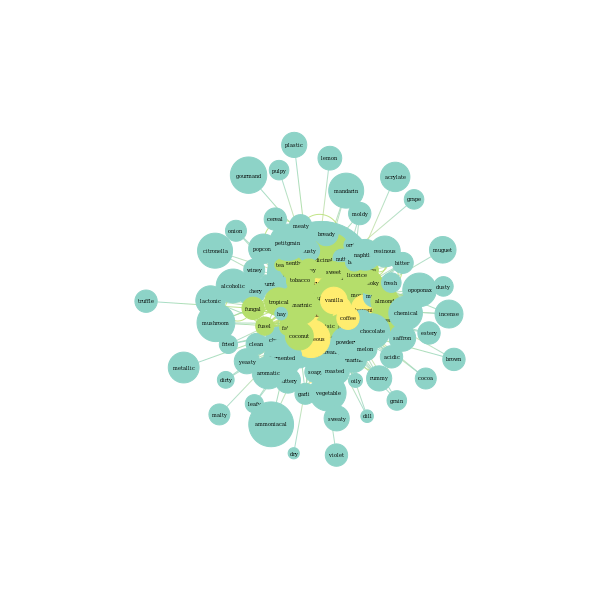

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x7fbf2449eb70, at 0x7fbf22f332b0>

In [56]:
import mpld3
mpld3.enable_notebook()
state = graph_tool.inference.minimize_blockmodel_dl(g)
state.draw( pos=pos, vertex_text=g.vp['label'], vertex_size = 10, vertex_font_size=5)

In [22]:
mdl_state, mdl = None, None
for i in range(10):
    state = gt.inference.minimize_blockmodel_dl(g, deg_corr=False)
    dl = state.entropy()
    print('DL: ', dl)
    if mdl_state == None or dl < mdl:
        mdl_state, mdl = state.copy(), dl

# Done
print('\nMDL:', mdl_state.entropy())
mdl_state.draw(pos=pos, output_size=(900, 500))

DL:  2333.0658647354458
DL:  2332.182750346402
DL:  2334.2858648294514
DL:  2336.841493772451
DL:  2336.841493772451
DL:  2334.8482179627676
DL:  2335.617113245266
DL:  2336.841493772451
DL:  2335.9122474349356
DL:  2332.3141788278112

MDL: 2332.182750346402


KeyError: ('v', 'pos')

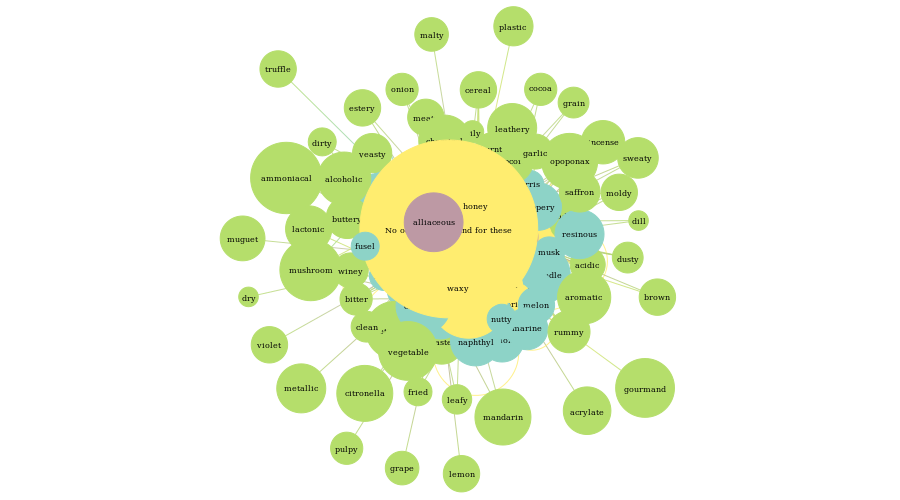

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x2b4ea1fa7dd8, at 0x2b4ea4084978>

In [24]:
mdl_state.draw(pos=pos, vertex_text=g.vp['label'], vertex_size = 10, vertex_font_size=8, output_size=(900, 500))

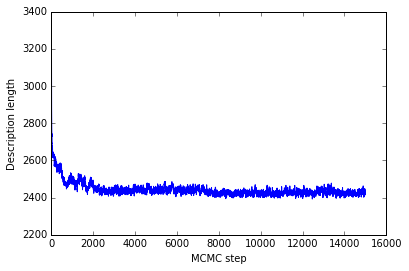

In [26]:
state = BlockState(g, B=100, deg_corr=True)

dls = []
for rep in range(15000):
    state.mcmc_sweep(niter=1)
    dls.append(state.entropy())

plt.plot(dls)
plt.ylabel('Description length')
plt.xlabel('MCMC step')
plt.show()

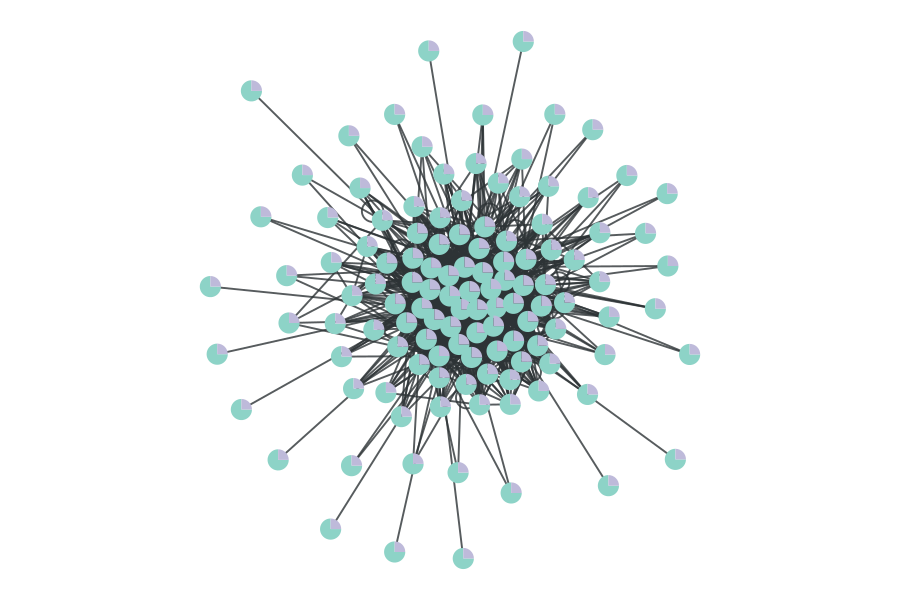

<PropertyMap object with key type 'Vertex' and value type 'vector<double>', for Graph 0x2b4ea1fa7dd8, at 0x2b4ea4084978>

In [28]:
state.draw(pos=pos, vertex_shape="pie", edge_gradient=None, output_size=(900, 600))

Mean clustering: 0.684755	 Std deviation: 0.0289611


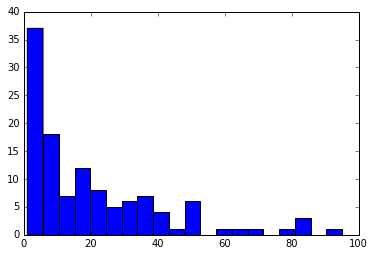

In [14]:

g.vp['clustering'] = local_clustering(g)
print('Mean clustering: %g\t Std deviation: %g' % vertex_average(g, g.vp['clustering']))

import matplotlib.pyplot as plt


import mpld3
mpld3.enable_notebook()



degree = g.get_out_degrees(g.get_vertices())
plt.hist(degree, bins=20)

t  = [i for i,v in enumerate(degree) if v >= 2000]

nam = list(blendodordict.keys())
for i in t:
    print(nam[i])

## create a bi-partite network of oils and their potential blenders

In [15]:
g = Graph(directed=False)
print(g)
Names=[]
blenderNames=[]
notFound = []
vp_label = g.new_vertex_property('string') # string property for labels
vp_oil_blender = g.new_vertex_property('double')
vp_odor_type = g.new_vertex_property('string') # string property for labels

allNames=[]

for i in range(0, len(newd)):
    try:
        Name = newd[i]['Details']['Name']
    except KeyError:
        #notFound.append(i)
        Name = newd[i]['Details']['Common Name']
        pass   
    
    if Name not in Names:
        print('oil name', Name)
        Names.append(Name)
        allNames.append(Name)
        v1 = g.add_vertex()   # add vertices corresponding to oils
        vp_label[g.vertex(g.num_vertices()-1)] = Name  
        vp_oil_blender[g.vertex(g.num_vertices()-1)] = 0
        
        if 'Odor Type' in newd[i]['Organoleptic Properties']:
            vp_odor_type[g.vertex(g.num_vertices()-1)] = newd[i]['Organoleptic Properties']['Odor Type']
        else :
            vp_odor_type[g.vertex(g.num_vertices()-1)] = 'NA'
            
        
        # add vertices realted to potential blenders

        if 'For Odor' in newd[i]['Potential Blenders']:
            for odor in newd[i]['Potential Blenders']['For Odor'].keys():
                for blender in newd[i]['Potential Blenders']['For Odor'][odor]['Name']:
                    if blender not in blenderNames:
                        blenderNames.append(blender)
                        allNames.append(blender)
                        v2 = g.add_vertex()   # add vertices corresponding to oils
                        vp_label[g.vertex(g.num_vertices()-1)] = blender  
                        vp_oil_blender[g.vertex(g.num_vertices()-1)] = 1
                        vp_odor_type[g.vertex(g.num_vertices()-1)] = odor
                        print('blender name', blender)
                    else:
                        index = allNames.index(blender) # if blender is also in the list of main oil, find the index
                        #gt.util.find_vertex(g, vp_label, match)
                        v2 = g.vertex(index)
                        print('already blender exists', blender)
                    g.add_edge(v1, v2)

        else :
            print('stupid')
        
        
    else:
        print('repetition of node')
    
    
g.vp['label'] = vp_label
g.vp['oil_blender'] = vp_oil_blender
g.vp['odor_type'] = vp_odor_type
print(g.list_properties()) 
#print(list(zip( vp_label.get_2d_array([0])[0],  g.vp['oil_blender'].a, vp_odor_type.get_2d_array([0])[0])))

#print(vp_odor_type.get_2d_array([0]))

<Graph object, undirected, with 0 vertices and 0 edges at 0x2b1e504f7710>
oil name abies alba cone oil
blender name juniperus oxycedrus l. leaf oil
blender name pinus sylvestris l. leaf oil
already blender exists pinus sylvestris l. leaf oil
already blender exists pinus sylvestris l. leaf oil
blender name citrus × bergamia peel oil
already blender exists citrus × bergamia peel oil
blender name delta-3-carene
blender name (Z)-4-decenal diethyl acetal
blender name 2,4-dimethyl-3-cyclohexene-1-methanyl acetate
blender name dipentene
blender name (+)-nootkatone
blender name citrus aurantium l. peel oil bitter terpeneless
blender name valencene
blender name ferula galbaniflua resin oil
blender name galbanum specialty
blender name decanal (aldehyde C-10)
blender name dodecanal (aldehyde C-12 lauric)
blender name abies alba leaf extract
blender name abies alba leaf oil
blender name abies balsamea needle oil
blender name abies balsamea balsam extract
blender name dextro,laevo-borneol
blender n

already blender exists alpha-bisabolol
blender name citrus propanol
already blender exists geranyl acetate
already blender exists grapefruit menthane
already blender exists para-cymene
already blender exists juniperus communis l. fruit oil
already blender exists alpha-phellandrene
already blender exists gamma-terpinene
blender name apple specialty
blender name nerolidyl isobutyrate
blender name pear valerate
already blender exists kunzea ericoides leaf oil
oil name abies lasiocarpa oil canada
already blender exists juniperus oxycedrus l. leaf oil
already blender exists (E)-sabinene hydrate
already blender exists abies alba cone extract
already blender exists abies grandis oil canada
already blender exists aquilaria agallocha oil
already blender exists (+)-camphene
already blender exists camphene
already blender exists (-)-camphene
already blender exists cistus ladaniferus l. twig/leaf absolute
already blender exists copaifera reticulata
already blender exists pseudotsuga menziesii oil


already blender exists palmitic acid
oil name actinidia chinensis fruit water
blender name 3-decen-2-one
blender name hexyl pivalate
blender name methyl (E)-2-hexenoate
blender name methyl 2-hexenoate
blender name verdoxan
blender name (R)-citronellyl nitrile
blender name citrus specialty
blender name 2-heptanol
blender name isoamyl benzoate
already blender exists fir carboxylate
blender name hexyl cinnamate
blender name acetaldehyde benzyl 2-methoxyethyl acetal
blender name actinidia chinensis fruit extract
blender name allyl phenethyl ether
blender name butyl 2-methyl butyrate
blender name black currant bud absolute replacer
blender name alpha-decalactone
blender name ethyl (E)-2-hexenoate
blender name ethyl (E)-4-decenoate
already blender exists galbanum specialty
blender name green dioxolane
blender name green note propionate
blender name herbal cyclohexane
blender name hexanal (aldehyde C-6)
blender name (Z)-3-hexen-1-yl (E)-2-hexenoate
blender name (Z)-3-hexen-1-yl 2-methyl butyr

already blender exists abies balsamea l. mill needle oil
already blender exists fir needle oil terpeneless canada
already blender exists guaiyl butyrate
already blender exists tsuga heterophylla oil
already blender exists juniperus communis l. fruit absolute
already blender exists commiphora spp. absolute
already blender exists commiphora myrrha gum
already blender exists commiphora myrrha resin
already blender exists commiphora myrrha resinoid
already blender exists balsamodendron kafal absolute
already blender exists myroxylon toluiferum l. resin
blender name valeriana officinalis l. rhizome absolute
already blender exists ferula galbaniflua resinoid
blender name isogreen methanoindene
blender name perilla alcohol
blender name rosa centifolia leaf absolute
already blender exists valeriana officinalis l. rhizome oil CO2 extract
blender name apium graveolens l. seed oil
already blender exists artemisia vestita wall. leaf oil
already blender exists cananga fruit oil
already blender exis

blender name satureja hortensis l. oil
blender name 2,6-xylenol
blender name illicium verum fruit oil
oil name medicago sativa l. oil
already blender exists 3-decen-2-one
already blender exists hexyl pivalate
already blender exists methyl 2-hexenoate
blender name 5-methyl-5-hexen-2-one
blender name salvia sclarea l. resin
blender name herbal ketone
blender name oregano specialty
already blender exists tricyclodecyl acetate
blender name para-cresyl isobutyrate
blender name 3-methyl-1-pentanol
already blender exists fir carboxylate
already blender exists picea mariana leaf absolute
already blender exists acetaldehyde benzyl 2-methoxyethyl acetal
blender name acetaldehyde methyl hexyl acetal
already blender exists actinidia chinensis fruit extract
blender name medicago sativa l. absolute
blender name medicago sativa l. resinoid
already blender exists allyl phenethyl ether
blender name bark carbaldehyde
already blender exists butyl 2-methyl butyrate
blender name butyl heptanoate
blender na

already blender exists pimenta officinalis lindl. powder
already blender exists pimenta officinalis lindl. fruit absolute
already blender exists pimenta officinalis lindl. fruit oil
already blender exists pimenta officinalis lindl. fruit oil CO2 extract
already blender exists pimenta officinalis lindl. fruit oil terpeneless
already blender exists pimenta officinalis lindl. essence
already blender exists allspice fragrance
already blender exists pimenta officinalis lindl. leaf oil terpeneless
already blender exists pimenta officinalis lindl. oil
already blender exists pimenta officinalis lindl. oleoresin
already blender exists artemisia dracunculus l. herb oil
blender name atractylis ovata l. root oil
already blender exists acorus calamus l. leaf oil
already blender exists canella bark oil
already blender exists carvacrol
already blender exists caryophyllene
already blender exists beta-caryophyllene
already blender exists alpha-caryophyllene alcohol
blender name cassia bark concrete
alr

already blender exists atractylis ovata l. root oil
already blender exists atractylis ovata l. root
already blender exists croton eluteria bark oil
already blender exists cymbopogon citratus leaf extract oxidized
already blender exists alpinia officinarum
already blender exists alpinia officinarum l. root oil
already blender exists ginger infusions
already blender exists ginger oil terpenes
already blender exists zingiber officinale rosc. oleoresin
already blender exists zingiber officinale rosc. oleoresin
already blender exists zingiber officinale rosc. root absolute
already blender exists zingiber officinale rosc. root essence
already blender exists zingiber officinale rosc. root oil
already blender exists zingiber officinale rosc. root oil
already blender exists zingiber officinale rosc. root oil
already blender exists zingiber officinale rosc. root oil CO2 extract
already blender exists ginger root oil CO2 extract australia
already blender exists zingiber officinale rosc. root oil


already blender exists santalol
blender name santalum album l. extract
blender name santalum album l. wood extract
already blender exists santalum paniculatum wood oil
already blender exists (+)-alpha-santalyl acetate
blender name santalyl acetate
blender name santalyl phenyl acetate
already blender exists santol pentenol
blender name beta,2,2,3-tetramethyl-delta-methylene-3-cyclopentene-1-butanol
already blender exists timber propanol
blender name 3(or 2),4,5-trimethyl octahydro-4,7-methanoinden-5-yl acetate
already blender exists vetiver oil acetylated
already blender exists vetiverol
blender name vetiveryl acetate
blender name vetiveryl formate
already blender exists woody epoxide
already blender exists acetoxymethyl isolongifolene
already blender exists muscomer
already blender exists zingerone
already blender exists veratraldehyde
already blender exists geranium nitrile
blender name methyl (Z)-5-octenoate
already blender exists amyris balsamifera oil
already blender exists brachyl

blender name marine formate
blender name melaleuca bracteata leaf oil
already blender exists gamma-muurolene
blender name origanum vulgare ssp. vulgare oil himalaya
already blender exists polylimonene
already blender exists santol pentenol
blender name tetrahydromugol
already blender exists 2-octanone
already blender exists neroli ketone
blender name isocyclocitral (IFF)
blender name dicyclopentadiene propionate
blender name alpha-hexyl cinnamaldehyde dimethyl acetal
blender name para-methyl hydratropaldehyde
blender name 1-allyl-2,2,7,7-tetramethyl cycloheptanol
blender name angelica archangelica l. seed extract
already blender exists anthemis nobilis l. flower extract
blender name arnica montana l. extract
blender name arnica montana l. flower oil CO2 extract
already blender exists artemisia vestita wall. leaf oil
blender name bornyl 2-methyl butyrate
blender name bornyl butyrate
already blender exists delta-cadinene
already blender exists calamintha clinopodium oil
already blender e

already blender exists angelica archangelica l. seed extract
already blender exists angelica archangelica l. oil
already blender exists angelica archangelica l. seed absolute
already blender exists levisticum officinale koch root oil
already blender exists angelica archangelica l. leaf oil
already blender exists angelica archangelica l. seed oil
oil name illicium verum oil CO2 extract
blender name 2,6-dimethyl naphthalene
blender name illicium verum fruit extract
blender name amyl furoate
blender name (Z)-anethol
blender name para-anisyl propanal
already blender exists dihydroanethol
already blender exists estragole
blender name ethyl para-anisate
already blender exists ocimum basilicum l. herb oil
already blender exists ocimum basilicum l. leaf oil
blender name sassafras acetate
blender name 4-methoxy-alpha-toluene thiol
blender name tiglyl tiglate
blender name licorice diethyl acetal
already blender exists tricyclodecenyl isobutyrate
already blender exists artemisia dracunculus l. he

already blender exists piper nigrum l. oil CO2 extract
already blender exists schinus molle l. berry absolute
already blender exists schinus molle l. berry oil
already blender exists piper longum l. oil
already blender exists piper longum l. fruit oil CO2 extract
already blender exists spicy carbonate
already blender exists sugandha kokila berry oil
already blender exists (E)-tiglic acid
already blender exists turmeric root absolute
already blender exists zingiber officinale rosc. root extract
already blender exists zingiber officinale rosc. root tincture
already blender exists musk indenofuran
already blender exists vetiveryl propionate
already blender exists musk indanone
already blender exists acorus calamus l. rhizome oil
already blender exists ocimum basilicum l. absolute
already blender exists calamintha clinopodium oil
already blender exists canarium indicum l. oil
already blender exists salvia sclarea l. oil
already blender exists anethum graveolens l. fruit oil
already blender

already blender exists artemisia absinthium l. oil
already blender exists isobutyl quinoline
already blender exists isoeugenyl formate
already blender exists tobacco specialty
already blender exists 2-octenal
already blender exists (E)-2-octenal
already blender exists pimenta officinalis lindl. fruit oil
already blender exists pimenta officinalis lindl. leaf oil
already blender exists isobutyl angelate
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum verum bark oil
already blender exists syzygium aromaticum l. bud absolute
already blender exists syzygium aromaticum l. bud oil
already blender exists syzygium aromaticum l. bud oil CO2 extract
already blender exists piper cubeba fruit oil
already blender exists (-)-cubenol
already blender exists cuminaldehyde
already blender exists isocyclogeraniol (IFF)
already blender exists 4-ethyl guaiacol
already blender exists eugenol
already blender exists laurus nobilis l. leaf oil
blender name levisticum officina

already blender exists theaspirane
already blender exists thymus vulgaris l. absolute
already blender exists tricyclodecyl acetate
already blender exists viridiflorol
already blender exists artemisia absinthium l. herb oil
already blender exists artemisia absinthium l. herb oil
already blender exists artemisia absinthium l. oil
already blender exists isobutyl angelate
already blender exists cuminaldehyde
already blender exists origanum majorana l. oil
already blender exists outdoors specialty
already blender exists spicy carbonate
already blender exists ethyl 4-pentenoate
already blender exists 2-isobutyl-3-methyl pyrazine
already blender exists cassis oxime 10%
already blender exists coriandrum sativum l. herb oil
already blender exists cymbopogon validus leaf oil
already blender exists dictamnus hispanicus oil
already blender exists dihydrocitronellyl ethyl ether
already blender exists dihydrorose oxide
already blender exists dimethyl benzyl carbinyl butyrate
already blender exists 2

already blender exists aquilaria agallocha oil CO2 extract
already blender exists agarwood specialty
already blender exists angelica archangelica l. root extract
already blender exists angelica archangelica l. root tincture
already blender exists angelica archangelica l. root water
already blender exists bulnesia sarmientoi extract
already blender exists cadinene
already blender exists camphene
already blender exists (+)-camphene
already blender exists cedarwood oil texas fractions
already blender exists cistus ladaniferus l. twig/leaf absolute
already blender exists copaifera reticulata
already blender exists cupressus sempervirens l. essence
already blender exists dalbergia sissoo leaf oil
already blender exists dihydro-alpha-terpinyl acetate
already blender exists fougere woody fragrance
already blender exists alpha-guaiene
already blender exists kaempferia galanga l. rhizome oil
already blender exists laitone
already blender exists manevoro oil
already blender exists marine formate

already blender exists 2-methyl undecanal dimethyl acetal
blender name abronia fragrance
already blender exists acetaldehyde citronellyl methyl acetal
already blender exists aldehydic nitrile
already blender exists beta-bisabolol
already blender exists citral
blender name (E)-citral
blender name (Z)-citral
already blender exists citral / methyl anthranilate schiff's base
already blender exists citral dimethyl acetal
already blender exists citral ethylene glycol acetal
already blender exists citral propylene glycol acetal
already blender exists cymbopogon nardus rendle oil
already blender exists citronellyl nitrile
blender name citrus limon extract
blender name citrus medica var. limonum flower/leaf/stem extract
blender name citrus medica var. limonum fruit extract
blender name citrus medica var. limonum fruit oil
blender name citrus medica var. limonum fruit water
blender name citrus medica var. limonum juice extract
blender name citrus medica var. limonum juice powder
blender name cit

already blender exists rhubarb oxirane
blender name elettaria cardamomum l. absolute
already blender exists isoeugenyl ethyl acetal
already blender exists heliotropyl diethyl acetal
already blender exists (Z)-jasmone
blender name rosa damascena mill. flower oil
already blender exists polianthes tuberosa l. absolute (from concrete)
already blender exists polianthes tuberosa l. absolute (from pommade)
already blender exists cananga odorata hook. f. and thomas. flower absolute
already blender exists cinnamyl isobutyrate
already blender exists calendula officinalis l. absolute
already blender exists salvia sclarea l. absolute
already blender exists sambucus canadensis extract
already blender exists pimenta officinalis lindl. oleoresin
already blender exists amyl isoeugenol
already blender exists homoanisaldehyde
already blender exists cinnamyl acetate
already blender exists isocyclogeraniol (IFF)
blender name elemicin
already blender exists isoeugenyl acetate
already blender exists (E)-par

already blender exists isobutyl angelate
already blender exists cinnamaldehyde dimethyl acetal
already blender exists cinnamyl propionate
already blender exists syzygium aromaticum l. bud oil
already blender exists piper cubeba fruit oil
already blender exists cuminum cyminum l. fruit absolute
already blender exists cuminaldehyde
already blender exists ribes nigrum l. bud absolute
already blender exists isocyclogeraniol (IFF)
already blender exists elettaria cardamomum l. seed oil
already blender exists isoeugenyl acetate
already blender exists cymbopogon martini var. sofia oil
already blender exists 2-octanol
already blender exists pimenta racemosa mill. leaf oil
already blender exists spicy carbonate
already blender exists curcuma longa l. root oil
already blender exists artemisia annua herb oil
already blender exists zanthoxylum piperitum fruit absolute CO2 extract
already blender exists alpha-allyl-4,6-dimethyl-3-cyclohexene-1-methanyl acetate
already blender exists isoamyl 3-(2-fu

already blender exists 6,8-dimethyl-2-nonanol
already blender exists 3,6-dimethyl-3-octanol
already blender exists epoxylinalyl acetate
already blender exists ethyl linalool
already blender exists ethyl linalyl acetal
already blender exists ethyl linalyl acetate
already blender exists ethyl linalyl ether
already blender exists floral butanal
already blender exists floral pyranol
already blender exists geraniol
already blender exists pelargonium graveolens stem leaf oil
already blender exists geranyl acetone
already blender exists geranyl formate
already blender exists geranyl isobutyrate
already blender exists geranyl propionate
already blender exists heliotropin
already blender exists heliotropyl acetone
already blender exists (Z)-3-hexen-1-yl salicylate
already blender exists alpha-hexyl cinnamaldehyde
already blender exists cinnamomum camphora l. linalooliferum leaf oil
already blender exists cinnamomum camphora l. linalooliferum wood oil
already blender exists jasmin cyclopentanol


already blender exists helichrysum italicum flower oil
blender name lavender specialty
already blender exists calendula officinalis l. flower oil
already blender exists piper cubeba fruit oil
already blender exists isoeugenol
already blender exists safrole
already blender exists sassafras albidum (nuttall) nees oil
already blender exists spicy carbonate
already blender exists isoamyl 3-(2-furan) propionate
already blender exists isobutyl benzyl carbinol
already blender exists chrysanthemum oxide
blender name coriander heptenol
blender name decanal propylene glycol acetal
already blender exists earthy acetal
already blender exists isogreen methanoindene
already blender exists (E)-2-hexen-1-yl salicylate
already blender exists hyacinthus orientalis l. absolute
blender name ivy carbaldehyde / methyl anthranilate schiff's base
already blender exists ivy dioxolane
blender name michelia alba dc. leaf oil
already blender exists methyl cyclocitrone (IFF)
already blender exists para-methyl hydr

already blender exists lantana camara l. flower oil
already blender exists calendula officinalis l. flower oil
already blender exists rosmarinus officinalis l. absolute
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. oil
already blender exists camellia sinensis l. absolute
already blender exists valeriana officinalis l. rhizome oil
already blender exists valeriana officinalis l. rhizome oil
already blender exists amyris balsamifera oil
already blender exists abies balsamea balsam extract
already blender exists styrax tonkinensis craib ex hartwiss resin
already blender exists styrax tonkinensis craib ex hartwiss resinoid
already blender exists laevo-bornyl acetate
already blender exists brachyleana hutchinsii wood oil
already blender exists callitropsis arau

already blender exists woody epoxide
already blender exists woody ether
already blender exists woody propanol
already blender exists geranium macrorrhizum l. absolute
already blender exists geranium macrorrhizum l. oil
already blender exists (Z)-linalool oxide (furanoid)
already blender exists amber naphthofuran
already blender exists amber spirolene
already blender exists hibiscus abelmoschus l. seed absolute
already blender exists cistus ladaniferus l. resinoid
already blender exists cistus ladaniferus l. absolute
already blender exists cistus ladaniferus l. oil
already blender exists rum extract
already blender exists isopulegyl acetate
already blender exists 1-benzoyl acetone
already blender exists laevo-borneol
already blender exists brachyleana hutchinsii wood oil
already blender exists guaiacyl phenyl acetate
already blender exists commiphora erythraea var. glabrescens engle absolute
already blender exists opoponax resinoid (commiphora erythraea var. glabrescens engle)
already b

already blender exists sabinene
already blender exists alpha-terpinene
already blender exists tobacco absolute replacer
already blender exists acacia farnesiana l. willd. absolute
already blender exists linalool
already blender exists (Z)-beta-ocimene
already blender exists (Z,E)-phytol
already blender exists pimenta officinalis lindl. fruit oil
already blender exists pimenta officinalis lindl. fruit oil terpeneless
already blender exists pimenta officinalis lindl. leaf oil
already blender exists pimenta officinalis lindl. leaf oil terpeneless
already blender exists pimenta officinalis lindl. oil
already blender exists pimenta officinalis lindl. oleoresin
already blender exists carvacrol
already blender exists 4-carvomenthenol
already blender exists beta-caryophyllene
already blender exists cinnamomum culilawan bark oil
already blender exists cinnamomum culilawan leaf oil
already blender exists cinnamon leaf oil replacer
already blender exists dihydroeugenol
already blender exists 4-et

already blender exists cymbopogon nardus rendle oil
already blender exists galbanum oleoresin
already blender exists ferula galbaniflua resinoid
already blender exists valeriana officinalis l. rhizome oil CO2 extract
already blender exists artemisia vestita wall. leaf oil
already blender exists calendula officinalis l. flower oil CO2 extract
already blender exists cananga fruit oil
already blender exists canarium spp. oil
already blender exists salvia sclarea l. oil
already blender exists canarium indicum l. resinoid
already blender exists calendula officinalis l. flower oil
already blender exists rosmarinus officinalis l. absolute
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. oil
already blender exists camellia sinensis l. absolute
already blender exists

already blender exists rosmarinus officinalis l. oil
already blender exists camellia sinensis l. absolute
already blender exists valeriana officinalis l. rhizome oil
already blender exists valeriana officinalis l. rhizome oil
already blender exists amyl isoeugenol
already blender exists cananga odorata hook. f. and thomas. oil
already blender exists dianthus caryophyllus absolute
already blender exists cinnamaldehyde / methyl anthranilate schiff's base
already blender exists cinnamomum culilawan bark oil
already blender exists cinnamyl acetate
already blender exists syzygium aromaticum l. bud oil
already blender exists elettaria cardamomum l. seed oil
already blender exists isoeugenyl acetate
already blender exists myristica fragrans houtt. fruit extract
already blender exists myristica fragrans houtt. seed tincture
already blender exists myristica fragrans houtt. absolute
blender name populus nigra l. bud absolute
already blender exists eremophila mitchelli wood oil australia
already 

blender name prenyl tiglate
already blender exists artemisia vestita wall. leaf oil
already blender exists calendula officinalis l. flower oil CO2 extract
already blender exists cananga fruit oil
already blender exists canarium spp. oil
already blender exists canarium indicum l. resinoid
already blender exists eucalyptus citriodora oil
already blender exists calendula officinalis l. flower oil
already blender exists methyl ortho-anisate
already blender exists rosmarinus officinalis l. absolute
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. leaf oil
already blender exists rosmarinus officinalis l. oil
already blender exists camellia sinensis l. absolute
already blender exists valeriana officinalis l. rhizome oil
already blender exists valeriana officinalis l. rhizome oil
already blender exists ilex paraguariensis 

already blender exists calamenene
already blender exists bornyl methyl ether
already blender exists octyl phenyl acetate
already blender exists costus valerolactone
already blender exists isobutyl angelate
already blender exists caraway seed oleoresin
already blender exists carvacryl ethyl ether
already blender exists trans-carveol
already blender exists cis-carveol
already blender exists cinnamomum cassia blume bark oil
already blender exists syzygium aromaticum l. bud oil
already blender exists piper cubeba fruit oil
already blender exists cuminyl alcohol
already blender exists alpha-methyl cinnamaldehyde
already blender exists 4-isopropyl-2-cyclohexenone
already blender exists sec-butyl-3-methyl but-2-ene thioate
already blender exists 3-hepten-2-one
already blender exists hexyl 2-methyl butyrate
already blender exists phenyl acetaldehyde
already blender exists privet dioxane
already blender exists 2-propenyl-para-cymene
already blender exists styralyl acetate
already blender exists

already blender exists isojasmone
already blender exists narcissus jonquilla l. absolute
already blender exists jonquil absolute replacer
already blender exists leptactina senegambica hook absolute
already blender exists lavandin concrete decolorized
already blender exists lavandula hydrida herb oil
already blender exists lavandula angustifolia l. flower oil
already blender exists lavender absolute replacer
already blender exists lavandula angustifolia l. herb oil
already blender exists lavandula angustifolia l. herb oil
already blender exists lavandula angustifolia l. herb oil
already blender exists lavandula angustifolia l. herb oil
already blender exists lavender oil replacer
already blender exists lilyall
already blender exists laevo-linalool
already blender exists ortho-methoxybenzyl ethyl ether
already blender exists 1-(2-methyl allyl oxy)-2-methyl butane
already blender exists methyl dihydrojasmonate
already blender exists acacia dealbata absolute
already blender exists nerolido

blender name green heptenal
already blender exists heptanal (aldehyde C-7)
already blender exists heptanal dimethyl acetal
already blender exists (E)-4-hexen-1-ol
already blender exists (Z)-4-hexen-1-ol
already blender exists (Z)-3-hexen-1-yl formate
already blender exists (Z)-3-hexen-1-yl phenyl acetate
already blender exists (E)-2-hexen-1-yl valerate
already blender exists 3-hexenal
already blender exists 3-hexenyl 2-methyl butyrate
already blender exists hexyl 2-methyl butyrate
already blender exists hexyl butyrate
already blender exists hexyl phenyl acetate
already blender exists ivy carbaldehyde / methyl anthranilate schiff's base
already blender exists hedera helix l. leaf absolute
already blender exists melon nonenoate
already blender exists (E,Z)-3,6-nonadien-1-ol
already blender exists (Z,Z)-3,6-nonadien-1-ol
already blender exists 3,6-nonadien-1-yl acetate
already blender exists octanal diethyl acetal
already blender exists (Z)-5-octen-1-yl propionate
already blender exists (

already blender exists cinnamyl acetate
already blender exists cinnamyl nitrile
already blender exists (E)-cinnamyl nitrile
already blender exists syzygium aromaticum l. bud absolute
already blender exists syzygium aromaticum l. bud oil
already blender exists syzygium aromaticum l. bud oil CO2 extract
already blender exists croton eluteria bark oil
already blender exists 1,5-dimethyl-3-n-pentyl-2-oxabicyclo(2.2.2)octane
already blender exists eugenol
already blender exists isoeugenyl acetate
already blender exists eugenyl acetate
already blender exists alpinia officinarum l. root oil
already blender exists zingiber officinale rosc. oleoresin
already blender exists zingiber officinale rosc. root oil
already blender exists aframomum melegueta rosc. oil
already blender exists green oxane
already blender exists myristica fragrans houtt. absolute (mace)
already blender exists myristica fragrans houtt. kernel oil
already blender exists machilus kusanoi leaf oil
already blender exists machilu

already blender exists (Z)-cinnamaldehyde
already blender exists cinnamaldehyde
already blender exists (E)-cinnamaldehyde
already blender exists cinnamaldehyde / methyl anthranilate schiff's base
already blender exists cinnamaldehyde butylene glycol acetal
already blender exists cinnamaldehyde diethyl acetal
already blender exists cinnamaldehyde dimethyl acetal
already blender exists cinnamaldehyde ethylene glycol acetal
already blender exists cinnamaldehyde propylene glycol acetal
already blender exists cinnamomum cassia blume bark absolute
already blender exists cinnamomum cassia blume bark extract
already blender exists cinnamomum cassia blume leaf extract
already blender exists cinnamomum cassia blume oil
already blender exists cinnamomum cassia blume tincture
already blender exists cinnamomum verum bark extract
already blender exists cinnamomum verum water
already blender exists cinnamomum verum bark powder
already blender exists cinnamomum verum leaf extract
already blender exist

already blender exists marine formate
already blender exists melaleuca bracteata leaf oil
already blender exists 2-methoxy-4-vinyl phenol
already blender exists methyl cedryl ketone
already blender exists methyl cedryl ketone replacer
already blender exists myoporum crassifolium wood oil
already blender exists patchouli ethanone
already blender exists pogostemon cablin oil
already blender exists polylimonene
already blender exists sandal pentanol
already blender exists santall
already blender exists santol pentenol
already blender exists sclareolide
already blender exists fokiena hodginsii wood oil
already blender exists tsuga canadensis l. leaf oil
already blender exists cryptomeria japonica d. don. wood oil
already blender exists tetrahydromugol
already blender exists thuja occidentalis l. leaf extract
already blender exists thujopsis dolabrata l. wood oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists violet propanol
already blender exists woody 

already blender exists caryophyllene alcohol acetate
already blender exists cedanol
already blender exists cedar cyclododecatriene
already blender exists cedar fragrance
already blender exists cedar specialty
already blender exists cedarwood essence texas
already blender exists cedarwood essence virginia
already blender exists cedarwood fragrance
already blender exists cedrus atlantica wood oil terpeneless
already blender exists epoxidized cedarwood oil
already blender exists cedarwood oil alcohols
already blender exists cedarwood oil atlanta
already blender exists cupressus funebris wood oil
already blender exists cedrus deodara (roxb.) loud. wood oil
already blender exists cedarwood oil terpenes
already blender exists juniperus mexicana wood oil
already blender exists juniperus virginiana wood oil
already blender exists cedarwood oil white
already blender exists cedrela odorata l. wood oil
already blender exists cedrene
already blender exists alpha-cedrene
already blender exists cedr

already blender exists guaiyl acetate
already blender exists tsuga heterophylla oil
already blender exists juniperus communis l. fruit absolute
already blender exists commiphora myrrha resin
already blender exists commiphora erythraea var. glabrescens engle resin
already blender exists sclareol
already blender exists liquidambar styraciflua resinoid
already blender exists myroxylon toluiferum l. resinoid
already blender exists valeriana officinalis l. rhizome absolute
already blender exists dextro-camphor
already blender exists fenchol
blender name dimethyl ionone
blender name alpha-methyl ionone
already blender exists (E)-alpha-methyl ionone (44-50%)
already blender exists ortho-guaiacol
blender name isoamyl laurate
already blender exists angelica archangelica l. seed oil
already blender exists boswellia carteri birdw. oil
already blender exists juniperus communis l. branch oil
already blender exists pinus mugo turra var. pumilio (haenke) zenari oil
already blender exists amber decatr

already blender exists formoxymethyl isolongifolene
already blender exists hydroxymethyl isolongifolene 50% in dpg
already blender exists cistus ladaniferus l. absolute
already blender exists sesamum indicum l. absolute
already blender exists sesamum indicum l. absolute CO2 extract
already blender exists vetiveryl propionate
already blender exists balsam specialty
already blender exists fruity butanate
already blender exists beta-ionyl ethyl ether
already blender exists artemisia vestita wall. leaf oil
already blender exists calendula officinalis l. flower oil CO2 extract
already blender exists (+)-alpha-campholenic aldehyde
already blender exists cananga fruit oil
already blender exists canarium spp. oil
already blender exists canarium indicum l. resinoid
already blender exists herbal undecanone
already blender exists calendula officinalis l. flower oil
already blender exists (1S,5R)-myrtenyl acetate
already blender exists romanal
already blender exists rosmarinus officinalis l. absol

already blender exists spicy carbonate
already blender exists (E)-tiglic acid
already blender exists turmeric root absolute
already blender exists vanillin propylene glycol acetal
already blender exists amyris balsamifera oil
already blender exists 1-benzoyl acetone
already blender exists cedar forest fragrance
already blender exists boswellia carteri birdw. absolute
already blender exists guaiyl acetate
already blender exists tsuga heterophylla oil
already blender exists balsamodendron kafal absolute
already blender exists dehydro beta-linalool
already blender exists anthemis nobilis l. flower oil
already blender exists canarium indicum l. oil
already blender exists carum carvi l. seed oil
already blender exists clary specialty
already blender exists daucus carota l. fruit oil
already blender exists herbal carene
already blender exists lavandin water absolute
already blender exists (1S,5R)-myrtenyl acetate
already blender exists petroselinum crispum seed oil
already blender exists bet

already blender exists 1,8-cineole
already blender exists 2,10-epoxypinane
already blender exists eucalyptus globulus leaf oil
already blender exists eucalyptus radiata australiana leaf/stem oil
already blender exists geranic oxide
already blender exists herbal acetal
already blender exists herbal dioxane
already blender exists hyssopus officinalis l. extract
already blender exists hyssopus officinalis l. leaf tincture
already blender exists lavandula hydrida absolute
already blender exists lavandula hydrida absolute decolorized
already blender exists lavandula hydrida concrete
already blender exists lavandula latifolia herb absolute
already blender exists lavandula angustifolia l. absolute
already blender exists lavandula latifolia herb oil
already blender exists levisticum officinale koch absolute
already blender exists matricaria chamomilla l. flower oil
blender name melaleuca quinquenervia water
already blender exists melaleuca quinquenervia oil
already blender exists thymus capita

already blender exists (E)-nerolidol
already blender exists nerolidol
already blender exists neryl acetate
already blender exists neryl formate
already blender exists nonanol
already blender exists 3-nonanone
already blender exists ocean propanal
already blender exists (Z)-beta-ocimene
already blender exists orris pyridine 25% IPM
already blender exists peony alcohol
already blender exists phenethyl acetate
already blender exists isophytol
already blender exists prenyl salicylate
already blender exists rose butanoate
already blender exists rosa damascena mill. flower oil
already blender exists rose pyran
already blender exists terpinyl isobutyrate
already blender exists tetrahydrolinalool
already blender exists 5-tricyclodecenyl acetate
already blender exists polianthes tuberosa l. absolute (from concrete)
already blender exists polianthes tuberosa l. absolute (from pommade)
already blender exists violet methyl carbonate
already blender exists cananga odorata hook. f. and thomas. flowe

already blender exists santalum austrocaledonicum wood oil
already blender exists santalum spicata wood oil
already blender exists santall
already blender exists santalum paniculatum wood oil
already blender exists santalyl butyrate
already blender exists fokiena hodginsii wood oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiverol
already blender exists (Z)-woody amylene
already blender exists sesamum indicum l. absolute
already blender exists sesamum indicum l. absolute CO2 extract
already blender exists amyris balsamifera oil
already blender exists abies balsamea balsam extract
already blender exists styrax tonkinensis craib ex hartwiss resin
already blender exists styrax tonkinensis craib ex hartwiss resinoid
already blender exists laevo-bornyl acetate
already

already blender exists (Z)-cinnamaldehyde
already blender exists cinnamaldehyde / methyl anthranilate schiff's base
already blender exists cinnamaldehyde diethyl acetal
already blender exists cinnamaldehyde dimethyl acetal
already blender exists cinnamaldehyde ethylene glycol acetal
already blender exists cinnamaldehyde propylene glycol acetal
already blender exists cinnamomum cassia blume bark absolute
already blender exists cinnamomum cassia blume bark extract
already blender exists cinnamomum cassia blume oil
already blender exists cinnamomum cassia blume tincture
already blender exists cinnamomum verum bark extract
already blender exists cinnamomum verum water
already blender exists cinnamomum verum leaf extract
already blender exists cinnamon acrolein
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum ver

already blender exists amber romance fragrance
already blender exists aquilaria agallocha oil
already blender exists aquilaria agallocha oil CO2 extract
already blender exists agarwood specialty
already blender exists bulnesia sarmientoi extract
already blender exists cedrus atlantica wood oil
already blender exists cedarwood oil texas fractions
blender name cistus ladaniferus l. essence
already blender exists cistus ladaniferus gum
blender name cistus ladaniferus l. twig extract
already blender exists cistus ladaniferus l. twig/leaf absolute
already blender exists cistus ladaniferus l. twig/leaf oil
already blender exists copaifera reticulata
already blender exists alpha-guaiene
already blender exists kaempferia galanga l. rhizome oil
already blender exists cistus ladaniferus l. concrete
already blender exists labdanum ethanone
blender name cistus spp. oleoresin
blender name cistus ladaniferus l. twig oil
already blender exists manevoro oil
already blender exists sandal cyclohexanol
a

already blender exists alpha-hexyl cinnamaldehyde
already blender exists cinnamomum camphora l. linalooliferum leaf oil
already blender exists hydroxycitronellal
blender name hydroxycitronellal residue
already blender exists leerall
already blender exists lilyall
already blender exists linalool
already blender exists laevo-linalool
already blender exists linalool oxide
already blender exists nerol
already blender exists neryl acetate
already blender exists ocean propanal
already blender exists orris pyridine 25% IPM
already blender exists cymbopogon martini roxb. stapf. oil
already blender exists citrus aurantium l. leaf oil
already blender exists rhodinol
already blender exists tetrahydrolinalool
already blender exists cupressus sempervirens l. leaf oil
already blender exists alpha-terpineol
already blender exists bicyclogermacrene
already blender exists 3,7-dimethyl-6-octenoic acid
already blender exists 2,4-ivy carbaldehyde
already blender exists [(4E,4Z)-5-methoxy-3-methyl-4-penten

already blender exists grapefruit acetal
already blender exists 3-hexanone
already blender exists (Z)-3-hexen-1-yl anthranilate
already blender exists methyl 2-methyl valerate
already blender exists methyl anthranilate
already blender exists neryl propionate
blender name (Z)-3-octen-1-yl propionate
blender name 3-phenyl propyl isobutyrate
already blender exists propyl heptanoate
already blender exists (S)-3-thiohexanol
already blender exists tropical trithiane
oil name citrus medica var. limonum flower/leaf/stem oil
already blender exists petitgrain mandarin oil terpenes
already blender exists bigarade oxide
already blender exists citronellyl anthranilate
already blender exists citrus bergamia risso leaf oil
already blender exists ethyl ethyl anthranilate
already blender exists citrus bigaradia absolute
already blender exists citrus bigaradia flower extract
already blender exists citrus aurantium oil
already blender exists citrus bigaradia oil
already blender exists citrus aurantium le

already blender exists lemon leaf flavor
already blender exists green pepper
already blender exists zanthoxylum acanthopodium fruit
already blender exists zanthoxylum acanthopodium fruit oil
already blender exists dipteryx odorata bean absolute
already blender exists melon heptenal
already blender exists watermelon ketone
already blender exists raspberry ketone methyl ether
already blender exists 4,8-dimethyl-7-nonen-2-ol
already blender exists ethyl acetate
already blender exists ethyl formate
already blender exists propyl formate
already blender exists isopropyl formate
already blender exists aeolanthus graveolens oil
already blender exists alpha-amyl cinnamaldehyde
already blender exists alpha-amyl cinnamaldehyde dimethyl acetal
already blender exists isoamyl geranate
already blender exists isoamyl salicylate
already blender exists benzyl acetate
already blender exists benzyl alcohol
already blender exists benzyl isobutyrate
already blender exists aniba rosaeodora var. amazonia duck

already blender exists dihydromyrcenol
already blender exists dimethyl octenone
already blender exists 2,4-dimethyl-3-cyclohexene-1-methanyl acetate
already blender exists grapefruit carbonyls
already blender exists grapefruit essence
already blender exists grapefruit fragrance
already blender exists grapefruit indene
already blender exists (S)-grapefruit mercaptan
already blender exists grapefruit mercaptan
already blender exists grapefruit nitrile
already blender exists citrus paradisi macf. oil
already blender exists grapefruit oil c.p. (citrus paradisi var. duncan) italy
already blender exists grapefruit oil c.p. (citrus paradisi var. duncan) russia
already blender exists grapefruit oil c.p. (citrus paradisi var. falvedo)
already blender exists grapefruit oil c.p. (citrus paradisi var. foster) russia
already blender exists grapefruit oil c.p. (citrus paradisi var. jubilee) russia
already blender exists grapefruit oil c.p. (citrus paradisi var. marsh seedless)
already blender exists

already blender exists citrus aurantium l. subsp. amara absolute
already blender exists citrus aurantium l. var. amara water absolute
already blender exists orris pyridine 25% IPM
already blender exists peony alcohol
already blender exists citrus aurantium l. leaf oil
already blender exists petitgrain cedrat oil
already blender exists citrus reticulata blanco var. mandarin leaf oil
already blender exists citrus reticulata blanco var. mandarin leaf oil terpeneless
already blender exists citrus nobilis leaf oil
already blender exists clementine petitgrain oil
already blender exists citrus aurantium l. leaf oil
already blender exists phenethyl acetate
already blender exists phenethyl alcohol
already blender exists phenethyl anthranilate
already blender exists phenethyl isobutyrate
already blender exists phenethyl phenyl acetate
already blender exists phenethyl propionate
blender name phenyl acetaldehyde / methyl anthranilate schiff's base
already blender exists (E)-2-phenyl-1(2)-propene-1

already blender exists benzyl isoeugenol
already blender exists isobutyl angelate
already blender exists dianthus caryophyllus absolute
already blender exists syzygium aromaticum l. bud oil
already blender exists (-)-cubenol
already blender exists cuminaldehyde
already blender exists ribes nigrum l. bud absolute
already blender exists isocyclogeraniol (IFF)
already blender exists elettaria cardamomum l. seed oil
already blender exists isoeugenyl acetate
already blender exists myristica fragrans houtt. kernel oil
already blender exists animal carbolactone
already blender exists isobutyl quinoline
already blender exists citrus carbaldehyde
already blender exists decanal (aldehyde C-10)
blender name 9-decenal
already blender exists nonanal (aldehyde C-9)
already blender exists amyris balsamifera oil
already blender exists styrax tonkinensis craib ex hartwiss resinoid
already blender exists benzyl cinnamate
already blender exists benzyl salicylate
already blender exists dextro,laevo-isobor

already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiverol
already blender exists woody acetate
already blender exists (Z)-woody amylene
already blender exists woody octene
already blender exists woody propanol
already blender exists acetoin
already blender exists para-anisyl acetate
already blender exists para-anisyl alcohol
already blender exists abies sibirica needle extract
already blender exists pinus strobus l. oil
already blender exists pine specialty
already blender exists apis mellifera l. absolute
already blender exists para-alpha-dimethyl styrene
already blender exists 4-methyl-2,6-dimethoxyphenol
already blender exists styralyl alcohol
already blender exists helichrysum italicum absolute
already blender exists maltol
already blender exists beta-naphthyl ethyl ether
already blender exists beta-naphthyl methyl ether
alrea

already blender exists 4-carvomenthenol
already blender exists caryophyllene
already blender exists beta-caryophyllene
already blender exists cinnamomum cassia blume bark oil
already blender exists cinnamomum culilawan bark oil
already blender exists cinnamomum culilawan leaf oil
already blender exists cinnamomum verum leaf oil terpeneless
already blender exists cinnamomum verum leaf oil
already blender exists cinnamomum verum leaf oil
already blender exists cinnamon leaf oil replacer
already blender exists syzygium aromaticum l. bud absolute
already blender exists syzygium aromaticum l. bud concrete
already blender exists syzygium aromaticum l. bud essence
already blender exists syzygium aromaticum l. bud oil
already blender exists syzygium aromaticum l. bud oil terpeneless
already blender exists syzygium aromaticum l. bud oil CO2 extract
already blender exists syzygium aromaticum l. bud oleoresin
already blender exists syzygium aromaticum l. bud resinoid
already blender exists clove 

already blender exists trigonella foenum-graecum seed oil CO2 extract
blender name 2,6-dimethoxyphenol
blender name alpha-ethoxy-ortho-cresol
already blender exists para-alpha-dimethyl styrene
blender name ethyl vanillate
already blender exists ortho-guaiacol
blender name benzyl phenyl acetate
already blender exists para-cresyl laurate
already blender exists ethyl phenyl acetate
already blender exists heliotropin
blender name iris pallida rhizome resinoid
already blender exists phenethyl phenyl acetate
already blender exists 2-hydroxy-3,4,5-trimethyl-2-cyclopenten-1-one
already blender exists vanilla spp. fruit absolute
blender name vanilla spp. oleoresin
already blender exists vanilla spp. oleoresin
blender name vanilla spp. resinoid
already blender exists 2,4-dimethyl benzaldehyde
already blender exists strawberry furanone methyl ether
already blender exists para-acetanisole
already blender exists ortho-anisaldehyde
already blender exists para-anisaldehyde
already blender exists ethy

oil name citrus hystrix peel oil expressed
blender name citrus medica acida peel extract
already blender exists alpha-phellandrene
already blender exists gamma-terpinene
already blender exists alpha-terpineol
already blender exists (+)-camphene
already blender exists thuja plicata donn ex. d. don wood oil
already blender exists dihydro-alpha-terpinyl acetate
already blender exists (E+Z)-4,8-dimethyl-3,7-nonadien-2-ol
already blender exists alpha-terpinene
blender name alpha-dihydroterpineol
already blender exists dihydroterpinyl acetate
already blender exists geranic oxide
already blender exists laevo-perillaldehyde
already blender exists perillaldehyde
already blender exists terpineols (unspec.) (mixed isomers)
already blender exists terpinolene
already blender exists alpha-terpinyl acetate
already blender exists 1,5-dimethyl-3-isopropyl-2-oxabicyclo(2.2.2)octane
already blender exists beta-ocimene
blender name coconut lime verbena fragrance
already blender exists (-)-alpha-fenchol
al

already blender exists geranyl formate
already blender exists geranyl nonanoate
already blender exists heliotropyl acetone
already blender exists heliotropyl diethyl acetal
already blender exists (Z)-4-hepten-2-yl salicylate
already blender exists herbal pyran
already blender exists (Z)-3-hexen-1-yl salicylate
already blender exists alpha-hexyl cinnamaldehyde
already blender exists hexyl lactate
already blender exists cinnamomum camphora l. linalooliferum leaf oil
already blender exists cinnamomum camphora l. linalooliferum wood oil
already blender exists hyacinth oil
already blender exists hydrangea fragrance
already blender exists hydroxycitronellal diethyl acetal
already blender exists hydroxycitronellal propylene glycol acetal
already blender exists beta-ionol
already blender exists jasmin cyclopentanol
already blender exists (Z)-jasmone
already blender exists narcissus jonquilla l. absolute
already blender exists leptactina senegambica hook absolute
already blender exists lavandul

already blender exists mentha piperita l. oil terpeneless
already blender exists mentha piperita l. herb oil
already blender exists mentha piperita l. oil terpeneless
already blender exists peppermint oil terpenes
already blender exists mentha piperita l. herb oil
already blender exists mentha piperita l. herb oil
already blender exists mentha piperita l. water
already blender exists beta-phellandrene
already blender exists piperitenone
already blender exists laevo-piperitone
already blender exists isopropyl tiglate
already blender exists (-)-isopulegol
already blender exists (R)-(+)-pulegone
already blender exists isopulegone
already blender exists isopulegyl formate
already blender exists mentha spicata herb absolute
already blender exists mentha spicata l. herb oil
already blender exists mentha spicata l. herb oil terpeneless
already blender exists tetrahydrocarvone
already blender exists vanillin menthoxypropane diol acetal
already blender exists gaultheria procumbens l. leaf oil
a

already blender exists laevo-perillaldehyde
already blender exists tanacetum vulgare l. flower oil
already blender exists tanacetum vulgare l. flower oil
already blender exists terpinolene
already blender exists theaspirane
already blender exists thymus serpyllum l. oil
already blender exists thymol
already blender exists amyris balsamifera oil
already blender exists copaifera reticulata oil
already blender exists boswellia carteri birdw. absolute
already blender exists guaiyl acetate
already blender exists tsuga heterophylla oil
already blender exists juniperus communis l. fruit absolute
already blender exists balsamodendron kafal absolute
already blender exists myroxylon toluiferum l. oil
already blender exists coumarin
already blender exists dextro-dihydrocarvone
already blender exists 4-methyl-2,6-dimethoxyphenol
already blender exists salvia officinalis l. spp. lavandulifolia herb oil
already blender exists common tansy leaf oil dutch
already blender exists tanacetum vulgare l. oi

blender name murraya koenigii extract
already blender exists origanum majorana l. oil
already blender exists murraya koenigii leaf oil india
oil name cymbopogon flexuosus herb oil
already blender exists litsea cubeba fruit extract
already blender exists (E+Z)-4,8-dimethyl-3,7-nonadien-2-ol
already blender exists alpha-terpinene
blender name lemongrass oil terpeneless
already blender exists piper longum l. oil
already blender exists piper longum l. fruit oil CO2 extract
already blender exists citral / diisotridecyl acetal
already blender exists isodecanal
already blender exists 1,5-dimethyl-3-isopropyl-2-oxabicyclo(2.2.2)octane
already blender exists neogall
already blender exists canarium spp. oil
already blender exists canarium indicum l. oil
already blender exists canarium indicum l. resinoid
already blender exists terpinolene
already blender exists abronia fragrance
already blender exists acetaldehyde citronellyl methyl acetal
already blender exists agathis australis oil
already ble

already blender exists evernia prunastri lichen oil
already blender exists arnica montana l. extract
already blender exists salvia sclarea l. oil
already blender exists guava leaf oil cuba
already blender exists 4-carvomenthenol
already blender exists elsholtzia ciliata oil
already blender exists zingiber officinale rosc. root oil
already blender exists schinus molle l. berry absolute
already blender exists isobornyl formate
already blender exists isobornyl isobutyrate
already blender exists dextro-fenchone
already blender exists abies sibirica ledeb. needle oil
already blender exists commiphora myrrha oil
already blender exists fenchol
already blender exists laevo-fenchone
blender name patchwood
already blender exists aniba rosaeodora var. amazonia ducke oil terpeneless
oil name cupressus sempervirens l. cone oil
already blender exists cinnamaldehyde / methyl anthranilate schiff's base
already blender exists abies lasiocarpa oil canada
already blender exists cistus ladaniferus l. twig

already blender exists angelica archangelica l. root extract
already blender exists angelica archangelica l. root tincture
already blender exists angelica archangelica l. root water
already blender exists cadinene
already blender exists (+)-camphene
already blender exists camphene
already blender exists cinnamyl tiglate
already blender exists cupressus sempervirens l. essence
already blender exists dihydro-alpha-terpinyl acetate
already blender exists alpha-farnesene
already blender exists alpha-farnesene isomer
already blender exists fougere woody fragrance
already blender exists laitone
already blender exists manevoro oil
already blender exists marine formate
already blender exists melaleuca bracteata leaf oil
already blender exists polylimonene
already blender exists santol pentenol
already blender exists tetrahydromugol
already blender exists verdoxan
already blender exists lychee mercaptan acetate
already blender exists angelica archangelica l. root oil CO2 extract
already blender

already blender exists spicy carbonate
already blender exists agrumen aldehyde
already blender exists isoamyl 3-(2-furan) propionate
already blender exists birch leaf specialty
already blender exists isobutyl benzyl carbinol
already blender exists isobutyl heptanoate
already blender exists isobutyl methyl ketone
already blender exists S-sec-butyl thioisovalerate
already blender exists carrot leaf oil (daucus carota ssp.maximus)
already blender exists chrysanthemum carbaldehyde
already blender exists chrysanthemum oxide
already blender exists 3,7-dimethyl-6-octenoic acid
already blender exists earthy acetal
already blender exists flower hexene
already blender exists green cyclopropionate
already blender exists heptanal (aldehyde C-7)
already blender exists heptyl benzoate
already blender exists (Z)-3-hexen-1-yl acetoacetate
already blender exists (Z)-3-hexen-1-yl angelate
already blender exists hexen-1-yl oxypropane nitrile
already blender exists 3-hexenyl 2-methyl butyrate
already blen

oil name anethum graveolens l. fruit oil CO2 extract
already blender exists 1-methyl-3-(2-methyl propyl)-2-oxabicyclo(2.2.2)octane
already blender exists 2-octanone
already blender exists musk indenofuran
already blender exists 1-oxaspiro-4,7-dodecane
already blender exists neroli ketone
already blender exists isocyclocitral (IFF)
already blender exists dicyclopentadiene propionate
already blender exists canarium indicum l. absolute
already blender exists alpha-hexyl cinnamaldehyde dimethyl acetal
already blender exists para-methyl hydratropaldehyde
already blender exists octanal diethyl acetal
already blender exists dextro,laevo-isoborneol
already blender exists isobornyl propionate
already blender exists cedar forest fragrance
already blender exists conifer acetate
already blender exists croton eluteria bark extract
already blender exists guaiyl acetate
already blender exists visnaga vera oil
already blender exists commiphora myrrha resinoid
already blender exists balsamodendron kafa

already blender exists isopropyl anthranilate
blender name isopropyl phenyl acetate
blender name rhodinyl phenyl acetate
already blender exists rosa centifolia l. flower absolute
already blender exists rose carboxylate
already blender exists rosa centifolia flower concrete
already blender exists nicotiana tabacum l. flower absolute
already blender exists wallflower absolute
already blender exists cistus cyclohexanone
already blender exists allyl phenethyl ether
already blender exists (Z)-3-hexen-1-yl phenyl acetate
blender name (E)-2-hexen-1-yl phenyl acetate
already blender exists hexyl phenyl acetate
already blender exists calendula officinalis l. absolute
already blender exists 4-methyl-4-phenyl pentanone
already blender exists phenoxyethyl isobutyrate
already blender exists phenyl acetaldehyde
already blender exists phenyl acetaldehyde ethylene glycol acetal
already blender exists evernia prunastri spp. absolute
oil name inula helenium l. root oil
already blender exists boswellia c

already blender exists citral
already blender exists (S)-(-)-citronellal
already blender exists citronellone
already blender exists citronellyl nitrile
already blender exists citrus specialty
already blender exists dihydromyrcenol
already blender exists citrus paradisi macf. peel oil
already blender exists citrus limon l. burm. f. peel oil c.p.
already blender exists cymbopogon citratus dc and cymbopogon flexuosus oil
already blender exists citrus aurantifolia swingle oil distilled
already blender exists litsea cubeba fruit oil
already blender exists melissa absolute replacer
already blender exists melissa oil replacer
already blender exists 2-methyl decanal (aldehyde C-11 MOA)
already blender exists methyl heptenone
already blender exists ocimene quintoxide
already blender exists citrus sinensis l. var. moro
already blender exists citrus aurantium l. peel oil bitter brazil
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists citrus aurantium l.

already blender exists thymus mastichina l. herb oil
already blender exists piper longum l. oil
already blender exists piper longum l. fruit oil CO2 extract
already blender exists laevo-menthol
already blender exists salvia lavandulaefolia vahl. leaf oil
already blender exists salvia officinalis l. oil
already blender exists salvia officinalis l. spp. lavandulifolia herb oil
already blender exists salvia officinalis l. oil
already blender exists salvia officinalis l. oil
already blender exists salvia officinalis l. oil
already blender exists salvia officinalis l. oil hydrodistillation
already blender exists salvia officinalis l. oil
already blender exists salvia officinalis l. oil
already blender exists lavandula angustifolia l. herb oil
already blender exists 2-tert-butyl-5-methyl-2-propyl tetrahydrofuran
already blender exists cassyrane
already blender exists (-)-alpha-fenchol
already blender exists rhubafuran
already blender exists eucalyptus grandis w. hill ex maiden leaf oil ethio

already blender exists 1,8-cineole
already blender exists coriandrum sativum l. fruit absolute
blender name ortho-cresyl salicylate
already blender exists cis-herbal cyclohexane
already blender exists herbal dioxane
already blender exists herbal undecane
already blender exists lavandula angustifolia l. absolute
blender name lavandula angustifolia l. concrete
already blender exists lavandula latifolia herb oil
already blender exists linalyl formate
already blender exists cajuput oils
already blender exists melaleuca leucadendron l. var. cajuputi leaf oil
already blender exists para-menthane-3,8-diol
already blender exists methyl cyclogeranate (Firmenich)
already blender exists methyl ortho-anisate
already blender exists (E)-6-methyl-3-hepten-2-one
already blender exists myrtus communis leaf oil
already blender exists melaleuca quinquenervia oil
already blender exists nonisyl formate
already blender exists 1-octen-3-yl acetate
already blender exists thymus capitatus herb oil
already blen

already blender exists citrus sinensis l. var. moro
already blender exists arnica montana l. flower extract
already blender exists 4-methyl-2-(1-methyl-1-butenyl)-1,3-dioxolane
already blender exists betula lenta l. bark oil
already blender exists laevo-carvone
already blender exists bitter fennel absolute
blender name bitter fennel flower oil lithuania
already blender exists foeniculum vulgare var. piperitum fruit oil
already blender exists foeniculum vulgare var. capillaceum fruit oil
already blender exists foeniculum vulgare mill. ssp. vulgare var. vulgare (mill.) thell. seed oil CO2 extract
blender name foeniculum vulgare mill. var. vulgare (mill.) thell. seed oil
already blender exists foeniculum vulgare capillaceum fruit extract
already blender exists foeniculum vulgare var. piperitum fruit extract
already blender exists (-)-menthone
already blender exists mentha piperita l. herb oil
already blender exists (-)-isopulegol
already blender exists mentha spicata l. herb oil
already b

already blender exists ferula asafoetida l. extract
already blender exists grapefruit menthane
already blender exists lychee mercaptan acetate
already blender exists mango thiol
already blender exists methyl 3-(methyl thio) propionate
already blender exists 2-methyl 5-(methyl thio) furan
already blender exists methyl mercaptan
already blender exists 3-(methyl thio) hexanol
blender name 4-methyl-1,3-dithiolane
already blender exists allium cepa oil
already blender exists (E)-beta-damascone
already blender exists (E)-alpha-damascone
already blender exists decen-1-yl cyclopentanone
already blender exists hexanal propylene glycol acetal
already blender exists 2-pentyl furan
already blender exists tropical thiazole
oil name ferula kokanica resin oil
already blender exists 1,3,5,7-undecatetraene
already blender exists cis-galbanum oxathiane
already blender exists 2-tropical oxathiane
already blender exists citronellyl ethyl ether
already blender exists allyl amyl glycolate
already blender ex

already blender exists picea mariana leaf absolute
already blender exists red spruce oil
already blender exists terpinyl benzoate
already blender exists terpinyl isovalerate
already blender exists verbenol
already blender exists dextro-bornyl acetate
already blender exists bornyl isobutyrate
already blender exists cinnamomum camphora l. formosana bark oil
already blender exists fenchol
already blender exists laevo-fenchone
blender name hinoki leaf oil
already blender exists (+)-isopinocamphone
already blender exists para-anisyl alcohol
already blender exists abies sibirica needle extract
already blender exists evergreen fragrance
already blender exists abies balsamea l. mill oleoresin
already blender exists pine specialty
already blender exists plectranthus glandulosus hook f. leaf oil cameroon
blender name gamma-terpineol
already blender exists lolium perenne l. absolute
already blender exists 10-undecen-1-yl acetate
already blender exists propyl propionate
already blender exists malt

already blender exists atractylis ovata l. root oil
already blender exists atractylis ovata l. root
already blender exists ayou wood oil
already blender exists benzyl isoeugenol
already blender exists 4-carvomenthenol
already blender exists beta-caryophyllene
already blender exists caryophyllene
already blender exists alpha-caryophyllene alcohol
already blender exists cascarilla oil replacer
already blender exists cinnamomum cassia blume bark oil
already blender exists cinnamomum cassia blume leaf oil
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum verum leaf oil
already blender exists cinnamomum verum oleoresin
already blender exists syzygium aromaticum l. bud absolute
already blender exists syzygium aromaticum l. bud oil
already blender exists syzygium aromaticum l. bud oil CO2 extract
already blender exists croton eluteria bark oil
already blender exis

already blender exists myristica fragrans houtt. fruit extract
already blender exists myristica fragrans houtt. seed tincture
already blender exists myristica fragrans houtt. fruit oil
already blender exists orthodon dianthera maxim. oil vietnam
already blender exists piper nigrum l. black absolute
already blender exists pepper hexanone
already blender exists piper nigrum l. oil CO2 extract
already blender exists schinus molle l. berry absolute
already blender exists schinus molle l. berry oil
already blender exists schinus molle l. berry oil CO2 extract
already blender exists piper longum l. oil
already blender exists piper longum l. fruit oil CO2 extract
already blender exists safrole
already blender exists sassafras albidum (nuttall) nees oil
already blender exists asarum canadense l. root oil
already blender exists spicy carbonate
already blender exists sugandha kokila berry oil
already blender exists (E)-tiglic acid
already blender exists turmeric root absolute
already blender exi

already blender exists allium cepa oil
already blender exists 4-tropical oxathiane
already blender exists butyric acid
already blender exists ethyl levulinate
already blender exists 2-methyl-2-pentenal
already blender exists 2-undecanone
already blender exists trigonella foenum-graecum l.
already blender exists ferula assa-foetida l. gum
already blender exists 4-methyl-2-(1-propenyl)-1,3-oxathiane
already blender exists 4-methyl-2-[2-(methyl thio)ethyl]-1,3-oxathiane
oil name geranium leaf oil india
already blender exists (E,Z)-2,4-decadienal
already blender exists ethyl vanillin
already blender exists benzyl isoeugenol
already blender exists isobutyl angelate
already blender exists daucus carota sativa seed extract
already blender exists cinnamomum cassia blume bark oil
already blender exists cinnamaldehyde dimethyl acetal
already blender exists syzygium aromaticum l. bud oil
already blender exists piper cubeba fruit oil
already blender exists cuminum cyminum l. fruit absolute
already

already blender exists hexyl lactate
already blender exists cinnamomum camphora l. linalooliferum leaf oil
already blender exists cinnamomum camphora l. linalooliferum wood oil
already blender exists hyacinth ether
already blender exists hyacinth oil
already blender exists hydrangea fragrance
already blender exists hydroxycitronellal
already blender exists hydroxycitronellal diethyl acetal
already blender exists hydroxycitronellal propylene glycol acetal
already blender exists jasminum grandiflorum l. absolute
already blender exists jasmin cyclopentanol
already blender exists narcissus jonquilla l. absolute
already blender exists jonquil absolute replacer
already blender exists syringa vulgaris l. absolute
already blender exists lily fragrance
already blender exists lily propanol
already blender exists dextro-linalool
already blender exists linalool
already blender exists laevo-linalool
already blender exists linalool oxide
already blender exists linalyl anthranilate
already blender ex

already blender exists guava leaf oil cuba
already blender exists humulus lupulus l. absolute
already blender exists humulus lupulus l. oil
already blender exists ilex paraguariensis st. hil. leaf extract
already blender exists lavandula angustifolia l. absolute
already blender exists linalyl acetate
blender name 2-methyl-3-buten-2-ol
already blender exists 1-octen-3-yl acetate
already blender exists rosa centifolia l. flower oil
already blender exists thymus vulgaris l. absolute
blender name (1S,2R,5R)-(+)-isomenthol
already blender exists laevo-menthyl acetate
blender name (R)-dihydro-gamma-ionone
already blender exists leather cyclohexanol
already blender exists biphenyl
already blender exists carrot leaf oil (daucus carota ssp.maximus)
blender name alpha,alpha-dimethyl benzyl alcohol
already blender exists diphenyl methane
already blender exists diphenyl oxide
already blender exists earthy acetal
already blender exists pelargonium graveolens absolute
already blender exists geranium

already blender exists woody acetate
already blender exists (Z)-woody amylene
already blender exists para-anisyl alcohol
already blender exists dibutyl sulfide
already blender exists butyl angelate
already blender exists beta-naphthyl ethyl ether
already blender exists alpha-terpineol
already blender exists foeniculum vulgare mill. ssp. vulgare var. dulce d.c. oil
already blender exists para-anisaldehyde
already blender exists ocimum basilicum l. herb oil
already blender exists ocimum basilicum l. leaf oil CO2 extract
already blender exists (E)-5-decen-1-ol
already blender exists 1-undecanol
already blender exists isoamyl phenyl acetate
already blender exists 5,6,7,8-tetrahydro-6,6,7,8,8-pentamethyl-4H-indeno[5,4-D]isoxazole
already blender exists anethum graveolens l. herb oil
already blender exists carrot seed oil (daucus carota ssp. gummifer hook. fil.) spain
already blender exists carum carvi l. seed oil
already blender exists chamomile valerate
already blender exists salvia sclare

already blender exists origanum majorana l. oil
already blender exists piper nigrum l. fruit oil black
already blender exists piper nigrum l. fruit oil black terpeneless
already blender exists asarum canadense l. root oil
already blender exists melaleuca alternifolia leaf oil
already blender exists curcuma longa l. root oil
already blender exists zingerone
already blender exists zingiber officinale rosc. extract
already blender exists zingiber officinale rosc. root extract
already blender exists zingiber officinale rosc. root tincture
already blender exists zingiber officinale rosc. water
already blender exists curcuma amada roxb. rhizome oil CO2 extract
already blender exists hotrienol
already blender exists agrumen nitrile
already blender exists coriandrum sativum l. fruit oil
already blender exists dihydrojasmone
already blender exists terpinyl isobutyrate
already blender exists 2-heptanone
already blender exists perillyl acetate
oil name zingiber officinale rosc. root oil
already b

already blender exists myroxylon toluiferum l. oil
already blender exists valeriana officinalis l. rhizome absolute
already blender exists valeriana wallichii root oil
already blender exists 4-methyl-2,6-dimethoxyphenol
already blender exists acetyl ethyl tetramethyl tetralin replacer
already blender exists musk decanolide
already blender exists musk indanone
already blender exists opoponax resinoid replacer
already blender exists angelica archangelica l. seed oil
already blender exists para-cymene
already blender exists juniperus communis l. branch oil
already blender exists juniperus communis l. fruit oil
already blender exists laevo-limonene
already blender exists pinus mugo turra var. pumilio (haenke) zenari oil
already blender exists asarum europaeum oil
already blender exists foeniculum vulgare mill. ssp. vulgare var. vulgare (mill.) thell. seed oil
already blender exists ar-abietatriene
already blender exists agarwood oil (aetoxylon sympetalum)
already blender exists myrocarpus 

already blender exists hexyl 2-methyl butyrate
already blender exists 2,4-ivy carbaldehyde
already blender exists (Z)-leaf acetal
already blender exists melon nonenoate
already blender exists phenyl acetaldehyde dimethyl acetal
already blender exists styralyl acetate
already blender exists terpinyl propionate
already blender exists agrumen nitrile
already blender exists citrus carbaldehyde
already blender exists decanal (aldehyde C-10)
already blender exists (Z)-4-dodecenal
already blender exists 2-methyl undecanal (aldehyde C-12 mna)
already blender exists nonanal (aldehyde C-9)
already blender exists octanal (aldehyde C-8)
already blender exists tridecanal
already blender exists undecanal
already blender exists (Z)-8-undecenal
already blender exists 10-undecenal (aldehyde C-11 undecylenic)
already blender exists isoamyl benzoate
already blender exists amyris balsamifera oil
already blender exists styrax tonkinensis craib ex hartwiss resinoid
already blender exists benzophenone
alread

already blender exists methyl heptenone
already blender exists methyl indole-1-carboxylate
already blender exists 4-methyl-2-(1-methyl propyl)-1,3-oxathiane
already blender exists 1-methyl-4-methyl ethenyl cyclohexene sulfurized
already blender exists myrmac aldehyde
already blender exists (+)-nootkatone
already blender exists citrus sinensis l. var. moro
already blender exists citrus aurantium l. peel oil bitter brazil
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists wild sweet orange peel oil west indian
already blender exists philodendron solimoesense specialty
already blender exists rhubafuran
already blender exists citrus reticulata blanco var. tangerine oil
already blender exists alpha-terpinyl methyl ether
already blender exists tetrahydromyrcenol
already blender exists (±)-2,4,8-trimethyl-7-nonen-2-ol
already blender exists valencene
already blender exists yuzu specialty
already blender exists ethyl 2-thenoate
already blender exists 

already blender exists allyl hexanoate
already blender exists isoamyl acetate
already blender exists isoamyl butyrate
already blender exists apple crotonate
already blender exists benzyl propionate
already blender exists bisabolene
already blender exists isobutyl anthranilate
already blender exists butyl anthranilate
already blender exists isobutyl methyl anthranilate
already blender exists (E)-cinnamyl propionate
already blender exists cyclohexyl anthranilate
already blender exists gamma-decalactone
already blender exists diethyl malonate
already blender exists ethyl 2-methyl butyrate
already blender exists ethyl 3-hydroxyhexanoate
already blender exists ethyl acetoacetate
already blender exists ethyl butyrate
already blender exists ethyl heptanoate
already blender exists ethyl propionate
already blender exists grape butyrate
already blender exists grape essence
already blender exists concord grape fragrance
already blender exists grape fragrance
already blender exists grapefruit acet

already blender exists 4-tropical oxathiane
already blender exists ethyl vanillin
already blender exists vanilla spp. fruit absolute
already blender exists vanillin
already blender exists vanillyl acetate
already blender exists veramoss (IFF)
oil name grapefruit oil replacer
already blender exists citrus paradisi macf. isolate
already blender exists decanol
already blender exists 2-octyl propionate
already blender exists cinnamomum cassia blume bark oil
already blender exists cinnamyl propionate
already blender exists ribes nigrum l. bud absolute
already blender exists elettaria cardamomum l. seed oil
already blender exists 2-butyl-4-methyl-1,3-oxathiane
already blender exists cortex pyridine
already blender exists ethyl (E,Z)-2,4-decadienoate
already blender exists ferula galbaniflua resin oil
already blender exists green carboxylate
already blender exists (Z)-3-hexen-1-ol
already blender exists (Z)-3-hexen-1-yl acetate
already blender exists (Z)-3-hexen-1-yl butyrate
already blender 

already blender exists beta-naphthyl ethyl ether
already blender exists acetoin acetate
already blender exists apple crotonate
already blender exists butyl anthranilate
already blender exists isobutyl anthranilate
already blender exists isobutyl methyl anthranilate
already blender exists (E)-cinnamyl propionate
already blender exists cyclohexyl anthranilate
already blender exists ethyl 2-methyl butyrate
already blender exists ethyl 3-hydroxyhexanoate
already blender exists ethyl propionate
already blender exists grape butyrate
already blender exists grape essence
already blender exists concord grape fragrance
already blender exists grape fragrance
already blender exists grapefruit acetal
already blender exists 3-hexanone
already blender exists (Z)-3-hexen-1-yl anthranilate
already blender exists methyl 2-methyl valerate
already blender exists methyl anthranilate
already blender exists neryl propionate
already blender exists (Z)-3-octen-1-yl propionate
already blender exists 3-phenyl pr

already blender exists cistus ladaniferus l. leaf oil
already blender exists clover nitrile
already blender exists copaifera reticulata oil
already blender exists croton eluteria bark extract
already blender exists ethyl cinnamate
already blender exists abies alba mill absolute
already blender exists boswellia carteri birdw. absolute
already blender exists guaiacyl phenyl acetate
already blender exists guaiyl acetate
already blender exists visnaga vera oil
already blender exists methyl cinnamate
already blender exists commiphora myrrha oil CO2 extract
already blender exists commiphora myrrha resinoid
already blender exists balsamodendron kafal absolute
already blender exists balsamodendron kafal oil
already blender exists commiphora erythraea var. glabrescens engle oil
already blender exists balsamodendron kafal resinoid
already blender exists opoponax resinoid (commiphora erythraea var. glabrescens engle)
already blender exists myroxylon pereirae klotzsch oil
already blender exists 3-

already blender exists 3,5,5-trimethyl hexanol
already blender exists evernia prunastri spp. absolute
already blender exists oakmoss phenol
oil name lolium perenne l. oil
already blender exists tonka furanone
already blender exists amerinal
already blender exists 3-octen-2-one
already blender exists oryza sativa l. absolute
already blender exists honey absolute
already blender exists camellia sinensis l. leaf absolute
already blender exists para-cresyl caprylate
already blender exists 6-methyl coumarin replacer
already blender exists 3-phenyl propyl acetate
already blender exists sclareol
already blender exists trimethyl-3-cyclopentenyl acetonitrile
already blender exists white beeswax absolute
already blender exists apis mellifera l. absolute
already blender exists lolium perenne l. absolute
already blender exists lolium perenne l. concrete
already blender exists para-methyl phenoxyacetaldehyde
already blender exists new mown hay fragrance
already blender exists nicotiana tabacum l. l

already blender exists sugandha kokila berry oil
already blender exists laevo-verbenone
already blender exists eucalyptus dives leaf oil
already blender exists eucalyptus dives leaf oil
already blender exists methyl ethyl ketone
already blender exists dihydrolinalool
already blender exists lavandula hydrida abrial herb oil
already blender exists linalool oxide (furanoid)
already blender exists 1-methyl naphthalene
already blender exists artemisia vulgaris herb oil
already blender exists thuja occidentalis l. oil terpeneless
already blender exists salvia lavandulaefolia vahl. leaf oil
already blender exists allyl butyrate
already blender exists butyl isobutyrate
already blender exists 2-tert-butyl-5-methyl-2-propyl tetrahydrofuran
already blender exists cherry pentenoate
already blender exists cherry propanol
blender name 1,4-dimethyl bicyclo(3.2.1)octan-3-dioxolane
already blender exists ethyl levulinate
already blender exists cis-woody acetate
oil name hinoki oil replacer
already blen

already blender exists caraway seed oleoresin
already blender exists daucus carota sativa seed extract
already blender exists carvacryl ethyl ether
already blender exists cinnamaldehyde dimethyl acetal
already blender exists cinnamomum verum bark oil
already blender exists cinnamomum verum bark oil
already blender exists (-)-cubenol
already blender exists cuminum cyminum l. fruit absolute
already blender exists cuminaldehyde
already blender exists cuminyl alcohol
already blender exists ribes nigrum l. bud absolute
already blender exists isocyclogeraniol (IFF)
already blender exists zingiber officinale rosc. oleoresin
already blender exists zingiber officinale rosc. root oil
already blender exists sweet marjoram oil (origanum majorana var. tenuifolium weston) cyprus
already blender exists 2-octanol
already blender exists origanum majorana l. oil
already blender exists origanum majorana l. oil
already blender exists origanum majorana l. oil
already blender exists outdoors specialty
alrea

already blender exists spicy carbonate
already blender exists jasmin nonane
already blender exists acetaldehyde dibutyl acetal
already blender exists amyl benzoate
already blender exists amyl salicylate
already blender exists anisyl propanal / methyl anthranilate schiff's base
already blender exists boronia megastigma flower concrete
already blender exists alpha-butyl cinnamaldehyde
already blender exists citronellyl acetate
already blender exists citronellyl propionate
already blender exists coriandrum sativum l. fruit oil CO2 extract
already blender exists cumin carbinol
blender name cyclamen propanal
already blender exists dictamnus hispanicus oil
already blender exists dihydrocarvyl acetate
already blender exists (±)-2,3-dihydrofarnesol
already blender exists dihydroisojasmonate methyl ester
already blender exists dimethyl benzyl carbinol
already blender exists dimethyl benzyl carbinyl butyrate
already blender exists 6,8-dimethyl-2-nonanol
already blender exists ethyl hydrocinnamat

already blender exists tanacetum vulgare l. flower oil
already blender exists benzyl benzoate
already blender exists benzyl salicylate
already blender exists cyclohexyl benzoate
already blender exists herbal ethanone
already blender exists agathosma crenulata oil
already blender exists artemisia deserti krasch. oil iran
already blender exists betula lenta l. bark oil
already blender exists laevo-carvone
already blender exists (+)-dihydrocarvone
already blender exists homomenthyl acetate
already blender exists hedeoma pulegioides l. oil
already blender exists mentha pulegium l. herb fractions
already blender exists tetrahydrocarvone
already blender exists lepidine
already blender exists dianthus caryophyllus absolute
already blender exists ortho-acetyl-para-cresol
already blender exists isoamyl salicylate
already blender exists amyl salicylate
already blender exists benzyl pivalate
already blender exists butyl tiglate
already blender exists cassie absolute replacer
already blender exist

already blender exists (4E,9Z)-13-methyloxacyclopentadeca-4,9-dien-2-one
already blender exists alpha-amyl cinnamyl alcohol
already blender exists star jasmine specialty
already blender exists spicy acetoacetate
already blender exists creamy lactone
already blender exists waxy lactone
already blender exists alpha-amyl cinnamaldehyde
already blender exists alpha-amyl cinnamaldehyde diethyl acetal
already blender exists alpha-amyl cinnamaldehyde dimethyl acetal
already blender exists alpha-amyl cinnamyl acetate
already blender exists amyl cyclopentanone propanone
already blender exists para-anisaldehyde dimethyl acetal
already blender exists autumn carboxylate
already blender exists benzyl acetate
already blender exists benzyl acetoacetate
already blender exists benzyl acetone
already blender exists benzyl formate
already blender exists benzyl isobutyrate
already blender exists benzyl phenyl acetate
already blender exists alpha-butyl cinnamaldehyde
already blender exists dihydroisojasmon

already blender exists cinnamyl cinnamate
already blender exists 3-butyl bicyclo[3.2.1]octan-2-one
already blender exists tetrahydrojasmone
oil name jatamansi root oil
already blender exists caryophyllene alcohol acetate
already blender exists caryophyllene formate
already blender exists beta-caryophyllene oxide
already blender exists curcuma zedoaria berg. rosc. bark extract
already blender exists dacrydium franklinii wood oil
already blender exists guaiacum sanctum l. gum oil
already blender exists guaiacwood oil
already blender exists guaiacyl acetate
already blender exists hedychium spicatum rhizome oil
already blender exists juniper berry oleoresin
already blender exists methyl methylene tricyclodecanol
already blender exists pogostemon patchouli absolute
already blender exists 4-isopropyl phenol
already blender exists rhubarb oxirane
already blender exists sabinene
already blender exists santal penten-2-ol
already blender exists nardostachys jatamansi root oil
already blender exi

already blender exists melaleuca ericifolia leaf oil
already blender exists acacia dealbata absolute
already blender exists acacia dealbata absolute
already blender exists acacia dealbata absolute
already blender exists citrus aurantium leaf absolute
already blender exists rosa centifolia flower concrete
already blender exists asarum europaeum oil
already blender exists para-cymene
already blender exists juniper berry oil replacer
already blender exists juniperus communis l. fruit oil
already blender exists alpha-phellandrene
already blender exists pinus mugo turra var. pumilio (haenke) zenari oil
already blender exists bergoxane
already blender exists citral / diisotridecyl acetal
already blender exists fresh nitrile
already blender exists galbanum oleoresin
already blender exists ferula galbaniflua resinoid
already blender exists octanal diethyl acetal
already blender exists artemisia dracunculus l. absolute
oil name juniperus communis l. leaf oil
already blender exists juniper berry

already blender exists alpha-methyl cinnamaldehyde
already blender exists myristica fragrans houtt. fruit extract
already blender exists myristica fragrans houtt. seed tincture
already blender exists myristicin
already blender exists myristica fragrans houtt. absolute
already blender exists myristica fragrans houtt. fruit oil
already blender exists (E)-propyl 2-furan acrylate
already blender exists artemisia annua herb oil
already blender exists eremophila mitchelli wood oil australia
already blender exists abies amabilis oil canada
already blender exists dihydrocoumarin replacer
already blender exists tonka undecanone
blender name (R)-(-)-2-butanol
already blender exists ethyl salicylate
already blender exists methyl hydrocinnamate
already blender exists methyl phenyl acetate
already blender exists boswellia serrata wood tar oil
already blender exists methyl acetate
already blender exists cananga odorata hook. f. and thomas. oil java
already blender exists cananga odorata hook. f. and

already blender exists alpha-hexyl cinnamaldehyde
already blender exists cinnamomum camphora l. linalooliferum leaf oil
already blender exists jasminum grandiflorum l. absolute
already blender exists isojasmone
already blender exists linalool
already blender exists laevo-linalool
already blender exists linalool oxide
already blender exists methyl dihydrojasmonate
already blender exists acacia dealbata absolute
already blender exists ocean propanal
already blender exists orris pyridine 25% IPM
already blender exists peony alcohol
already blender exists phenethyl alcohol
already blender exists phenethyl salicylate
already blender exists primrose fragrance
already blender exists rhodinol
already blender exists rosa damascena mill. flower absolute
already blender exists tetrahydrolinalool
already blender exists violet methyl carbonate
already blender exists cananga odorata hook. f. and thomas. flower oil
already blender exists mesitene lactone
already blender exists opoponax resinoid repla

already blender exists balsam ketone
already blender exists benzyl benzoate
already blender exists benzyl salicylate
already blender exists isobornyl propionate
already blender exists copaifera reticulata oil
already blender exists cyclohexyl benzoate
already blender exists abies sibirica ledeb. needle oil
already blender exists acetaldehyde di-(Z)-3-hexen-1-yl acetal
already blender exists acetaldehyde ethyl phenethyl acetal
already blender exists isobutyl benzyl carbinol
already blender exists green vitis vinifera l. oil
already blender exists heptyl formate
already blender exists (Z)-3-hexen-1-yl angelate
already blender exists calendula officinalis l. absolute
already blender exists amber dioxepine
already blender exists anthemis nobilis l. flower oil
already blender exists mentha citrata herb oil
already blender exists calendula officinalis l. flower oil CO2 extract
already blender exists cananga fruit oil
already blender exists canarium indicum l. oil
already blender exists carro

already blender exists dianthus caryophyllus absolute
already blender exists isoeugenol
already blender exists safrole
already blender exists sassafras albidum (nuttall) nees oil
already blender exists spicy carbonate
already blender exists ortho-acetyl-para-cresol
already blender exists amyl cyclopentenone
already blender exists isoamyl salicylate
already blender exists amyl salicylate
already blender exists autumn carboxylate
already blender exists benzyl pivalate
already blender exists butyl tiglate
already blender exists acacia farnesiana l. willd. absolute
already blender exists cassie absolute replacer
already blender exists cassis cyclohexene
already blender exists citronellal
already blender exists cymbopogon validus leaf oil
already blender exists delta-damascone
already blender exists dihydro-alpha-ionone
already blender exists dihydromyrcene
already blender exists 2',4'-dimethyl acetophenone
already blender exists 2,4-dimethyl cyclohexyl methyl acetate
already blender exists

already blender exists lavandula angustifolia l. absolute
already blender exists lavandula angustifolia l. concrete
already blender exists lavender fougere fragrance
already blender exists lavender fragrance
already blender exists lavandula vera flower oil
already blender exists lavandula angustifolia l. herb oil terpeneless
already blender exists lavender oil terpenes
already blender exists lavender specialty
already blender exists lavender stem oil lithuania
already blender exists lavinol
already blender exists linalyl formate
already blender exists linalyl isovalerate
already blender exists methyl hexyl ether
already blender exists nopyl acetate
already blender exists ocimene oxirane
already blender exists 3-octanone
already blender exists 1-octen-3-yl acetate
already blender exists romanal
already blender exists terpineol acetate
already blender exists alpha-terpinyl acetate
already blender exists dihydromyrcenyl acetate
already blender exists myrcenyl acetate
already blender exist

already blender exists marine pyridine
already blender exists lepidine
already blender exists salvia lavandulaefolia vahl. leaf oil
already blender exists salvia officinalis l. spp. lavandulifolia herb oil
already blender exists ethyl vanillin
already blender exists vanilla spp. fruit absolute
already blender exists vanillyl acetate
already blender exists evernia prunastri spp. absolute
already blender exists veramoss (IFF)
oil name lavandula latifolia herb oil
already blender exists lavandula angustifolia angustifolia herb extract
already blender exists camphene
already blender exists juniperus virginiana wood oil
already blender exists (E)-ethyl geranate
already blender exists alpha-farnesene
already blender exists alpha-farnesene isomer
already blender exists (1R,4S)-1-hydroxy-1,4-dimethyl spiro(4.6)undecan-2-one
already blender exists isolongifolene epoxide
already blender exists pogostemon cablin oil
already blender exists curcuma zedoaria berg. rosc. bark oil
already blender exis

already blender exists tetrahydrolinalyl acetate
already blender exists balsam ketone
already blender exists benzyl benzoate
already blender exists benzyl salicylate
already blender exists isobornyl propionate
already blender exists cyclohexyl benzoate
already blender exists fruity cyclopentanone
already blender exists linalyl isobutyrate
already blender exists linalyl valerate
already blender exists phenoxyethyl propionate
already blender exists prenol
already blender exists sambucus canadensis l. fruit absolute
already blender exists amber dioxepine
already blender exists mentha citrata herb oil
already blender exists calendula officinalis l. flower oil CO2 extract
already blender exists camphene carbinyl acetate
already blender exists (S)-campholene acetate
already blender exists cananga fruit oil
already blender exists carrot seed oil (daucus carota ssp. gummifer hook. fil.) spain
already blender exists chamomile isobutyrate
already blender exists chrysanthemum ketone
already blend

already blender exists isoamyl formate
already blender exists citral / diisotridecyl acetal
already blender exists isodecanal
already blender exists 1,5-dimethyl-3-isopropyl-2-oxabicyclo(2.2.2)octane
already blender exists ferula galbaniflua resin oil
already blender exists (Z)-3-hexen-1-ol
already blender exists (Z)-3-hexen-1-yl acetate
already blender exists (Z)-3-hexen-1-yl oxyacetaldehyde
already blender exists 2,4-ivy carbaldehyde
already blender exists (Z)-leaf acetal
already blender exists melon nonenoate
already blender exists neogall
already blender exists (Z)-5-octen-1-ol
already blender exists styralyl acetate
already blender exists viola odorata l. leaf absolute
already blender exists citrus carbaldehyde
already blender exists decanal (aldehyde C-10)
already blender exists (Z)-4-dodecenal
already blender exists 2-methyl undecanal (aldehyde C-12 mna)
already blender exists 2-methyl undecanal dimethyl acetal
already blender exists nonanal (aldehyde C-9)
already blender exists

already blender exists nerol
already blender exists citrus bigaradia oil
already blender exists neryl acetate
already blender exists nonanol
already blender exists ocean propanal
already blender exists (R)-ocean propanal
already blender exists citrus aurantium l. subsp. amara absolute
already blender exists orris pyridine 25% IPM
already blender exists cymbopogon martini roxb. stapf. oil
already blender exists peony alcohol
already blender exists citrus limon l. burm. f. leaf oil
already blender exists citrus aurantium l. leaf oil
already blender exists phenethyl acetate
already blender exists phenethyl alcohol
already blender exists phenethyl isobutyrate
already blender exists phenethyl isovalerate
already blender exists phenyl amyl alcohol
already blender exists rhodinol
already blender exists tetrahydrolinalool
already blender exists violet methyl carbonate
already blender exists ethyl vanillin
already blender exists vanillyl acetate
oil name citrus limon l. burm. f. peel oil c.p. (

already blender exists diethyl malonate
already blender exists ethyl acetoacetate
already blender exists ethyl butyrate
already blender exists ethyl heptanoate
already blender exists eucalyptus staigeriana oil
already blender exists geranyl isovalerate
already blender exists green acetate
already blender exists hexyl formate
already blender exists methyl anthranilate
already blender exists propyl isovalerate
already blender exists strawberry glycidate 1 (aldehyde C-16 (so-called))
already blender exists gamma-undecalactone (aldehyde C-14 (so-called))
already blender exists canarium spp. oil
already blender exists canarium indicum l. oil
already blender exists carum carvi l. seed oil
already blender exists salvia sclarea l. oil
already blender exists daucus carota l. fruit oil
already blender exists canarium indicum l. resinoid
already blender exists lavandula angustifolia l. absolute
already blender exists linalyl acetate
already blender exists terpinolene
already blender exists alpha-

already blender exists (Z)-8-undecenal
already blender exists 10-undecenal (aldehyde C-11 undecylenic)
already blender exists styrax tonkinensis craib ex hartwiss resinoid
already blender exists benzyl cinnamate
already blender exists benzyl salicylate
already blender exists isobutyl benzoate
already blender exists cinnamyl alcohol
already blender exists clover nitrile
already blender exists ethyl cinnamate
already blender exists fenchol
already blender exists para-anisyl alcohol
already blender exists lolium perenne l. absolute
already blender exists strawberry furanone
already blender exists decyl acetate
already blender exists gamma-terpinene
already blender exists alpha-terpineol
already blender exists kunzea ericoides leaf oil
already blender exists para-anisaldehyde
already blender exists camphene
already blender exists (E+Z)-4,8-dimethyl-3,7-nonadien-2-ol
already blender exists santall
already blender exists alpha-terpinene
already blender exists woody acetate
already blender ex

already blender exists lemon verbena oil
already blender exists lemon verbena oil turkey
already blender exists cymbopogon citratus dc and cymbopogon flexuosus oil
already blender exists cymbopogon citratus leaf oil
already blender exists lime oil fractions
already blender exists limonia acidissima fruit extract
already blender exists litsea cubeba fruit oil
already blender exists 3,7-dimethylocta-2,6-dienal
already blender exists mandarin lemon fagrance
already blender exists 5-mercapto-5-methyl-3-hexanone
already blender exists 4-methyl-2-(1-methyl propyl)-1,3-oxathiane
already blender exists (Z+E)-2-methyl-2-(4-methyl-3-pentenyl) cyclopropane carbaldehyde
already blender exists alpha-methylene citronellal
already blender exists (+)-nootkatone
already blender exists ocimenol
already blender exists citrus hystrix leaf oil
already blender exists philodendron solimoesense specialty
already blender exists rhubafuran
already blender exists leptospermum petersonii oil
already blender exist

already blender exists lemongrass oil terpenes
already blender exists cymbopogon citratus leaf oil
already blender exists lime oil fractions
already blender exists litsea cubeba fruit oil
already blender exists 3,7-dimethylocta-2,6-dienal
already blender exists mandarin lemon fagrance
already blender exists methyl heptenone
already blender exists (Z+E)-2-methyl-2-(4-methyl-3-pentenyl) cyclopropane carbaldehyde
already blender exists alpha-methylene citronellal
already blender exists ocimenol
already blender exists citrus hystrix leaf oil
already blender exists leptospermum petersonii oil
already blender exists tetrahydrocitral
already blender exists trimethyl cyclohexene
already blender exists verbena oil replacer
already blender exists thymus hiemalis l. oil
already blender exists verbena oil terpeneless
already blender exists verbena specialty
already blender exists citral / diisotridecyl acetal
already blender exists isodecanal
already blender exists neogall
already blender exists c

already blender exists (R)-ocean propanal
already blender exists citrus limon l. burm. f. leaf oil
already blender exists phenyl amyl alcohol
already blender exists gamma-terpinene
already blender exists alpha-terpineol
already blender exists amyl heptanoate
already blender exists eucalyptus staigeriana oil
already blender exists kunzea ericoides leaf oil
oil name lemongrass oil replacer
already blender exists (E+Z)-4,8-dimethyl-3,7-nonadien-2-ol
already blender exists alpha-terpinene
already blender exists lemongrass oil terpeneless
already blender exists abronia fragrance
already blender exists acetaldehyde citronellyl methyl acetal
already blender exists aldehydic nitrile
already blender exists backhousia citriodora leaf oil
already blender exists beta-bisabolol
already blender exists citral
already blender exists (E)-citral
already blender exists (Z)-citral
already blender exists citral / methyl anthranilate schiff's base
already blender exists citral dimethyl acetal
already blende

already blender exists waxy acetate
already blender exists 2-acetyl pyrrole
already blender exists omega-pentadecalactone
already blender exists tricyclo(5.2.1.02,6)dec-3-enyl acetate
already blender exists 4-methyl-2-(1-methyl-1-butenyl)-1,3-dioxolane
already blender exists para-anisyl acetate
already blender exists para-anisyl alcohol
already blender exists artemisia dracunculus l.
already blender exists tarragon oil replacer
already blender exists bitter fennel flower oil lithuania
already blender exists foeniculum vulgare var. capillaceum fruit oil
already blender exists foeniculum vulgare mill. var. vulgare (mill.) thell. seed oil
already blender exists foeniculum vulgare capillaceum fruit extract
already blender exists caramel pentadione
already blender exists mesitene lactone
already blender exists 4,6-dimethyl-alpha-allyl-3-cyclohexene methanol
already blender exists 2,4-dimethyl-alpha-allyl-3-cyclohexene methanol
already blender exists methyl ionyl acetate
already blender exis

already blender exists citrus medica l. var. acida peel oil expressed
already blender exists citrus aurantifolia swingle peel water
already blender exists lime pyran
already blender exists lime specialty
already blender exists litsea cubeba fruit oil
already blender exists citrus reticulata var. ponkan oil
already blender exists 4-methyl-2-(1-methyl propyl)-1,3-oxathiane
already blender exists ocimene quintoxide
already blender exists ocimenol
already blender exists citrus sinensis l. var. moro
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists citrus aurantifolia swingle leaf oil
already blender exists citrus reticulata blanco var. tangerine oil
already blender exists leptospermum petersonii oil
already blender exists tetrahydromyrcenol
already blender exists trimethyl cyclohexene
already blender exists kaffir lime leaf flavor
already blender exists lime leaf flavor
already blender exists fenchol
already blender exists para-anisyl alcohol
alr

already blender exists lemon hexadiene
already blender exists citrus aurantifolia swingle fruit essence oil
already blender exists lime fragrance
already blender exists lime octadienal
already blender exists citrus aurantifolia swingle oil
already blender exists citrus aurantifolia swingle oil CO2 extract
already blender exists citrus aurantifolia swingle oil distilled
already blender exists citrus aurantifolia swingle distilled oil
already blender exists citrus aurantifolia swingle oil distilled folded
already blender exists citrus aurantifolia swingle oil distilled
already blender exists citrus aurantifolia swingle oil distilled
already blender exists citrus aurantifolia swingle oil distilled
already blender exists citrus aurantifolis swingle oil distilled terpeneless
already blender exists citrus aurantifolia swingle oil distilled
already blender exists citrus aurantifolia swingle expressed oil
already blender exists citrus aurantifolia swingle expressed oil
already blender exists c

already blender exists citrus medica l. var. acida peel oil expressed
already blender exists citrus aurantifolia swingle peel water
already blender exists lime pyran
already blender exists lime specialty
already blender exists 4-methyl-2-(1-methyl propyl)-1,3-oxathiane
already blender exists ocimene quintoxide
already blender exists ocimenol
already blender exists citrus aurantifolia swingle leaf oil
already blender exists leptospermum petersonii oil
already blender exists tetrahydromyrcenol
already blender exists trimethyl cyclohexene
already blender exists kaffir lime leaf flavor
already blender exists lime leaf flavor
already blender exists fenchol
oil name lime oil replacer
already blender exists para-cymene
already blender exists alpha-phellandrene
already blender exists gamma-terpinene
already blender exists (+)-camphene
already blender exists thuja plicata donn ex. d. don wood oil
already blender exists dihydro-alpha-terpinyl acetate
already blender exists (E+Z)-4,8-dimethyl-3,7

already blender exists (Z)-3-hexen-1-yl salicylate
already blender exists alpha-hexyl cinnamaldehyde
already blender exists cinnamomum camphora l. linalooliferum leaf oil
already blender exists cinnamomum camphora l. linalooliferum wood oil
already blender exists hyacinth ether
already blender exists hydroxycitronellal
already blender exists leptactina senegambica hook absolute
already blender exists lavandula hydrida abrial herb oil
already blender exists lavandula hydrida grosso herb oil
already blender exists lavandula angustifolia l. flower oil
already blender exists lavandula angustifolia l. herb oil
already blender exists lavandula angustifolia l. herb oil
already blender exists lavender oil CO2 extract
already blender exists leerall
already blender exists linalool
already blender exists dextro-linalool
already blender exists linalool oxide
already blender exists linalool oxide (furanoid)
already blender exists linalyl anthranilate
already blender exists linalyl benzoate
already 

already blender exists kauri-copal leaf oil
already blender exists lemon hexadiene
already blender exists citrus limon l. burm. f. peel oil c.p.
already blender exists citrus limon l. burm. f. peel oil c.p. (furo coumarin reduced)
already blender exists citrus limon l. burm. f. peel oil
already blender exists citrus limon l. burm. f. peel oil terpeneless
already blender exists cymbopogon citratus dc and cymbopogon flexuosus oil
already blender exists cymbopogon citratus leaf oil
already blender exists cymbopogon citratus leaf oil
already blender exists litsea cubeba fruit oil
already blender exists 3,7-dimethylocta-2,6-dienal
already blender exists myrcenyl acetate
already blender exists neroli ketone
already blender exists ocimenol
already blender exists tetrahydrocitral
already blender exists trimethyl cyclohexene
already blender exists thymus hiemalis l. oil
already blender exists verbena oil terpeneless
already blender exists satinaldehyde
already blender exists (E)-alpha-methyl io

already blender exists musk indanone
already blender exists acorus calamus l. rhizome oil
already blender exists ocimum basilicum l. absolute
already blender exists calamintha clinopodium oil
already blender exists canarium indicum l. oil
already blender exists salvia sclarea l. oil
already blender exists anethum graveolens l. fruit oil
already blender exists anethum graveolens l. fruit oil CO2 extract
already blender exists linalyl acetate
already blender exists (1S,5R)-myrtenyl acetate
already blender exists nonisyl acetate
already blender exists petroselinum crispum seed oil
already blender exists petroselinum crispum seed oil CO2 extract
already blender exists tanacetum vulgare l. flower oil
already blender exists tanacetum vulgare l. flower oil
already blender exists tricyclo(5.2.1.02,6)dec-3-enyl acetate
already blender exists cedar forest fragrance
already blender exists croton eluteria bark extract
already blender exists guaiyl acetate
already blender exists tsuga heterophylla 

already blender exists tonka ketone
already blender exists (E,Z)-2,6-dodecadienal
already blender exists clean nitrile
already blender exists acetaldehyde citronellyl methyl acetal
already blender exists citrus × bergamia peel oil
already blender exists citrus × bergamia peel oil bergaptene reduced
already blender exists citrus × bergamia peel oil
already blender exists beta-bisabolol
already blender exists citral
already blender exists citral / methyl anthranilate schiff's base
already blender exists citral diethyl acetal
already blender exists citral dimethyl acetal
already blender exists citrus floral green fragrance
already blender exists citrus nobilis fruit extract
already blender exists citrus nobilis peel extract
already blender exists citrus ocimenol
already blender exists citrus paradisi peel extract
blender name citrus reticulata blanco var. mandarin oil molecular distilled
already blender exists citrus reticulata blanco var. tangerine oil
already blender exists citrus speci

already blender exists laevo-linalool
already blender exists linalool oxide
already blender exists linalyl anthranilate
already blender exists linalyl phenyl acetate
already blender exists citrus reticulata blanco var. mandarin oil terpeneless
already blender exists methyl dihydrojasmonate
already blender exists acacia dealbata absolute
already blender exists muguet carboxaldehyde
already blender exists muguet octadienol
already blender exists beta-naphthyl anthranilate
already blender exists alpha-naphthyl methyl ketone
already blender exists beta-naphthyl methyl ketone
already blender exists nerol
already blender exists citrus aurantium oil
already blender exists citrus bigaradia oil
already blender exists neroli oil CO2 extract
already blender exists nerolidyl acetate
already blender exists nerolin fragarol
already blender exists neryl acetate
already blender exists nonanal / methyl anthranilate schiff's base
already blender exists ocean propanal
already blender exists ocean propana

already blender exists nonanal / methyl anthranilate schiff's base
already blender exists ocean propanal
already blender exists ocean propanal / methyl anthranilate schiff's base
already blender exists octanal / methyl anthranilate schiff's base
already blender exists citrus aurantium l. subsp. amara absolute
already blender exists citrus aurantium l. var. amara water absolute
already blender exists orris pyridine 25% IPM
already blender exists peony alcohol
already blender exists citrus aurantium l. leaf oil
already blender exists petitgrain cedrat oil
already blender exists citrus reticulata blanco var. mandarin leaf oil
already blender exists citrus reticulata blanco var. mandarin leaf oil terpeneless
already blender exists citrus nobilis leaf oil
already blender exists clementine petitgrain oil
already blender exists citrus aurantium l. leaf oil
already blender exists phenethyl acetate
already blender exists phenethyl alcohol
already blender exists phenethyl anthranilate
already bl

already blender exists citrus reticulata blanco var. mandarin oil
already blender exists mandarin oil replacer
already blender exists clementine mandarin oil terpenes
already blender exists citrus nobilis peel oil expressed
already blender exists clementine mandarin peel oil
already blender exists mandarin specialty
already blender exists nonyl anthranilate
already blender exists petitgrain mandarin oil replacer
already blender exists alpha-sinensal
already blender exists waxy nitrile
already blender exists yuzu specialty
already blender exists evodia rutaecarpa fruit oil
already blender exists neogall
already blender exists 2-dodecenal
already blender exists (E)-2-dodecenal
already blender exists zanthoxylum piperitum fruit absolute CO2 extract
already blender exists 1,8-octane dinitrile
already blender exists (E)-3,12-tridecadiene nitrile
already blender exists citronellyl anthranilate
already blender exists hydroxycitronellal / methyl anthranilate schiff's base
already blender exist

already blender exists tagetes minuta l. flower oil
blender name tagette carboxylate
already blender exists theaspirane
already blender exists thymus vulgaris l. absolute
already blender exists tricyclodecyl acetate
already blender exists viridiflorol
already blender exists artemisia absinthium l. herb oil
already blender exists artemisia absinthium l. herb oil
already blender exists artemisia absinthium l. oil
already blender exists amyl salicylate
already blender exists cassis oxime 10%
already blender exists coriandrum sativum l. herb oil
already blender exists cymbopogon validus leaf oil
already blender exists dictamnus hispanicus oil
already blender exists dihydrocitronellyl ethyl ether
already blender exists dihydrorose oxide
already blender exists dimethyl benzyl carbinyl butyrate
already blender exists 2,4-dimethyl-3-cyclohexene-1-methanol
already blender exists 4,6-dimethyl-alpha-allyl-3-cyclohexene methanol
already blender exists 2,4-dimethyl-alpha-allyl-3-cyclohexene methano

already blender exists 1-para-menthen-9-yl acetate
already blender exists viscum album l. leaf absolute
already blender exists T-muurolol
already blender exists 3-nonanol
already blender exists 3-octanon-1-ol
already blender exists petroselinum crispum seed oil
already blender exists reseda odorata absolute
already blender exists saffron indenone
already blender exists safranal
already blender exists theaspirane
already blender exists thymus vulgaris l. absolute
already blender exists thymyl methyl ether
already blender exists tricyclodecyl acetate
already blender exists artemisia absinthium l. herb oil
already blender exists citrus reticulata var. ponkan oil
already blender exists calamenene
already blender exists para-menth-1-en-9-al
already blender exists gamma-terpinene
already blender exists betula lenta l. bark oil
already blender exists dipentene terpene hydrocarbon byproducts
already blender exists isobutyl (E,E)-2,4-decadienamide
already blender exists isobutyl angelate
alread

already blender exists osmanthus fragrans flower absolute
already blender exists salvia sclarea l. oil
already blender exists daucus carota l. fruit oil
already blender exists lavandula angustifolia l. absolute
already blender exists linalyl acetate
already blender exists nopyl acetate
already blender exists sabinene hydrate
already blender exists citrus × bergamia peel oil bergaptene reduced
already blender exists citrus sinensis l. var. moro
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists para-anisyl alcohol
already blender exists coumarin
already blender exists gamma-hexalactone
already blender exists dipteryx odorata bean absolute
already blender exists raspberry ketone
already blender exists ethyl maltol
already blender exists maltol
already blender exists strawberry furanone
already blender exists phenyl acetic acid
already blender exists gamma-heptalactone
already blender exists gamma-nonalactone (aldehyde C-18 (so-called))
already b

already blender exists abies alba mill concrete
already blender exists guaiacyl phenyl acetate
already blender exists christmas pine fragrance
already blender exists pinus sylvestris extract
already blender exists 2-isobutyl-3-methyl pyrazine
already blender exists juniperus communis l. branch oil
already blender exists alpha-phellandrene
already blender exists alpha-terpineol
already blender exists estragole
already blender exists ocimum basilicum l. leaf oil
already blender exists anthocephalus cadamba flower oil
already blender exists bois de rose leaf oil brazil
already blender exists erica arborea root extract
already blender exists myrocarpus frondosus & m. fastigiatus wood oil
already blender exists chloranthus spicatus absolute
already blender exists cinnamyl tiglate
already blender exists dalbergia sissoo leaf oil
already blender exists 2-decalinyl acetate
already blender exists dihydro-beta-ionol
already blender exists alpha-farnesene
already blender exists alpha-farnesene is

already blender exists (-)-isopulegol
already blender exists gaultheria procumbens l. leaf oil
already blender exists isobutyl angelate
already blender exists syzygium aromaticum l. bud oil
already blender exists (-)-cubenol
already blender exists cuminaldehyde
already blender exists isocyclogeraniol (IFF)
already blender exists elettaria cardamomum l. seed oil
already blender exists thymus mastichina l. herb oil
already blender exists methyl eugenol
already blender exists origanum majorana l. oil
already blender exists outdoors specialty
already blender exists spicy carbonate
already blender exists laevo-limonene
already blender exists alpha-terpineol
already blender exists ethyl 4-pentenoate
already blender exists 4-methyl-2-[2-(methyl thio)ethyl]-1,3-oxathiane
already blender exists 2-isobutyl-3-methyl pyrazine
already blender exists cassis oxime 10%
already blender exists coriandrum sativum l. herb oil
already blender exists cymbopogon validus leaf oil
already blender exists dictam

already blender exists isoeugenyl acetate
already blender exists populus nigra l. bud absolute
already blender exists azalea fragrance
already blender exists cananga odorata hook. f. and thomas. oil java
already blender exists cananga odorata hook. f. and thomas. oil
already blender exists citronellyl acetone
already blender exists cyclohexyl salicylate
already blender exists (E,E)-digeranyl ether
already blender exists (Z)-3-hexen-1-yl salicylate
already blender exists lonicera caprifolium absolute
already blender exists mimusops elengi l. flower oil CO2 extract
already blender exists narcissus acetate
already blender exists neryl benzoate
already blender exists phenethyl salicylate
already blender exists 3-phenyl propyl propionate
already blender exists phytol
already blender exists (Z,E)-phytol
already blender exists 2-isopropoxyethyl salicylate
already blender exists isopropyl benzoate
already blender exists (E)-2-hexen-1-yl salicylate
already blender exists cananga fruit oil
alrea

already blender exists dimethyl benzyl carbinyl formate
already blender exists 2-(2,4-dimethyl-3-cyclohexene-1-yl)-4,4-dimethyl-1,3-oxathiane
already blender exists cis-herbal cyclohexane
already blender exists herbal dioxane
already blender exists herbal heptane
already blender exists humulus lupulus l. absolute
already blender exists humulus lupulus l. oil
already blender exists lantana camara l. flower oil
already blender exists marigold oil mexico
already blender exists melaleuca leucadendron l. var. cajuputi leaf oil
already blender exists 1-(2-methyl allyl oxy) heptane
already blender exists (E)-6-methyl-3-hepten-2-one
already blender exists myrcenyl methyl ether
already blender exists nonisyl formate
already blender exists 1-octen-3-yl acetate
already blender exists oregano specialty
already blender exists thymus capitatus herb oil
already blender exists thymus capitatus l. hoffmanns & link herb oil
already blender exists perilla frutescens leaf oil
already blender exists perill

already blender exists kaempferia galanga l. rhizome oil
already blender exists myrrh fragrance
already blender exists santalum spicata wood oil
already blender exists woody octene
already blender exists pinus sylvestris l. leaf absolute
already blender exists cistus ladaniferus l. oil
already blender exists artemisia annua herb oil
already blender exists balsam ketone
already blender exists styrax benzoin dryander absolute
already blender exists styrax tonkinensis craib ex hartwiss absolute
already blender exists alpha-bisabolene
already blender exists cinnamyl alcohol
already blender exists cinnamyl benzoate
already blender exists commiphora spp. extract
already blender exists commiphora myrrha gum oil
already blender exists commiphora myrrha gum oil CO2 extract
already blender exists commiphora myrrha gum tincture
already blender exists commiphora myrrha resin extract
already blender exists copaifera reticulata oil
already blender exists ethyl cinnamate
already blender exists 6-meth

already blender exists hexyl tiglate
already blender exists 3,6-ivy carbaldehyde
already blender exists ivy carbaldehyde
already blender exists 2,4-ivy carbaldehyde
already blender exists 3,5-ivy carbaldehyde
already blender exists (Z)-leaf acetal
already blender exists melon nonenoate
already blender exists narcissus poeticus l. flower absolute
already blender exists nerol oxide
already blender exists (E,Z)-3,6-nonadien-1-ol
already blender exists 3,6-nonadien-1-yl acetate
already blender exists octanal diethyl acetal
already blender exists (Z)-5-octen-1-yl propionate
already blender exists (E)-2-pentenal
already blender exists phenyl acetaldehyde dimethyl acetal
already blender exists 3-phenyl propionaldehyde
already blender exists thiogeraniol
already blender exists viola odorata l. leaf absolute
already blender exists decanal (aldehyde C-10)
already blender exists dodecanal (aldehyde C-12 lauric)
already blender exists mandarine undecenal
already blender exists 3-methyl-4-heptyl ox

already blender exists ethyl ethyl anthranilate
already blender exists plumeria rubra l. absolute pink
already blender exists geranyl anthranilate
already blender exists geranyl formate
already blender exists linalyl phenyl acetate
already blender exists beta-naphthyl anthranilate
already blender exists alpha-naphthyl methyl ketone
already blender exists beta-naphthyl methyl ketone
already blender exists citrus bigaradia absolute
already blender exists citrus bigaradia flower extract
already blender exists neroli fragrance
already blender exists citrus aurantium oil
already blender exists citrus bigaradia oil
already blender exists neroli oil CO2 extract
already blender exists citrus bigaradia oil
already blender exists citrus bigaradia flower oil
already blender exists neroli specialty
already blender exists citrus reticulata blanco var. mandarin leaf oil terpeneless
already blender exists citrus aurantium l. leaf oil
already blender exists citrus aurantium l. leaf oil
already blender

already blender exists laevo-linalool
already blender exists linalool oxide
already blender exists para-methyl acetophenone
already blender exists methyl dihydrojasmonate
already blender exists N-methyl ionone
already blender exists acacia dealbata absolute
already blender exists acacia dealbata absolute
already blender exists acacia dealbata absolute
already blender exists muguet carboxaldehyde
already blender exists nerol
already blender exists nerolidol
already blender exists ocean propanal
already blender exists citrus aurantium l. leaf oil
already blender exists phenethyl alcohol
already blender exists phenethyl phenyl acetate
already blender exists rhodinol
already blender exists rosa centifolia l. flower absolute
already blender exists rose butanoate
already blender exists rosa centifolia flower concrete
already blender exists asarum europaeum oil
already blender exists common tansy leaf oil dutch
already blender exists tanacetum vulgare l. oil
already blender exists beta-thujon

already blender exists coffee furanone
already blender exists coffee difuran
already blender exists (Z)-3-hexenal
already blender exists tiglaldehyde
already blender exists 2-octen-4-one
already blender exists meaty dithiane
already blender exists vinyl sulfurol
already blender exists propyl propanesulfinate
already blender exists 2-methyl-1-butanol
already blender exists 1-furfuryl pyrrole
already blender exists methional
already blender exists 5-methyl furfural
already blender exists butyric acid
already blender exists S-(methyl thio) butyrate
already blender exists ethyl (E)-2-crotonate
already blender exists valeraldehyde
already blender exists ammonia
already blender exists cis-galbanum oxathiane
already blender exists ethyl levulinate
already blender exists 2-methyl-2-pentenal
already blender exists 2-undecanone
already blender exists 3-octanol
already blender exists 1-octen-3-ol
already blender exists 2-cyclohexyl-4-methyl-1,3-oxathiane
already blender exists grapefruit mercapta

already blender exists nonyl anthranilate
already blender exists (+)-nootkatone
already blender exists octanal glycol acetal
already blender exists orange carbonyls
already blender exists citrus aurantium / reticulata essence oil terpeneless
already blender exists orange extract
already blender exists orange fragrance
already blender exists citrus sinensis l. osbeck fruit oil
already blender exists sweet orange infusions
already blender exists citrus sinensis l. var. sanguinello oil
already blender exists citrus sinensis l. var. tarocco oil
already blender exists citrus sinensis l. var. moro
already blender exists orange oil replacer
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists citrus aurantium l. peel oil bitter brazil
already blender exists sweet orange peel oil c.p. (citrus sinensis var. biondo comune) blond italy
already blender exists sweet orange peel oil c.p. (citrus sinensis var. navelina) blond italy
already blender exists sweet

already blender exists alpha-terpinyl methyl ether
already blender exists tetrahydrocitral
already blender exists valencene
already blender exists satinaldehyde
already blender exists melon heptenal
already blender exists (Z)-6-nonenal
already blender exists watermelon ketone
already blender exists raspberry ketone acetate
already blender exists acetyl tetralin
already blender exists alpha-amyl cinnamaldehyde
already blender exists isoamyl salicylate
already blender exists benzyl acetate
already blender exists benzyl isobutyrate
already blender exists aniba rosaeodora var. amazonia ducke oil
already blender exists butyl nonanoate
already blender exists michelia champaca l. flower absolute
already blender exists citronellal
already blender exists citronellyl acetate
already blender exists coriandrum sativum l. fruit oil
already blender exists cyclamen aldehyde
already blender exists cyclamen aldehyde / methyl anthranilate schiff's base
already blender exists decanal / methyl anthranilat

already blender exists melon heptenal
already blender exists (Z)-6-nonenal
already blender exists watermelon ketone
already blender exists raspberry ketone acetate
already blender exists acetyl tetralin
already blender exists alpha-amyl cinnamaldehyde
already blender exists isoamyl salicylate
already blender exists benzyl acetate
already blender exists benzyl isobutyrate
already blender exists aniba rosaeodora var. amazonia ducke oil
already blender exists butyl nonanoate
already blender exists michelia champaca l. flower absolute
already blender exists citronellyl acetate
already blender exists coriandrum sativum l. fruit oil
already blender exists cyclamen aldehyde
already blender exists cyclamen aldehyde / methyl anthranilate schiff's base
already blender exists decanal / methyl anthranilate schiff's base
already blender exists 3-decanol
already blender exists 2-decanone
already blender exists (Z)-4-decen-1-yl acetate
already blender exists decyl formate
already blender exists dimet

already blender exists petitgrain oil replacer
already blender exists phenethyl acetate
already blender exists phenethyl alcohol
already blender exists phenethyl anthranilate
already blender exists phenethyl isobutyrate
already blender exists phenethyl phenyl acetate
already blender exists phenethyl propionate
already blender exists phenethyl salicylate
already blender exists primrose fragrance
already blender exists rhodinol
already blender exists rosa damascena mill. flower absolute
already blender exists rose butanoate
already blender exists tetrahydrolinalool
already blender exists polianthes tuberosa l. absolute (from pommade)
already blender exists violet methyl carbonate
already blender exists cananga odorata hook. f. and thomas. flower oil
already blender exists 2-butyl-4-methyl-1,3-oxathiane
already blender exists diphenyl oxide
already blender exists heptanal dimethyl acetal
already blender exists hexanal (aldehyde C-6)
already blender exists (Z)-3-hexen-1-ol
already blender 

already blender exists salvia sclarea l. oil
already blender exists 2-dodecenal
already blender exists (E)-2-dodecenal
already blender exists lavandula angustifolia l. absolute
already blender exists linalyl acetate
already blender exists 2-pentyl acetate
already blender exists laevo-perillaldehyde
already blender exists rue flower oil colombia
already blender exists ruta graveolens l. oil
already blender exists ruta graveolens l. oil
already blender exists alpha-terpinyl acetate
already blender exists cinnamomum cassia blume bark oil
already blender exists 2,4-dimethyl-alpha-isopropyl-3-cyclohexene-1-methanol
already blender exists elettaria cardamomum l. seed oil
already blender exists isoeugenyl acetate
already blender exists curcuma longa l. root oil
already blender exists ethyl vanillin
already blender exists vanillin
already blender exists citrus carbaldehyde
already blender exists decanal (aldehyde C-10)
already blender exists dodecanal (aldehyde C-12 lauric)
already blender exi

already blender exists citrus aurantium / reticulata essence oil folded
already blender exists citrus aurantium / reticulata essence oil terpeneless
already blender exists orange extract
already blender exists orange fragrance
already blender exists citrus sinensis l. osbeck fruit oil
already blender exists sweet orange infusions
already blender exists orange nitrile
already blender exists citrus sinensis l. var. sanguinello oil
already blender exists citrus sinensis l. var. tarocco oil
already blender exists citrus sinensis l. var. moro
already blender exists orange oil replacer
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists citrus aurantium l. peel oil bitter brazil
already blender exists sweet orange peel oil c.p. (citrus sinensis var. biondo comune) blond italy
already blender exists sweet orange peel oil c.p. (citrus sinensis var. navelina) blond italy
already blender exists sweet orange peel oil c.p. (citrus sinensis var. ovale) blon

already blender exists (Z)-4-decen-1-yl acetate
already blender exists laevo-linalool
already blender exists linalool
already blender exists beta-naphthyl methyl ketone
already blender exists nonanol
already blender exists nonyl heptanoate
already blender exists nonyl nonanoate
already blender exists 2-pentyl-2-cyclohexen-1-one
already blender exists petitgrain oil replacer
already blender exists phenethyl anthranilate
already blender exists abies alba cone oil
already blender exists nonyl benzoate
already blender exists terpinyl isovalerate
already blender exists heptyl isobutyrate
already blender exists methyl dimethyl anthranilate
already blender exists octyl formate
already blender exists (E)-2-undecenal
already blender exists 2-undecenal
already blender exists citrus carbaldehyde
already blender exists decanal (aldehyde C-10)
already blender exists dodecanal (aldehyde C-12 lauric)
already blender exists 1-formyl-3-isohexenyl-3-cyclohexene
already blender exists intreleven aldehyde

already blender exists sweet orange peel oil c.p. temple florida
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists citrus sinensis l. osbeck peel oil
already blender exists citrus sinensis l. osbeck peel oil decolorized
already blender exists citrus sinensis l. osbeck peel oil distilled
already blender exists citrus sinensis l. osbeck oil folded
already blender exists citrus sinensis l. osbeck oil folded
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists citrus sinensis l. osbeck oil folded
already blender exists citrus sinensis l. osbeck oil folded
already blender exists sweet orange peel oil folded temple
already blender exists citrus sinensis l. osbeck peel oil cold pressed folded valencia
already blender exists orange peel oil laraha
already blender exists citrus aurantium l. peel oil bitter rectified (furo coumarin reduced)
already blender exists citrus aurantium l. peel oil bitter terpeneless
a

already blender exists citrus reticulata blanco var. mandarin oil
already blender exists methyl heptenone
already blender exists methyl indole-1-carboxylate
already blender exists alpha-methylene citronellal
already blender exists nonyl anthranilate
already blender exists (+)-nootkatone
already blender exists octanal glycol acetal
already blender exists orange carbonyls
already blender exists citrus aurantium / reticulata essence oil folded
already blender exists citrus aurantium / reticulata essence oil terpeneless
already blender exists orange extract
already blender exists orange fragrance
already blender exists citrus sinensis l. osbeck fruit oil
already blender exists sweet orange infusions
already blender exists orange nitrile
already blender exists citrus sinensis l. var. sanguinello oil
already blender exists citrus sinensis l. var. tarocco oil
already blender exists citrus sinensis l. var. moro
already blender exists orange oil replacer
already blender exists citrus sinensis l

already blender exists grapefruit essence
already blender exists grapefruit fragrance
already blender exists grapefruit indene
already blender exists (S)-grapefruit mercaptan
already blender exists grapefruit mercaptan
already blender exists grapefruit nitrile
already blender exists citrus paradisi macf. oil
already blender exists grapefruit oil c.p. (citrus paradisi var. duncan) italy
already blender exists grapefruit oil c.p. (citrus paradisi var. duncan) russia
already blender exists grapefruit oil c.p. (citrus paradisi var. falvedo)
already blender exists grapefruit oil c.p. (citrus paradisi var. foster) russia
already blender exists grapefruit oil c.p. (citrus paradisi var. jubilee) russia
already blender exists grapefruit oil c.p. (citrus paradisi var. marsh seedless)
already blender exists grapefruit oil c.p. (citrus paradisi var. marsh seedless) russia
already blender exists grapefruit oil c.p. (citrus paradisi var. red blush)
already blender exists citrus paradisi macf. peel o

already blender exists anethum graveolens l. herb oil
already blender exists dimethyl benzyl carbinyl formate
already blender exists 2-(2,4-dimethyl-3-cyclohexene-1-yl)-4,4-dimethyl-1,3-oxathiane
already blender exists sambucus canadensis and s. nigra absolute
already blender exists eucalyptus radiata australiana leaf/stem oil
already blender exists herbal acetal
already blender exists cis-herbal cyclohexane
already blender exists herbal dioxane
already blender exists herbal heptane
already blender exists humulus lupulus l. absolute
already blender exists humulus lupulus l. oil
already blender exists ilex paraguariensis st. hil. leaf extract
already blender exists acmella oleracea
already blender exists lantana camara l. flower oil
already blender exists lavandula angustifolia l. absolute
already blender exists linalyl octanoate
already blender exists marigold oil mexico
already blender exists origanum vulgare l. ssp. hirtum oil
already blender exists melaleuca leucadendron l. var. caj

already blender exists 2,4-dimethyl-3-cyclohexene-1-methanol
already blender exists 2,4-dimethyl-alpha-allyl-3-cyclohexene methanol
already blender exists 4,6-dimethyl-alpha-allyl-3-cyclohexene methanol
already blender exists pelargonium graveolens stem leaf oil
already blender exists pelargonium graveolens stem leaf oil
already blender exists cinnamomum camphora l. linalooliferum leaf oil
already blender exists lavandula hydrida abrial herb oil
already blender exists linalool oxide (furanoid)
already blender exists linden flower absolute
already blender exists melaleuca ericifolia leaf oil
already blender exists para-methyl benzyl acetate
already blender exists neryl formate
already blender exists 3-nonanone
already blender exists 2-pentyl cyclopentanone
already blender exists isophytol
already blender exists prenyl salicylate
already blender exists rose pyran
already blender exists 5-tricyclodecenyl acetate
already blender exists 2-isobutyl-3-methyl pyrazine
already blender exists sa

already blender exists cherry oxyacetate
already blender exists rhubarb pyran
already blender exists 2,6-dimethoxyphenol
already blender exists eugenyl formate
already blender exists marine pyridine
already blender exists butyl 2-methyl butyrate
already blender exists neryl butyrate
already blender exists phenyl acetaldehyde
oil name iris germanica l. florentina root oil
already blender exists 2-tert-butyl cyclohexanone
already blender exists chamaecyparis nootkatensis wood oil
already blender exists cycloionone
already blender exists diethyl dimethyl-2-cyclohexenone
already blender exists dihydro-beta-ionone
already blender exists manevoro oil
already blender exists orris hexanone
blender name orris on essential oils
already blender exists iris pallida rhizome tincture
already blender exists santalyl acetate
already blender exists (Z)-woody amylene
already blender exists woody nonane (ethoxy)
already blender exists amyl octanoate
already blender exists orris specialty
already blender 

already blender exists (Z)-6-nonenal
already blender exists sec-butyl ethyl ether
already blender exists raspberry ketone methyl ether
already blender exists isoamyl salicylate
already blender exists anise indene
already blender exists benzaldehyde propylene glycol acetal
already blender exists benzyl phenyl carbinol
already blender exists boronia megastigma nees absolute
already blender exists bursera graveolens wood oil
already blender exists acacia farnesiana l. willd. absolute
already blender exists cassie concrete
already blender exists citronellal
already blender exists (S)-citronellyl acetate
already blender exists citronellyl butyrate
already blender exists citronellyl propionate
already blender exists 4-cyclohexyl cyclohexanone
already blender exists dihydro-alpha-ionone
already blender exists dihydrojasmone
already blender exists dimethyl alpha-ionone
already blender exists dimethyl benzyl carbinyl butyrate
already blender exists 2,4-dimethyl cyclohexyl methyl acetate
already

already blender exists tricyclodecyl acetate
already blender exists viridiflorol
already blender exists artemisia absinthium l. herb oil
already blender exists citrus × bergamia peel oil
already blender exists citrus × bergamia peel oil bergaptene reduced
already blender exists citrus × bergamia peel oil
already blender exists ocimene quintoxide
already blender exists lippia citriodora absolute
already blender exists wasabi root
already blender exists liatris odoratissima (walt.) willd. oleoresin
already blender exists anthoxanthum odoratum l. absolute
already blender exists whiskey lactone
already blender exists betula lenta l. bark oil
already blender exists carvyl acetate
already blender exists dextro-dihydrocarvone
already blender exists (-)-menthone
already blender exists 5- and 6-isopropyl-1,3,3-trimethyl bicyclo(2.2.2)-5,7-octadien-2-one
already blender exists (-)-isopulegol
already blender exists crocus sativus l. stigmates absolute
already blender exists pimenta officinalis li

already blender exists patchouli ethanol
already blender exists patchouli ethanone
already blender exists patchouli extract acetylated
already blender exists pogostemon cablin fractions
already blender exists patchouli fragrance
already blender exists patchouli hexanol
already blender exists pogostemon cablin leaf water
already blender exists pogostemon cablin oil terpeneless
already blender exists pogostemon cablin oil
already blender exists pogostemon cablin oil CO2 extract
already blender exists pogostemon cablin oil decolorized
already blender exists pogostemon cablin oil
already blender exists patchouli oil replacer
already blender exists patchouli residues
already blender exists patchouli specialty
already blender exists patchouli woody amber fragrance
already blender exists pinacol
already blender exists pogostemon cablin leaf oil
already blender exists sabinene
already blender exists santalum album l. wood oil
already blender exists santalum spicata wood oil
already blender exi

oil name pelargonium graveolens flower water
already blender exists geranium macrorrhizum l. absolute
already blender exists geranium macrorrhizum l. oil
already blender exists dibutyl sulfide
already blender exists lepidine
already blender exists dianthus caryophyllus absolute
already blender exists ortho-acetyl-para-cresol
already blender exists aeolanthus graveolens oil
already blender exists isoamyl salicylate
already blender exists amyl salicylate
already blender exists benzyl pivalate
already blender exists butyl tiglate
already blender exists cassie absolute replacer
already blender exists cassis cyclohexene
already blender exists citronellal
already blender exists laevo-citronellol
already blender exists citronellyl butyrate
already blender exists (E)-citronellyl tiglate
already blender exists isocyclodimethyl octanol
already blender exists cyclohexyl propanol
already blender exists cymbopogon validus leaf oil
already blender exists dihydromyrcene
already blender exists dihydro

already blender exists neryl formate
already blender exists nonyl heptanoate
already blender exists citrus aurantium l. leaf oil
already blender exists citrus aurantium l. oil terpeneless
already blender exists sambucus nigra l. flower oil CO2 extract
already blender exists 5-tricyclodecenyl acetate
already blender exists cananga odorata hook. f. and thomas. flower oil
already blender exists cananga odorata hook. f. and thomas. flower oil CO2 extract
already blender exists cananga odorata hook. f. and thomas. flower oil I
already blender exists cananga odorata hook. f. and thomas. flower oil II
already blender exists cananga odorata hook. f. and thomas. flower oil III
already blender exists buchu mercaptan
already blender exists grapefruit menthane
already blender exists artemisia vulgaris herb oil
already blender exists thuja plicata donn ex. d. don leaf oil
already blender exists tanacetum vulgare l. flower oil
already blender exists common tansy leaf oil dutch
already blender exists

already blender exists 2-octanol
already blender exists 3-octyl tiglate
already blender exists origanum majorana l. oil
already blender exists origanum majorana l. oil CO2 extract
already blender exists outdoors specialty
already blender exists piper nigrum l. black absolute
already blender exists pepper hexanone
already blender exists piper nigrum l. fruit oil black
already blender exists piper nigrum l. fruit oil black terpeneless
already blender exists white pepper oil CO2 extract
already blender exists piper nigrum l. oil CO2 extract
already blender exists piper nigrum l. fruit oil black
already blender exists piper nigrum l. oleoresin black
already blender exists pepper specialty
already blender exists schinus molle l. berry absolute
already blender exists schinus molle l. berry oil
already blender exists schinus molle l. berry oil CO2 extract
already blender exists piper longum l. oil
already blender exists piper longum l. fruit oil CO2 extract
already blender exists piper matico

already blender exists vetiveria zizanioides stapf. root oil
already blender exists xanthoxylum alatum roxb. oil
already blender exists agrumen nitrile
already blender exists angelica seed oil CO2 extract
already blender exists 2-methyl 5-(methyl thio) furan
already blender exists agarospirol
already blender exists angelica archangelica l. seed absolute
already blender exists atractylis ovata l. root oil
already blender exists atractylis ovata l. root
already blender exists 4-carvomenthenol
already blender exists caryophyllene
already blender exists beta-caryophyllene
already blender exists cascarilla oil replacer
already blender exists croton eluteria bark oil
already blender exists piper cubeba l. fruit oil CO2 extract
already blender exists cuminum cyminum l. fruit oil
already blender exists 1,5-dimethyl-3-n-pentyl-2-oxabicyclo(2.2.2)octane
already blender exists elemi oil fractions
already blender exists ethyl vinyl ketone
already blender exists eucalyptus numerosa type oil
already

already blender exists earthy indane
already blender exists floral methanol
already blender exists geraniol
already blender exists pelargonium graveolens stem leaf oil
already blender exists (Z)-3-hexen-1-yl salicylate
already blender exists alpha-hexyl cinnamaldehyde
already blender exists hyacinth ether
already blender exists laevo-linalool
already blender exists linalool oxide
already blender exists menthadienyl formate
already blender exists methyl dihydrojasmonate
already blender exists muguet butanol
already blender exists ocean propanal
already blender exists rose butanoate
already blender exists cananga odorata hook. f. and thomas. flower oil
already blender exists cananga odorata hook. f. and thomas. flower oil CO2 extract
already blender exists cananga odorata hook. f. and thomas. flower oil I
already blender exists cananga odorata hook. f. and thomas. flower oil II
already blender exists cananga odorata hook. f. and thomas. flower oil III
already blender exists buchu mercapt

already blender exists (±)-menthol
already blender exists dextro-neomenthol
already blender exists (±)-isomenthone
already blender exists (+)-menthone
already blender exists laevo-menthyl acetate
already blender exists menthyl acetate
already blender exists menthyl acetate racemic
already blender exists peppermint cyclohexanone
already blender exists dextro-piperitone
oil name perilla frutescens leaf oil
already blender exists estragole
already blender exists ocimum basilicum l. herb oil
already blender exists ocimum basilicum l. leaf oil
already blender exists ocimum basilicum l. leaf oil
already blender exists ocimum basilicum l. leaf oil CO2 extract
already blender exists ocimum basilicum l. leaf oil
already blender exists cinnamyl tiglate
already blender exists dalbergia sissoo leaf oil
already blender exists alpha-farnesene
already blender exists alpha-farnesene isomer
already blender exists alpha-thujene
already blender exists verdoxan
already blender exists agrumen nitrile
alrea

already blender exists anethum graveolens l. fruit oil
already blender exists anethum graveolens l. fruit oil CO2 extract
already blender exists herbal carene
already blender exists herbal undecanone
already blender exists helichrysum italicum flower oil
already blender exists lavandin water absolute
already blender exists lavandula angustifolia l. absolute
already blender exists lavandula latifolia herb oil
already blender exists linalyl acetate
already blender exists linalyl formate
already blender exists linalyl isovalerate
already blender exists 2-methyl butyl salicylate
already blender exists ocimene oxirane
already blender exists 3-octyl acetate
already blender exists petitgrain heptane
already blender exists alpha-pinene
already blender exists pinocarveol
already blender exists rosmarinus officinalis l. leaf oil
already blender exists terpineol acetate
already blender exists thymus serpyllum l. oil
already blender exists ilex paraguariensis st. hil. absolute
already blender exis

already blender exists citrus aurantium amara leaf/twig oil
already blender exists citrus aurantium l. var. amara water absolute
already blender exists citrus aurantium l. absolute
already blender exists citrus bergamia leaf oil
already blender exists citrus bergamia melarosa leaf oil
already blender exists citrus aurantium l. leaf oil
already blender exists petitgrain cedrat oil
already blender exists citrus aurantium l. leaf concrete
already blender exists petitgrain essence
already blender exists petitgrain fragrance
already blender exists citrus limon l. burm. f. leaf oil
already blender exists citrus limon l. burm. f. leaf oil terpeneless
already blender exists citrus reticulata blanco var. mandarin leaf oil
already blender exists citrus reticulata blanco var. mandarin leaf oil terpeneless
already blender exists citrus nobilis leaf oil
already blender exists citrus aurantium l. leaf oil
already blender exists clementine petitgrain oil
already blender exists petitgrain oil fraction

already blender exists citrus nobilis leaf oil
already blender exists citrus aurantium l. leaf oil
already blender exists clementine petitgrain oil
already blender exists petitgrain oil fractions
already blender exists citrus aurantium l. leaf oil
already blender exists citrus aurantium l. leaf oil
already blender exists petitgrain oil replacer
already blender exists citrus aurantium l. oil terpeneless
already blender exists petitgrain oil terpenes
already blender exists phenethyl anthranilate
already blender exists phenethyl isobutyrate
already blender exists phenethyl isovalerate
already blender exists 1-phenyl propyl butyrate
already blender exists 2-phenyl propyl isobutyrate
already blender exists (E)-2-phenyl-1(2)-propene-1-yl acetate
already blender exists 4-phenyl-3-buten-2-ol
already blender exists isopropyl anthranilate
already blender exists isopropyl benzoate
already blender exists rhodinyl butyrate
already blender exists rose undecene
already blender exists souroubea specia

already blender exists petitgrain mandarin oil terpenes
already blender exists zanthoxylum piperitum fruit absolute CO2 extract
already blender exists isocyclocitral (IFF)
already blender exists evodia rutaecarpa fruit oil
already blender exists green carbaldehyde
already blender exists 3,5-ivy carbaldehyde
already blender exists ivy carbaldehyde
already blender exists 2,4-ivy carbaldehyde
already blender exists 2,4-ivy carbaldehyde / methyl anthranilate schiff's base
already blender exists neogall
already blender exists (E)-2-octen-1-yl acetate
already blender exists olea europaea l. leaf absolute
already blender exists rosa centifolia leaf absolute
already blender exists clary octenone
already blender exists (E)-2-dodecenal
already blender exists 2-dodecenal
already blender exists herbal carene
already blender exists linalyl acetate
already blender exists petitgrain heptane
already blender exists citral
already blender exists citrus hystrix leaf extract
already blender exists citrus 

already blender exists green oxane
already blender exists myristica fragrans houtt. absolute (mace)
already blender exists myristica fragrans houtt. kernel oil
already blender exists machilus kusanoi leaf oil
already blender exists machilus kusanoi wood oil
already blender exists maja fragrance
already blender exists mastic fruit oil
already blender exists myristica fragrans houtt. fruit extract
already blender exists myristica fragrans houtt. seed tincture
already blender exists myristica fragrans houtt. fruit oil
already blender exists 2-octanol
already blender exists origanum majorana l. oil
already blender exists outdoors specialty
already blender exists piper nigrum l. black absolute
already blender exists pepper hexanone
already blender exists piper nigrum l. oil CO2 extract
already blender exists schinus molle l. berry absolute
already blender exists schinus molle l. berry oil
already blender exists schinus molle l. berry oil CO2 extract
already blender exists piper longum l. oi

already blender exists santalum austrocaledonicum wood oil
already blender exists santalum spicata wood oil
already blender exists santall
already blender exists santalum paniculatum wood oil
already blender exists santalyl butyrate
already blender exists fokiena hodginsii wood oil
already blender exists 2,6,10,10-tetramethyl-1-oxa-spiro[4.5]dec-3-ene-6-ol
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiverol
already blender exists (Z)-woody amylene
already blender exists pinus sylvestris l. leaf oil
already blender exists pinus sylvestris l. leaf oil
already blender exists pinus sylvestris l. leaf oil
already blender exists boswellia serrata wood tar oil
already blender exists sesamum indicum l. absolute
already blender exists sesamum indicum l. absolute CO2 extract

already blender exists nardostachys jatamansi root oil CO2 extract
already blender exists 2,6,10,10-tetramethyl-1-oxa-spiro[4.5]dec-3-ene-6-ol
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiverol
already blender exists (Z)-woody amylene
already blender exists curcuma zedoaria berg. rosc. bark oil
already blender exists curcuma zedoaria berg. rosc. root oil
already blender exists curcuma zedoaria berg. rosc. root oil
already blender exists amber carane
already blender exists cistus ladaniferus l. resinoid
already blender exists sesamum indicum l. absolute
already blender exists sesamum indicum l. absolute CO2 extract
already blender exists musk indanone
already blender exists pinus sylvestris l. leaf oil
already blender exists pinus sylvestris l. leaf oil
already ble

already blender exists myristica fragrans houtt. absolute (mace)
already blender exists myristica fragrans houtt. kernel oil
already blender exists machilus kusanoi leaf oil
already blender exists machilus kusanoi wood oil
already blender exists maja fragrance
already blender exists mastic fruit oil
already blender exists methyl eugenol
already blender exists myrcene
already blender exists myristica fragrans houtt. fruit extract
already blender exists myristica fragrans houtt. seed tincture
already blender exists myristica fragrans houtt. fruit oil
already blender exists 3-octyl tiglate
already blender exists piper nigrum l. black absolute
already blender exists pepper hexanone
already blender exists piper nigrum l. fruit oil white
already blender exists piper nigrum l. fruit oil black terpeneless
already blender exists piper nigrum l. fruit oil black
already blender exists piper nigrum l. oil CO2 extract
already blender exists white pepper oil CO2 extract
already blender exists piper 

oil name pyrus malus l. fruit water
already blender exists marine formate
already blender exists lariciu pine needle oil
already blender exists 1-(5',5',6'-trimethyl bicyclo(2.2.1)hept-2'-ylidene) propan-2-one
already blender exists hexanal diethyl acetal
already blender exists 2-pentanol
already blender exists methyl heptenone
already blender exists butyl heptanoate
already blender exists ethyl (E,Z)-2,4-decadienoate
already blender exists ethyl (E)-4-decenoate
already blender exists green note propionate
already blender exists hexanal dimethyl acetal
already blender exists (E)-2-hexen-1-yl acetate
already blender exists (Z)-3-hexen-1-yl angelate
already blender exists (E)-2-hexen-1-yl butyrate
already blender exists (Z)-3-hexen-1-yl methyl carbonate
already blender exists (E)-2-hexen-1-yl propionate
already blender exists (Z)-3-hexen-1-yl propionate
already blender exists (E)-2-hexen-1-yl valerate
already blender exists (Z)-3-hexen-1-yl valerate
already blender exists 3-hexenal
alrea

already blender exists 2-heptyl tetrahydrofuran
already blender exists (Z)-3-hexen-1-yl butyrate
already blender exists hexyl 2-methyl butyrate
already blender exists hexyl isobutyrate
already blender exists hexyl phenyl acetate
already blender exists narcissus poeticus l. flower absolute
already blender exists phenyl acetaldehyde
already blender exists phenyl acetaldehyde dimethyl acetal
already blender exists viola odorata l. leaf absolute
already blender exists evernia prunastri spp. absolute
already blender exists veramoss (IFF)
oil name rosa odorata flower oil
already blender exists butyl angelate
already blender exists pelargonium capitatum l. l'hér. ex aiton oil
already blender exists rosa damascena mill. flower concrete
already blender exists rosa damascena mill. flower oil
already blender exists thesaron (Takasago)
already blender exists cinnamyl cinnamate
already blender exists geranyl cinnamate
already blender exists elemi oil fractions
oil name rosa centifolia l. flower oil

already blender exists isooctanol
already blender exists aquilaria agallocha oil
already blender exists aquilaria agallocha oil CO2 extract
already blender exists agarwood specialty
already blender exists bulnesia sarmientoi extract
already blender exists 2-tert-butyl cyclohexanone
already blender exists cedarwood oil texas fractions
already blender exists cistus ladaniferus l. twig/leaf absolute
already blender exists convolvulus scoparius wood oil
already blender exists copaifera reticulata
already blender exists (E+Z)-4,8-dimethyl-3,7-nonadien-2-ol
already blender exists (E)-ethyl geranate
already blender exists alpha-guaiene
already blender exists 1,2,3,3,4,5,6-heptamethyl bicyclo(2.2.2)oct-5-en-2-ol
already blender exists hinoki root oil
already blender exists (1R,4S)-1-hydroxy-1,4-dimethyl spiro(4.6)undecan-2-one
already blender exists juniper berry oil terpenes
already blender exists kaempferia galanga l. rhizome oil
already blender exists labdanum ethanone
already blender exist

already blender exists (E)-beta-damascone
already blender exists decen-1-yl cyclopentanone
already blender exists decyl butyrate
already blender exists ethyl citronellate
already blender exists ethyl para-methyl-beta-phenyl glycidate
already blender exists (E,Z)-6-ethyl-5,7-dimethyl-2,5-octadien-4-one
already blender exists geranyl 2-methyl butyrate
already blender exists geranyl acetoacetate
already blender exists geranyl butyrate
already blender exists geranyl methyl tiglate
already blender exists methyl bicycloheptenyl methyloxirane carboxylate
already blender exists octyl formate
already blender exists phenoxyethyl propionate
already blender exists plum crotonate
already blender exists plum damascone (high alpha)
already blender exists (E,E)-pomarose
already blender exists propyl angelate
already blender exists strawberry glycidate 2
already blender exists thesaron (Takasago)
already blender exists bornyl methyl ether
already blender exists dibenzyl ether
already blender exists met

already blender exists pseudevernia furfuraceae spp. absolute
oil name rosemary oil replacer
already blender exists 1-allyl-2,2,7,7-tetramethyl cycloheptanol
already blender exists barosma betulina leaf oil
already blender exists bornyl 2-methyl butyrate
already blender exists bornyl butyrate
already blender exists beta-bourbonene
already blender exists alpha-cadinol
already blender exists canarium indicum l. oil
already blender exists ormenis multicaulis oil
already blender exists chamomile valerate
already blender exists salvia sclarea l. oil
already blender exists coriandrum sativum l. oleoresin
already blender exists chrysanthemum balsamita l. oil
already blender exists isodihydrolavandulol
already blender exists dimethyl cyclormol (IFF)
already blender exists 2,10-epoxypinane
already blender exists eucalyptus globulus leaf oil
already blender exists eucalyptus radiata australiana leaf/stem oil
already blender exists geranic oxide
already blender exists pelargonium graveolens concr

already blender exists 2-heptyl tetrahydrofuran
already blender exists (Z)-3-hexen-1-yl phenyl acetate
already blender exists hexyl phenyl acetate
already blender exists michelia alba dc. flower oil
already blender exists michelia alba dc. leaf oil
already blender exists [(4E,4Z)-5-methoxy-3-methyl-4-penten-1-yl] benzene
already blender exists 3-methylthio-4-heptanone
already blender exists octanal dimethyl acetal
already blender exists phenethyl acetal
already blender exists phenethyl isopropyl ether
already blender exists phenethyl oxyacetaldehyde
already blender exists phenethyl tiglate
already blender exists phenoxyethyl isobutyrate
already blender exists phenyl acetaldehyde dimethyl acetal
already blender exists rosa damascena mill. leaf absolute
already blender exists rosa odorata flower oil
already blender exists rosa centifolia leaf absolute
already blender exists valeriana officinalis l. rhizome oil CO2 extract
already blender exists 1-allyl-2,2,7,7-tetramethyl cycloheptanol
a

already blender exists para-cresyl phenyl acetate
oil name rosmarinus officinalis l. stem oil
already blender exists chamomile valerate
already blender exists isodihydrolavandulol
already blender exists 2,10-epoxypinane
already blender exists eucalyptus radiata australiana leaf/stem oil
already blender exists geranic oxide
already blender exists pelargonium graveolens concrete
already blender exists geranium cyclohexane
already blender exists geranyl octanoate
already blender exists herbal undecanol
already blender exists juniparome (Takasago)
already blender exists lavandula latifolia herb absolute
already blender exists lavandula latifolia herb oil
already blender exists lavandula latifolia herb oil
already blender exists linalyl formate
already blender exists cajuput oils
already blender exists melaleuca leucadendron l. var. cajuputi leaf oil
already blender exists laevo-menthyl propionate
already blender exists 3-octyl acetate
already blender exists romanal
already blender exists r

already blender exists rosa odorata flower oil
already blender exists rosa centifolia leaf absolute
already blender exists adoxal (Givaudan)
already blender exists 6,7,8-decen-1-ol
already blender exists 9-decenal
already blender exists geranyl oxyacetaldehyde
already blender exists intreleven aldehyde (IFF)
already blender exists nonanal (aldehyde C-9)
already blender exists nonanal diethyl acetal
already blender exists 10-undecenal (aldehyde C-11 undecylenic)
already blender exists undecenal mixture (aldehyde C-11 mixed)
already blender exists benzophenone
already blender exists callitropsis araucarioides wood oil
already blender exists cinnamyl cinnamate
already blender exists geranyl benzoate
already blender exists geranyl cinnamate
already blender exists guaiyl butyrate
already blender exists phenethyl cinnamate
already blender exists terpinyl butyrate
already blender exists decyl vinyl ether
already blender exists 10-undecen-1-yl acetate
already blender exists para-anisyl alcohol

already blender exists tea rose fragrance
already blender exists rose fragrance
already blender exists rose geranium fragrance
already blender exists rosa centifolia l. flower oil
already blender exists rosa damascena mill. flower oil
already blender exists rosa damascena mill. flower oil
already blender exists rosa damascena mill. flower oil
already blender exists rosa damascena mill. flower oil
already blender exists rose oil replacer
already blender exists laevo-rose oxide
already blender exists rose petal acetate
already blender exists rose petal fragrance
already blender exists rose pyran
already blender exists white rose specialty
already blender exists red rose specialty
already blender exists rose undecene
already blender exists styralyl propionate
already blender exists tetrahydrogeraniol
already blender exists 2-undecen-1-ol
already blender exists (E)-2-undecen-1-ol
already blender exists salvia officinalis l. oil
already blender exists salvia officinalis l. spp. lavandulifol

already blender exists isocyclocitral (IFF)
already blender exists para-methyl hydratropaldehyde
already blender exists phenyl acetaldehyde dimethyl acetal
already blender exists dodecanal (aldehyde C-12 lauric)
already blender exists 2-methyl undecanal (aldehyde C-12 mna)
already blender exists isoamyl benzoate
already blender exists amyris balsamifera oil
already blender exists styrax tonkinensis craib ex hartwiss resinoid
already blender exists benzyl salicylate
already blender exists isobornyl acetate
already blender exists laevo-bornyl acetate
already blender exists cinnamyl alcohol
already blender exists clover nitrile
already blender exists ethyl cinnamate
already blender exists dextro-fenchone
already blender exists abies alba mill absolute
already blender exists abies sibirica ledeb. needle oil
already blender exists methyl cinnamate
already blender exists commiphora myrrha oil
already blender exists 3-phenyl propyl alcohol
already blender exists terpinyl butyrate
already blen

already blender exists lavandin water absolute
already blender exists lavandula angustifolia l. absolute
already blender exists lavandula angustifolia l. herb oil terpeneless
already blender exists lavender stem oil lithuania
already blender exists calendula officinalis l. flower oil
already blender exists laevo-menthyl propionate
already blender exists 2-methyl butyl salicylate
already blender exists methyl cyclogeranate (Firmenich)
already blender exists methyl ortho-anisate
already blender exists myrtus communis leaf oil
already blender exists nonisyl acetate
already blender exists alpha-pinene
already blender exists pinocarveol
already blender exists thymus serpyllum l. oil
already blender exists angelica archangelica l. root oil CO2 extract
already blender exists cocoa pentenal
already blender exists benzyl benzoate
already blender exists benzyl salicylate
already blender exists dextro,laevo-isoborneol
already blender exists isobornyl propionate
already blender exists cedar forest

already blender exists (Z)-linalool oxide (furanoid)
already blender exists cananga odorata hook. f. and thomas. oil
already blender exists daucus carota sativa seed extract
already blender exists cinnamomum culilawan bark oil
already blender exists syzygium aromaticum l. bud oil
already blender exists 2,5-dimethyl bicyclo(3.2.1)-2-octen-3-yl acetate + 1,4-dimethyl bicyclo(3.2.1)-2-octen-3-yl acetate
already blender exists elettaria cardamomum l. seed oil
already blender exists zingiber officinale rosc. root absolute
already blender exists aframomum melegueta rosc. oil
already blender exists methyl heptadienone
already blender exists myrcene
already blender exists myristica fragrans houtt. fruit extract
already blender exists myristica fragrans houtt. seed tincture
already blender exists myristicin
already blender exists myristica fragrans houtt. absolute
already blender exists eremophila mitchelli wood oil australia
already blender exists abies amabilis oil canada
already blender exis

already blender exists 1,2-dimethyl butyl 2-butenoate
already blender exists fruity butanate
already blender exists methyl (Z)-5-octenoate
already blender exists abies sibirica needle extract
already blender exists pinus strobus l. oil
already blender exists pine specialty
already blender exists cananga odorata hook. f. and thomas. oil java
already blender exists cananga odorata hook. f. and thomas. oil
already blender exists eucalyptus macarthurii oil
already blender exists beta-ionol
already blender exists rosa centifolia l. flower absolute
already blender exists pinus mugo turra var. pumilio (haenke) zenari oil
already blender exists turpentine oil
already blender exists boswellia serrata wood tar oil
oil name sassafras albidum (nuttall) nees oil
already blender exists dihydroanethol
already blender exists estragole
already blender exists foeniculum vulgare mill. ssp. vulgare var. vulgare (mill.) thell. seed oil
blender name ocotea cymbarum oil
already blender exists sassafras aceta

already blender exists peppermint cyclohexanone
already blender exists citrus × bergamia peel oil
already blender exists limonene oxide
already blender exists ocimene quintoxide
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists benzyl propionate
already blender exists 2-cyclopentyl cyclopentanone
already blender exists diethyl malonate
already blender exists ethyl heptanoate
already blender exists green acetate
already blender exists pineapple pentenoate
already blender exists gamma-undecalactone (aldehyde C-14 (so-called))
already blender exists anethum graveolens l. herb oil
already blender exists carrot seed oil (daucus carota ssp. gummifer hook. fil.) spain
already blender exists carum carvi l. seed oil
already blender exists daucus carota l. fruit oil
already blender exists dehydroxylinalool oxide
already blender exists anethum graveolens l. fruit oil CO2 extract
already blender exists anethum graveolens l. fruit oil
already blender exis

already blender exists tanacetum vulgare l. flower oil
already blender exists tanacetum vulgare l. flower oil
already blender exists camellia sinensis l. leaf absolute
already blender exists ketoisophorone
already blender exists isopulegyl acetate
already blender exists musk indenofuran
already blender exists laevo-borneol
already blender exists brachyleana hutchinsii wood oil
already blender exists croton eluteria bark extract
already blender exists guaiyl acetate
already blender exists visnaga vera oil
already blender exists commiphora myrrha resinoid
already blender exists balsamodendron kafal absolute
already blender exists valeriana officinalis l. rhizome absolute
already blender exists valeriana wallichii root oil
already blender exists isogreen methanoindene
already blender exists octanal diethyl acetal
already blender exists rosa centifolia leaf absolute
already blender exists 4-methyl-2,6-dimethoxyphenol
already blender exists opoponax resinoid replacer
already blender exists 

already blender exists liquidambar styraciflua
already blender exists liquidambar orientalis absolute
already blender exists liquidambar styraciflua absolute
already blender exists liquidambar orientalis gum
blender name liquidambar orientalis balsam oil
already blender exists styrax oil replacer
already blender exists liquidambar orientalis resin
already blender exists liquidambar styraciflua
already blender exists liquidambar orientalis resinoid
already blender exists liquidambar styraciflua resinoid
already blender exists styrax resinoid replacer
already blender exists styrax speciality
already blender exists chamaecyparis nootkatensis wood oil
already blender exists dipteryx odorata bean absolute
oil name styrax oil replacer
already blender exists phenethyl propionate
already blender exists 3-phenyl propionaldehyde
already blender exists styrax benzoin gum
already blender exists (E)-cinnamic acid
already blender exists cinnamic acid
already blender exists cinnamyl alcohol replacer


already blender exists anethum graveolens l. herb oil
already blender exists anethum graveolens l. herb tincture
already blender exists anthemis nobilis l. flower extract
already blender exists anthemis nobilis l. flower oil
already blender exists apium graveolens l. seed oil
already blender exists apium graveolens l. seed oil
already blender exists artemisia alba oil
already blender exists artemisia ludoviciana oil
already blender exists ocimum basilicum l. absolute
already blender exists buchu mercaptan acetate
already blender exists butyl levulinate
already blender exists (+)-alpha-campholenic aldehyde
already blender exists chamomile octenone
already blender exists chamomile propionate
already blender exists chamomile valerate
already blender exists chrysanthemum ketone
already blender exists coriandrum sativum l. oleoresin
already blender exists anethum graveolens l. herb oil
already blender exists anethum graveolens l. herb oil
already blender exists dimethyl benzyl carbinyl crot

already blender exists tricyclodecenyl propionate
already blender exists tricyclodecyl acetate
already blender exists viridiflorol
already blender exists 2-heptanol
already blender exists (E)-tiglaldehyde
already blender exists (-)-isopulegol
blender name isobutyric acid
already blender exists orris capronate
already blender exists alpha-amyl cinnamaldehyde
already blender exists alpha-amyl cinnamaldehyde diethyl acetal
already blender exists benzyl acetone
already blender exists boronia megastigma nees absolute
already blender exists butyl tiglate
already blender exists cassis cyclohexene
already blender exists citronellyl propionate
already blender exists gamma-damascone
already blender exists dihydrorose oxide
already blender exists dimethyl benzyl carbinyl butyrate
already blender exists 6,8-dimethyl-2-nonanol
already blender exists pelargonium graveolens stem leaf oil
already blender exists pelargonium graveolens stem leaf oil
already blender exists (E)-geranyl acetone
already ble

already blender exists myristica fragrans houtt. kernel oil
already blender exists machilus kusanoi leaf oil
already blender exists machilus kusanoi wood oil
already blender exists maja fragrance
already blender exists myristica fragrans houtt. fruit extract
already blender exists myristica fragrans houtt. seed tincture
already blender exists myristica fragrans houtt. fruit oil
already blender exists piper nigrum l. black absolute
already blender exists pepper hexanone
already blender exists piper nigrum l. oil CO2 extract
already blender exists schinus molle l. berry absolute
already blender exists schinus molle l. berry oil
already blender exists piper longum l. oil
already blender exists piper longum l. fruit oil CO2 extract
already blender exists spicy carbonate
already blender exists sugandha kokila berry oil
already blender exists (E)-tiglic acid
already blender exists turmeric root absolute
already blender exists zingiber officinale rosc. root extract
already blender exists zing

already blender exists veramoss (IFF)
oil name thujopsis dolabrata l. wood oil
already blender exists amber decatriene
already blender exists ambrene acetal
already blender exists amyris acetate
already blender exists beta-caryophyllene alcohol acetate
already blender exists caryophyllene alcohol acetate
already blender exists cedanol
already blender exists cedar cyclododecatriene
already blender exists atlas cedarwood absolute
already blender exists cedrus atlantica wood oil
already blender exists epoxidized cedarwood oil
already blender exists cedarwood oil alcohols
already blender exists cedarwood oil atlanta
already blender exists cupressus funebris wood oil
already blender exists cedrus deodara (roxb.) loud. wood oil
already blender exists cedarwood oil lebanon
already blender exists cedarwood oil terpenes
already blender exists juniperus mexicana wood oil
already blender exists juniperus virginiana wood oil
already blender exists cedarwood oil white
already blender exists (R)-ced

already blender exists lavender oil replacer
already blender exists thymus serpyllum l. oil
already blender exists thymus serpyllum l. oil
already blender exists fucus vesiculosus et serratus absolute
already blender exists trachyspermum ammi fruit oil
already blender exists trachyspermum ammi fruit oil
already blender exists delta-cadinene
already blender exists herbal carene
already blender exists thymus capitatus herb oil
already blender exists thymus capitatus l. hoffmanns & link herb oil
already blender exists thymus vulgaris l. absolute
already blender exists thyme concrete
already blender exists thyme essence
already blender exists thymus vulgaris l. oil white
already blender exists thymus zygis spp. gracillis herb oil
already blender exists thymus zygis spp. sylvestris herb oil
already blender exists thymus vulgaris oil red CO2 extract
already blender exists thymus vulgaris oil red CO2 extract
already blender exists thymus vulgaris l. oil red
already blender exists red thyme oi

already blender exists machilus kusanoi wood oil
already blender exists beta-cyclocitral
already blender exists spartium junceum l. absolute
already blender exists alpha-amyl cinnamyl isovalerate
already blender exists cyclohexanone diethyl acetal
already blender exists (E)-beta-damascenone
already blender exists beta-damascone
already blender exists (Z)-beta-damascone
already blender exists (E)-beta-damascone
already blender exists plum damascone (high alpha)
already blender exists solanone
blender name taraxacum officinale leaf tincture
already blender exists para-cresyl isovalerate
already blender exists deertongue absolute replacer
already blender exists 3-ethyl pyridine
already blender exists honey absolute
already blender exists methyl benzoxole
already blender exists (E,E/E,Z)-tobacco cyclohexenone
already blender exists tobacco fragrance
blender name nicotiana tabacum l. leaf oil
already blender exists nicotiana tabacum l. oil nicotine-free
already blender exists nicotiana taba

already blender exists evernia prunastri spp. absolute
oil name curcuma longa l. leaf oil
blender name curcuma aromatica root oil
already blender exists curcuma longa l. root extract
already blender exists curcuma longa l. root tincture
already blender exists turmeric root absolute
already blender exists curcuma longa l. root oil
already blender exists curcuma longa l. root oil CO2 extract
already blender exists curcuma longa l. root oil hydrodistilled
already blender exists curcuma longa l. root oil
already blender exists curcuma longa l. root
already blender exists curcuma zedoaria berg. rosc.
oil name curcuma longa l. root oil
already blender exists cistus ladaniferus l. twig/leaf oil
already blender exists hinoki root oil
already blender exists 6-methyl heptanal
already blender exists viola odorata l. leaf absolute
already blender exists cistus ladaniferus l. resinoid
already blender exists cananga odorata hook. f. and thomas. oil java
already blender exists heliotropin
already ble

already blender exists nardostachys jatamansi root oil
already blender exists nardostachys jatamansi root oil CO2 extract
already blender exists 2,6,10,10-tetramethyl-1-oxa-spiro[4.5]dec-3-ene-6-ol
already blender exists alpha-thujene
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizaniodes stapf. root oil CO2 extract
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiver resinoid
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiverol
already blender exists vetiveryl acetate
already blender exists (Z)-woody amylene
already blender exists ambroxide
already blender exists sesamum indicum l. absolute
already blender exists sesamum indicum l. absolute CO2 extract
already blender exists vi

already blender exists ethyl pyruvate
already blender exists isovaleraldehyde propylene glycol acetal
already blender exists acetophenone
already blender exists alpha-amyl cinnamaldehyde
already blender exists isoamyl salicylate
already blender exists para-anisaldehyde / methyl anthranilate schiff's base
already blender exists anisyl propanal / methyl anthranilate schiff's base
already blender exists benzyl acetate
already blender exists aniba rosaeodora var. amazonia ducke oil
already blender exists coffea arabica l flower absolute
already blender exists para-cresyl laurate
already blender exists dihydrojasmone
already blender exists dimethyl alpha-ionone
already blender exists dimethyl anthranilate
already blender exists ethyl phenyl acetate
already blender exists floral pyranol
already blender exists geranyl phenyl acetate
already blender exists heliotropin
already blender exists heliotropyl acetate
already blender exists heliotropyl acetone
already blender exists heliotropyl diethy

already blender exists cyclohexyl acetic acid
already blender exists 2-acetyl-3,5(or 6)-dimethyl pyrazine
already blender exists 2,3-dimethyl pyrazine
already blender exists nutty cyclohexenone
already blender exists resorcinol
already blender exists 2,3,5,6-tetramethyl pyrazine
already blender exists 2,3,5-trimethyl pyrazine
already blender exists curcuma amada roxb. rhizome oil CO2 extract
already blender exists acetyl methyl anthranilate
already blender exists allyl cyclohexyl propionate
already blender exists isoamyl acetate
already blender exists para-anisyl propionate
already blender exists benzyl propionate
already blender exists cherry oxyacetate
already blender exists gamma-decalactone
already blender exists ethyl methyl-para-tolyl glycidate
already blender exists (E)-ethyl tiglate
already blender exists guaiacyl propionate
already blender exists peach pivalate
already blender exists tetrahydrofurfuryl acetate
already blender exists tolualdehydes (mixed o,m,p)
already blender 

already blender exists valeriana officinalis l. rhizome oil
already blender exists valeriana officinalis l. rhizome oil
already blender exists ethyl vanillin
already blender exists vanilla spp. fruit absolute
already blender exists vanillyl acetate
already blender exists pimenta officinalis lindl. oil
already blender exists benzyl isoeugenol
already blender exists cananga odorata hook. f. and thomas. oil
already blender exists dianthus caryophyllus absolute
already blender exists cinnamomum cassia blume bark oil
already blender exists cinnamomum culilawan bark oil
already blender exists cinnamyl acetate
already blender exists syzygium aromaticum l. bud oil
already blender exists elettaria cardamomum l. seed oil
already blender exists eugenol
already blender exists isoeugenyl acetate
already blender exists zingiber officinale rosc. root oil
already blender exists methyl isoeugenol
already blender exists myristica fragrans houtt. fruit extract
already blender exists myristica fragrans ho

already blender exists bergoxane
already blender exists para-dimethyl hydroquinone
already blender exists galbanum oleoresin
already blender exists ferula galbaniflua resinoid
already blender exists (Z)-3-hexen-1-yl benzoate
already blender exists 4-methyl-4-phenyl pentanone
already blender exists phenyl acetaldehyde dimethyl acetal
already blender exists 3-phenyl propionaldehyde
already blender exists valeriana officinalis l. rhizome oil CO2 extract
already blender exists viola odorata l. leaf absolute
already blender exists evernia prunastri spp. absolute
already blender exists veramoss (IFF)
oil name vetiveria zizaniodes stapf. root oil CO2 extract
already blender exists agarwood oil replacer
already blender exists amber carbinol
already blender exists amber decatriene
already blender exists amyris acetate
already blender exists erica arborea root oil
already blender exists cadinene
already blender exists cedar cyclododecatriene
already blender exists cedrenyl acetate
already blende

already blender exists vetiver essence
already blender exists vetiver fragrance
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizaniodes stapf. root oil CO2 extract
already blender exists vetiveria zizanioides stapf. root fractions
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiver resinoid
already blender exists vetiver specialty
already blender exists vetiveria zizanioides stapf. root extract
already blender exists vetiveria zizanioides stapf. root oil
already blender exists vetiveryl acetate
already blender exists vetylbois
already blender exists bornane-3,1-cyclopenta-2-one
already blender exists acetoxymethyl isolongifolene
already blender exists amber spirolene
already blender exists formoxymethyl isolongifolene


already blender exists diethyl malonate
already blender exists ethyl heptanoate
already blender exists green acetate
already blender exists lilac lactone
already blender exists gamma-undecalactone (aldehyde C-14 (so-called))
already blender exists 3-octanol
already blender exists patchouli cyclohexanol
already blender exists ocimene quintoxide
already blender exists citrus sinensis l. osbeck peel oil cold pressed
already blender exists mentha longifolia (l.) huds. oil
already blender exists coumarin
already blender exists agathosma crenulata oil
already blender exists betula lenta l. bark oil
already blender exists camphene hydrate
already blender exists laevo-carveol
already blender exists carvone
already blender exists laevo-carvone
already blender exists carvyl propionate
already blender exists cyclohexanone
already blender exists dihydrocarveol
already blender exists diosphenol
already blender exists ethyl benzoate
already blender exists ethyl salicylate
already blender exists foen

already blender exists neryl benzoate
already blender exists rose petal acetate
already blender exists rose petal fragrance
already blender exists alpha-terpinyl anthranilate
already blender exists tetrahydrolinalool
already blender exists polianthes tuberosa l. absolute (from concrete)
already blender exists polianthes tuberosa l. absolute (from pommade)
already blender exists polianthes tuberosa l. absolute (from chassis)
already blender exists tuberose acetate
already blender exists wallflower absolute
already blender exists cananga odorata hook. f. and thomas. flower absolute
already blender exists ylang ylang flower concrete
already blender exists ylang ylang flower essence
already blender exists cananga odorata hook. f. and thomas. flower oil
already blender exists cananga odorata hook. f. and thomas. flower oil terpeneless
already blender exists cananga odorata hook. f. and thomas. flower oil fractions
already blender exists cananga odorata hook. f. and thomas. flower oil I
alre

already blender exists indole
already blender exists benzyl benzoate
already blender exists benzyl salicylate
already blender exists bornyl formate
already blender exists isobornyl isobutyrate
already blender exists butyl cinnamate
already blender exists cinnamyl alcohol
already blender exists cinnamyl formate
already blender exists copaifera reticulata oil
already blender exists geranyl benzoate
already blender exists linalyl cinnamate
already blender exists commiphora erythraea var. glabrescens engle resin
already blender exists myroxylon pereirae klotzsch oil
already blender exists phenethyl cinnamate
already blender exists prenyl benzoate
already blender exists liquidambar styraciflua resinoid
already blender exists terpinyl benzoate
already blender exists myroxylon toluiferum l.
already blender exists myroxylon toluiferum l. oil
already blender exists 3-(3-propen-2-yl phenyl) butanal
already blender exists 3-decanone
already blender exists methyl myristate
already blender exists a

already blender exists para-methyl anisole
already blender exists benzyl methyl ether
already blender exists diethyl succinate
already blender exists ginsene
already blender exists hexyl acetate
already blender exists neryl isobutyrate
already blender exists prenyl tiglate
oil name ylang ylang oil replacer
already blender exists methyl 4-methyl benzoate
already blender exists bois de rose leaf oil brazil
already blender exists cananga fruit oil
already blender exists coriandrum sativum l. oleoresin
already blender exists lavender specialty
already blender exists methyl ortho-anisate
already blender exists alpha-amyl cinnamyl alcohol
already blender exists cananga odorata hook. f. and thomas. oil
already blender exists piper cubeba fruit oil
already blender exists isobutyl benzoate
already blender exists geranyl benzoate
already blender exists linalyl cinnamate
already blender exists prenyl benzoate
already blender exists terpinyl benzoate
already blender exists isodecanal
already blend

already blender exists piper nigrum l. black absolute
already blender exists pepper hexanone
already blender exists piper nigrum l. fruit oil black
already blender exists piper nigrum l. oil CO2 extract
already blender exists schinus molle l. berry absolute
already blender exists schinus molle l. berry oil
already blender exists schinus molle l. berry oil CO2 extract
already blender exists pimenta racemosa mill. leaf oil
already blender exists piper longum l. oil
already blender exists piper longum l. fruit oil CO2 extract
already blender exists safrole
already blender exists sassafras albidum (nuttall) nees oil
already blender exists spicy carbonate
already blender exists sugandha kokila berry oil
already blender exists (E)-tiglic acid
already blender exists turmeric root absolute
already blender exists zingiber officinale rosc. root extract
already blender exists zingiber officinale rosc. root tincture
already blender exists eucalyptus dives leaf oil
already blender exists musk inden

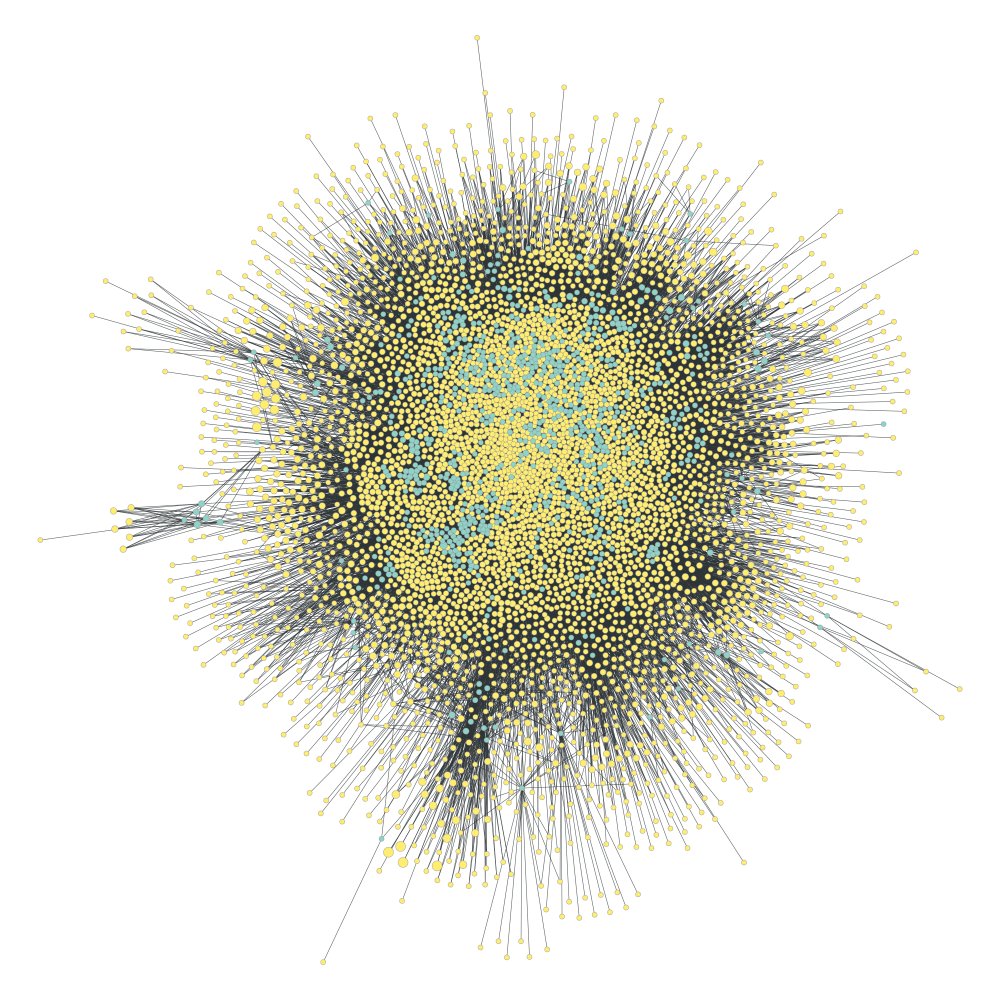

False

In [16]:
#g.vp['degree'] = g.get_out_degrees(g.get_vertices())


g.vp['nodesize'] = prop_to_size(local_clustering(g), mi=10, ma=20)

pos = sfdp_layout(g)

pos = graph_draw(g,pos, vertex_size=g.vp['nodesize'],  vertex_font_size=10, output_size=(2000, 2000), 
                vertex_fill_color=g.vp['oil_blender'] )# vertex_text=g.vp['label'],

graph_tool.topology.is_bipartite(g)

In [104]:
print(Names)
vplabel.get_2d_array([0])


['abies alba cone oil', 'abies alba leaf oil', 'abies amabilis oil canada', 'abies balsamea bark oil', 'abies grandis oil canada']


array([['abies alba cone oil', 'abies alba leaf oil',
        'abies amabilis oil canada', 'abies balsamea bark oil',
        'abies grandis oil canada']], 
      dtype='<U25')

In [91]:

g
g = Graph(directed=False)
print(g)
vplabel = g.new_vertex_property("string")
vplabel[g.vertex(0)] = "Hidvf"
vplabel[g.vertex(0)] = "Hidfvgfdbvgdvf"
g.vp['label'] =vplabel
print(g.vp['label'])
print(vplabel.a)
print(g.list_properties())
print(g)
vprop_double = g.new_vertex_property("double")            # Double-precision floating point
vprop_double[g.vertex(4)] = 3.1416

print(vprop_double.a)
print(g.list_properties())
vplabel.get_2d_array([0])

<Graph object, undirected, with 0 vertices and 0 edges at 0x2b816f9e3c88>


ValueError: Invalid vertex index: 0

In [97]:

#g.vp['label'].key_type()
#g.vp['label'].value_type()

g.num_vertices()

0